# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

/home/ec2-user/anaconda3/envs/tensorflow_p36/lib/python3.6/site-packages/matplotlib/__init__.py:1067: UserWarning: Duplicate key in file "/home/ec2-user/.config/matplotlib/matplotlibrc", line #2
  (fname, cnt))
/home/ec2-user/anaconda3/envs/tensorflow_p36/lib/python3.6/site-packages/matplotlib/__init__.py:1067: UserWarning: Duplicate key in file "/home/ec2-user/.config/matplotlib/matplotlibrc", line #3
  (fname, cnt))


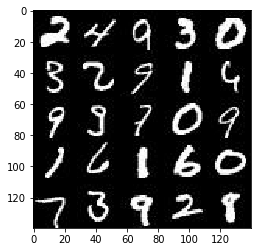

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

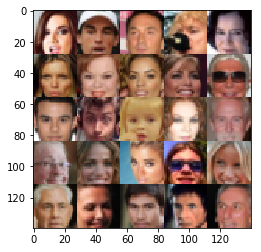

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

/home/ec2-user/anaconda3/envs/tensorflow_p36/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


TensorFlow Version: 1.6.0
Default GPU Device: /device:GPU:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    input_real = tf.placeholder(tf.float32, [None, image_width, image_height, image_channels], "input_real")
    input_z = tf.placeholder(tf.float32, [None, z_dim], "input_z")
    learning_rate = tf.placeholder(tf.float32, None, "learning_rate")

    return input_real, input_z, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [6]:
def discriminator(images, reuse=False, alpha=0.01):
    """
    Create the discriminator network
    :param image: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    with tf.variable_scope('discriminator', reuse=reuse):
        x1 = tf.layers.conv2d(images, 64, 5, strides=2, padding="same", kernel_initializer=tf.contrib.layers.xavier_initializer())
        relu1 = tf.maximum(alpha * x1, x1)

        x2 = tf.layers.conv2d(relu1, 128, 5, strides=2, padding="same", kernel_initializer=tf.contrib.layers.xavier_initializer())
        bn2 = tf.layers.batch_normalization(x2, training=True)
        relu2 = tf.maximum(alpha * bn2, bn2)
        d2 = tf.nn.dropout(relu2, 0.8)

        x3 = tf.layers.conv2d(d2, 256, 5, strides=2, padding="same", kernel_initializer=tf.contrib.layers.xavier_initializer())
        bn3 = tf.layers.batch_normalization(x3, training=True)
        relu3 = tf.maximum(alpha * bn3, bn3)
        d3 = tf.nn.dropout(relu3, 0.8)

        flat = tf.reshape(d3, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)

    return out, logits

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [7]:
def generator(z, out_channel_dim, is_train=True, alpha=0.01):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    with tf.variable_scope("generator", reuse=not is_train):
        x1 = tf.layers.dense(z, 4*4*256)
        x1 = tf.reshape(x1, (-1, 4, 4, 256))
        x1 = tf.layers.dense(z, 7*7*512)
        x1 = tf.reshape(x1, (-1, 7, 7, 512))
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        relu1 = tf.maximum(alpha * x1, x1)
        
        x2 = tf.layers.conv2d_transpose(relu1, 256, 5, 2, 'same', kernel_initializer=tf.contrib.layers.xavier_initializer())
        bn2 = tf.layers.batch_normalization(x2, training=is_train)
        relu2 = tf.maximum(alpha * bn2, bn2)
        d2 = tf.nn.dropout(relu2, 0.8)
        
        x3 = tf.layers.conv2d_transpose(x2, 128, 5, 2, 'same', kernel_initializer=tf.contrib.layers.xavier_initializer())
        bn3 = tf.layers.batch_normalization(x3, training=is_train)
        relu3 = tf.maximum(alpha * bn3, bn3)
        d3 = tf.nn.dropout(relu3, 0.8)
        
        logits = tf.layers.conv2d_transpose(d3, out_channel_dim, 5, 1, 'same')
        out = tf.tanh(logits)

        return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [8]:
def model_loss(input_real, input_z, out_channel_dim, alpha=0.9):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    g_model = generator(input_z, out_channel_dim)
    d_model_real, d_logits_real = discriminator(input_real)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_logits_real) * alpha))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_logits_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_logits_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [10]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [11]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    input_real, input_z, lr = model_inputs(data_shape[1], data_shape[2], data_shape[3], z_dim)
    d_loss, g_loss = model_loss(input_real, input_z, data_shape[3])
    d_opt, g_opt = model_opt(d_loss, g_loss, lr, beta1)
    dis, gen, f1 = [], [], []
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            steps = 0
            for batch_images in get_batches(batch_size):
                steps +=1
                batch_images = batch_images * 2
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                _ = sess.run(d_opt, feed_dict={input_real: batch_images, input_z: batch_z, lr: learning_rate})
                _ = sess.run(g_opt, feed_dict={input_real: batch_images, input_z: batch_z, lr: learning_rate})
                train_loss_d = d_loss.eval({input_real: batch_images, input_z: batch_z})
                train_loss_g = g_loss.eval({input_z: batch_z})
                dis.append(train_loss_d)
                gen.append(train_loss_g)
                val = (train_loss_d + train_loss_g) / 2
                f1.append(val)
                if steps % 20 == 0:

                    print("Epoch {}/{}...".format(epoch_i+1, epochs),
                          "Batch {}...".format(steps),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))

                if steps % 200 == 0:
                    show_generator_output(sess, show_n_images, input_z, data_shape[3], data_image_mode)
    return dis, gen, f1

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2... Batch 20... Discriminator Loss: 0.6456... Generator Loss: 1.6505
Epoch 1/2... Batch 40... Discriminator Loss: 1.0095... Generator Loss: 1.1159
Epoch 1/2... Batch 60... Discriminator Loss: 1.3518... Generator Loss: 0.7359
Epoch 1/2... Batch 80... Discriminator Loss: 2.0054... Generator Loss: 0.2956
Epoch 1/2... Batch 100... Discriminator Loss: 1.5965... Generator Loss: 0.7283
Epoch 1/2... Batch 120... Discriminator Loss: 1.3091... Generator Loss: 0.9094
Epoch 1/2... Batch 140... Discriminator Loss: 1.5384... Generator Loss: 0.5098
Epoch 1/2... Batch 160... Discriminator Loss: 1.3613... Generator Loss: 1.6343
Epoch 1/2... Batch 180... Discriminator Loss: 0.9609... Generator Loss: 1.0689
Epoch 1/2... Batch 200... Discriminator Loss: 1.0003... Generator Loss: 1.1790


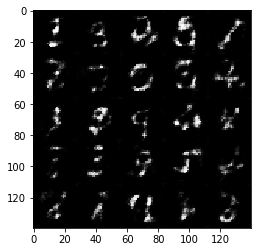

Epoch 1/2... Batch 220... Discriminator Loss: 1.1106... Generator Loss: 1.5356
Epoch 1/2... Batch 240... Discriminator Loss: 1.0232... Generator Loss: 1.1826
Epoch 1/2... Batch 260... Discriminator Loss: 1.2529... Generator Loss: 0.8279
Epoch 1/2... Batch 280... Discriminator Loss: 1.1058... Generator Loss: 0.9399
Epoch 1/2... Batch 300... Discriminator Loss: 1.4958... Generator Loss: 0.5481
Epoch 1/2... Batch 320... Discriminator Loss: 1.2367... Generator Loss: 0.7501
Epoch 1/2... Batch 340... Discriminator Loss: 1.1971... Generator Loss: 0.9877
Epoch 1/2... Batch 360... Discriminator Loss: 1.2197... Generator Loss: 0.9340
Epoch 1/2... Batch 380... Discriminator Loss: 1.1784... Generator Loss: 1.4323
Epoch 1/2... Batch 400... Discriminator Loss: 1.3588... Generator Loss: 1.7363


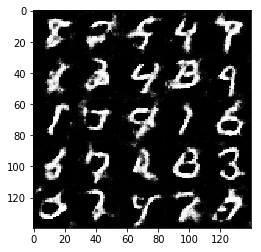

Epoch 1/2... Batch 420... Discriminator Loss: 1.5695... Generator Loss: 0.4599
Epoch 1/2... Batch 440... Discriminator Loss: 1.1679... Generator Loss: 1.6431
Epoch 1/2... Batch 460... Discriminator Loss: 1.1289... Generator Loss: 1.0293
Epoch 1/2... Batch 480... Discriminator Loss: 1.3238... Generator Loss: 0.7796
Epoch 1/2... Batch 500... Discriminator Loss: 1.0608... Generator Loss: 0.9604
Epoch 1/2... Batch 520... Discriminator Loss: 1.2731... Generator Loss: 0.7555
Epoch 1/2... Batch 540... Discriminator Loss: 1.1920... Generator Loss: 1.1739
Epoch 1/2... Batch 560... Discriminator Loss: 0.9281... Generator Loss: 1.0921
Epoch 1/2... Batch 580... Discriminator Loss: 1.1812... Generator Loss: 0.9493
Epoch 1/2... Batch 600... Discriminator Loss: 1.1798... Generator Loss: 1.6398


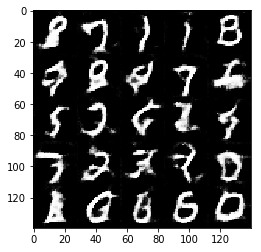

Epoch 1/2... Batch 620... Discriminator Loss: 1.2609... Generator Loss: 0.7447
Epoch 1/2... Batch 640... Discriminator Loss: 1.1444... Generator Loss: 1.0963
Epoch 1/2... Batch 660... Discriminator Loss: 1.2582... Generator Loss: 1.8242
Epoch 1/2... Batch 680... Discriminator Loss: 1.2858... Generator Loss: 0.6725
Epoch 1/2... Batch 700... Discriminator Loss: 1.1767... Generator Loss: 1.3288
Epoch 1/2... Batch 720... Discriminator Loss: 0.9782... Generator Loss: 1.3712
Epoch 1/2... Batch 740... Discriminator Loss: 1.2448... Generator Loss: 0.6277
Epoch 1/2... Batch 760... Discriminator Loss: 1.0728... Generator Loss: 1.8055
Epoch 1/2... Batch 780... Discriminator Loss: 1.6512... Generator Loss: 0.4734
Epoch 1/2... Batch 800... Discriminator Loss: 1.2611... Generator Loss: 0.6661


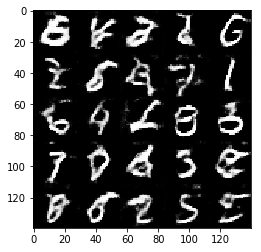

Epoch 1/2... Batch 820... Discriminator Loss: 1.0527... Generator Loss: 1.3956
Epoch 1/2... Batch 840... Discriminator Loss: 1.0931... Generator Loss: 1.0458
Epoch 1/2... Batch 860... Discriminator Loss: 1.3596... Generator Loss: 0.6532
Epoch 1/2... Batch 880... Discriminator Loss: 1.2803... Generator Loss: 0.6406
Epoch 1/2... Batch 900... Discriminator Loss: 1.2512... Generator Loss: 0.7788
Epoch 1/2... Batch 920... Discriminator Loss: 1.1501... Generator Loss: 0.8651
Epoch 2/2... Batch 20... Discriminator Loss: 0.9164... Generator Loss: 1.2500
Epoch 2/2... Batch 40... Discriminator Loss: 0.9070... Generator Loss: 1.3530
Epoch 2/2... Batch 60... Discriminator Loss: 1.0797... Generator Loss: 0.9796
Epoch 2/2... Batch 80... Discriminator Loss: 1.2874... Generator Loss: 0.7395
Epoch 2/2... Batch 100... Discriminator Loss: 1.0812... Generator Loss: 1.5130
Epoch 2/2... Batch 120... Discriminator Loss: 1.1413... Generator Loss: 0.7963
Epoch 2/2... Batch 140... Discriminator Loss: 1.2440... 

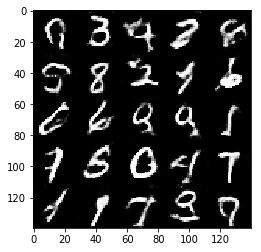

Epoch 2/2... Batch 220... Discriminator Loss: 0.8845... Generator Loss: 1.9784
Epoch 2/2... Batch 240... Discriminator Loss: 1.0755... Generator Loss: 1.0268
Epoch 2/2... Batch 260... Discriminator Loss: 0.9950... Generator Loss: 1.0075
Epoch 2/2... Batch 280... Discriminator Loss: 1.1054... Generator Loss: 0.8298
Epoch 2/2... Batch 300... Discriminator Loss: 1.2368... Generator Loss: 0.7643
Epoch 2/2... Batch 320... Discriminator Loss: 0.9886... Generator Loss: 1.0735
Epoch 2/2... Batch 340... Discriminator Loss: 0.9186... Generator Loss: 1.1207
Epoch 2/2... Batch 360... Discriminator Loss: 1.0056... Generator Loss: 1.0889
Epoch 2/2... Batch 380... Discriminator Loss: 1.2531... Generator Loss: 0.7552
Epoch 2/2... Batch 400... Discriminator Loss: 0.9462... Generator Loss: 2.0088


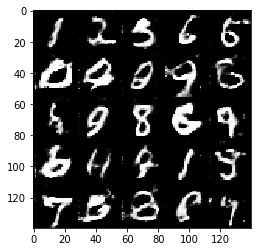

Epoch 2/2... Batch 420... Discriminator Loss: 0.9422... Generator Loss: 1.5262
Epoch 2/2... Batch 440... Discriminator Loss: 0.8873... Generator Loss: 1.9585
Epoch 2/2... Batch 460... Discriminator Loss: 0.8215... Generator Loss: 1.5885
Epoch 2/2... Batch 480... Discriminator Loss: 0.9618... Generator Loss: 1.6660
Epoch 2/2... Batch 500... Discriminator Loss: 1.1627... Generator Loss: 0.9030
Epoch 2/2... Batch 520... Discriminator Loss: 1.1555... Generator Loss: 0.8804
Epoch 2/2... Batch 540... Discriminator Loss: 0.9578... Generator Loss: 1.3067
Epoch 2/2... Batch 560... Discriminator Loss: 0.9110... Generator Loss: 1.4129
Epoch 2/2... Batch 580... Discriminator Loss: 1.2851... Generator Loss: 0.9313
Epoch 2/2... Batch 600... Discriminator Loss: 0.9986... Generator Loss: 1.1369


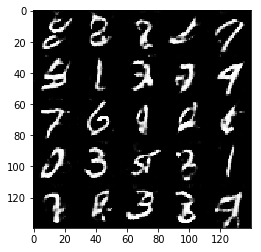

Epoch 2/2... Batch 620... Discriminator Loss: 1.0612... Generator Loss: 0.9311
Epoch 2/2... Batch 640... Discriminator Loss: 0.9896... Generator Loss: 1.8075
Epoch 2/2... Batch 660... Discriminator Loss: 0.8693... Generator Loss: 1.2803
Epoch 2/2... Batch 680... Discriminator Loss: 1.0398... Generator Loss: 0.9434
Epoch 2/2... Batch 700... Discriminator Loss: 0.8987... Generator Loss: 1.3717
Epoch 2/2... Batch 720... Discriminator Loss: 0.8563... Generator Loss: 1.4728
Epoch 2/2... Batch 740... Discriminator Loss: 1.0961... Generator Loss: 1.0486
Epoch 2/2... Batch 760... Discriminator Loss: 1.0187... Generator Loss: 1.0737
Epoch 2/2... Batch 780... Discriminator Loss: 1.2312... Generator Loss: 0.7989
Epoch 2/2... Batch 800... Discriminator Loss: 0.8062... Generator Loss: 1.6167


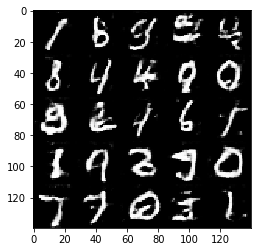

Epoch 2/2... Batch 820... Discriminator Loss: 1.1153... Generator Loss: 2.3253
Epoch 2/2... Batch 840... Discriminator Loss: 0.8812... Generator Loss: 1.3766
Epoch 2/2... Batch 860... Discriminator Loss: 1.0888... Generator Loss: 0.9276
Epoch 2/2... Batch 880... Discriminator Loss: 0.9426... Generator Loss: 1.2359
Epoch 2/2... Batch 900... Discriminator Loss: 0.8302... Generator Loss: 1.8483
Epoch 2/2... Batch 920... Discriminator Loss: 0.7848... Generator Loss: 1.6761


In [12]:
batch_size = 64
z_dim = 164
learning_rate = 0.0002
beta1 = 0.4


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/10... Batch 20... Discriminator Loss: 0.5552... Generator Loss: 2.4103
Epoch 1/10... Batch 40... Discriminator Loss: 0.3912... Generator Loss: 4.2242
Epoch 1/10... Batch 60... Discriminator Loss: 1.8449... Generator Loss: 0.5678
Epoch 1/10... Batch 80... Discriminator Loss: 0.5326... Generator Loss: 3.2501
Epoch 1/10... Batch 100... Discriminator Loss: 0.4207... Generator Loss: 4.3603
Epoch 1/10... Batch 120... Discriminator Loss: 0.5147... Generator Loss: 2.6756
Epoch 1/10... Batch 140... Discriminator Loss: 0.4301... Generator Loss: 4.6150
Epoch 1/10... Batch 160... Discriminator Loss: 2.8393... Generator Loss: 10.0612
Epoch 1/10... Batch 180... Discriminator Loss: 0.4993... Generator Loss: 3.7260
Epoch 1/10... Batch 200... Discriminator Loss: 0.4641... Generator Loss: 3.1522


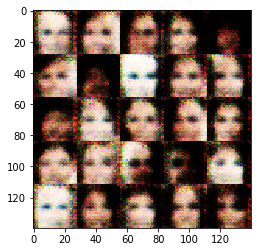

Epoch 1/10... Batch 220... Discriminator Loss: 0.4865... Generator Loss: 3.0062
Epoch 1/10... Batch 240... Discriminator Loss: 0.4694... Generator Loss: 3.2220
Epoch 1/10... Batch 260... Discriminator Loss: 0.5715... Generator Loss: 2.2278
Epoch 1/10... Batch 280... Discriminator Loss: 0.4819... Generator Loss: 2.6776
Epoch 1/10... Batch 300... Discriminator Loss: 0.6986... Generator Loss: 2.0415
Epoch 1/10... Batch 320... Discriminator Loss: 0.7881... Generator Loss: 2.1672
Epoch 1/10... Batch 340... Discriminator Loss: 0.6996... Generator Loss: 1.6772
Epoch 1/10... Batch 360... Discriminator Loss: 1.5986... Generator Loss: 0.5239
Epoch 1/10... Batch 380... Discriminator Loss: 0.7499... Generator Loss: 1.4270
Epoch 1/10... Batch 400... Discriminator Loss: 0.8455... Generator Loss: 1.3728


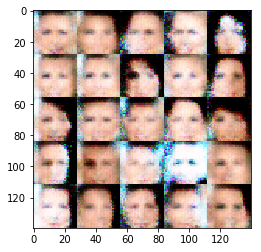

Epoch 1/10... Batch 420... Discriminator Loss: 1.1836... Generator Loss: 0.7597
Epoch 1/10... Batch 440... Discriminator Loss: 0.6608... Generator Loss: 2.2006
Epoch 1/10... Batch 460... Discriminator Loss: 1.1255... Generator Loss: 0.9460
Epoch 1/10... Batch 480... Discriminator Loss: 0.8275... Generator Loss: 4.1413
Epoch 1/10... Batch 500... Discriminator Loss: 1.0076... Generator Loss: 1.0130
Epoch 1/10... Batch 520... Discriminator Loss: 0.8414... Generator Loss: 1.3625
Epoch 1/10... Batch 540... Discriminator Loss: 1.1146... Generator Loss: 3.1425
Epoch 1/10... Batch 560... Discriminator Loss: 0.8430... Generator Loss: 1.2221
Epoch 1/10... Batch 580... Discriminator Loss: 1.0226... Generator Loss: 2.8060
Epoch 1/10... Batch 600... Discriminator Loss: 0.6606... Generator Loss: 2.2839


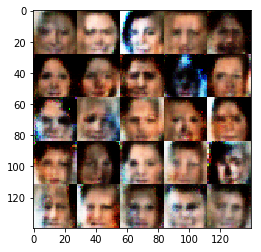

Epoch 1/10... Batch 620... Discriminator Loss: 1.1024... Generator Loss: 0.8055
Epoch 1/10... Batch 640... Discriminator Loss: 0.7400... Generator Loss: 1.8338
Epoch 1/10... Batch 660... Discriminator Loss: 1.3697... Generator Loss: 0.5812
Epoch 1/10... Batch 680... Discriminator Loss: 1.0634... Generator Loss: 0.8923
Epoch 1/10... Batch 700... Discriminator Loss: 1.1428... Generator Loss: 0.7548
Epoch 1/10... Batch 720... Discriminator Loss: 0.9107... Generator Loss: 2.2520
Epoch 1/10... Batch 740... Discriminator Loss: 1.0394... Generator Loss: 2.2906
Epoch 1/10... Batch 760... Discriminator Loss: 0.7949... Generator Loss: 1.5171
Epoch 1/10... Batch 780... Discriminator Loss: 0.9193... Generator Loss: 1.0526
Epoch 1/10... Batch 800... Discriminator Loss: 0.8045... Generator Loss: 2.5132


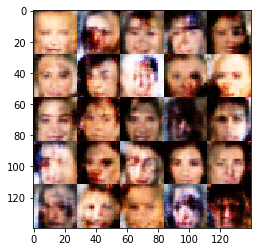

Epoch 1/10... Batch 820... Discriminator Loss: 0.9157... Generator Loss: 2.0890
Epoch 1/10... Batch 840... Discriminator Loss: 0.7494... Generator Loss: 1.5601
Epoch 1/10... Batch 860... Discriminator Loss: 0.7715... Generator Loss: 2.1017
Epoch 1/10... Batch 880... Discriminator Loss: 1.5350... Generator Loss: 0.4148
Epoch 1/10... Batch 900... Discriminator Loss: 1.0732... Generator Loss: 1.1044
Epoch 1/10... Batch 920... Discriminator Loss: 0.9417... Generator Loss: 1.9158
Epoch 1/10... Batch 940... Discriminator Loss: 1.0016... Generator Loss: 1.3013
Epoch 1/10... Batch 960... Discriminator Loss: 1.0775... Generator Loss: 0.9948
Epoch 1/10... Batch 980... Discriminator Loss: 1.7278... Generator Loss: 0.4033
Epoch 1/10... Batch 1000... Discriminator Loss: 1.0529... Generator Loss: 1.3000


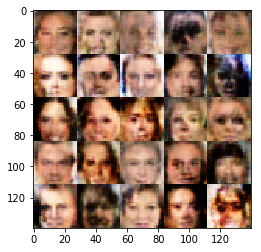

Epoch 1/10... Batch 1020... Discriminator Loss: 1.4964... Generator Loss: 0.5490
Epoch 1/10... Batch 1040... Discriminator Loss: 1.1991... Generator Loss: 0.9291
Epoch 1/10... Batch 1060... Discriminator Loss: 1.1864... Generator Loss: 1.1830
Epoch 1/10... Batch 1080... Discriminator Loss: 1.4607... Generator Loss: 0.6161
Epoch 1/10... Batch 1100... Discriminator Loss: 1.2913... Generator Loss: 1.0110
Epoch 1/10... Batch 1120... Discriminator Loss: 1.2767... Generator Loss: 0.7034
Epoch 1/10... Batch 1140... Discriminator Loss: 1.1922... Generator Loss: 1.1539
Epoch 1/10... Batch 1160... Discriminator Loss: 1.2105... Generator Loss: 1.0051
Epoch 1/10... Batch 1180... Discriminator Loss: 1.4490... Generator Loss: 0.7520
Epoch 1/10... Batch 1200... Discriminator Loss: 1.6365... Generator Loss: 0.5173


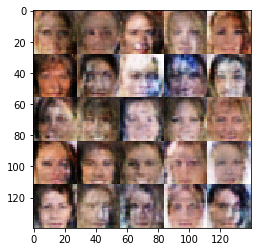

Epoch 1/10... Batch 1220... Discriminator Loss: 1.4132... Generator Loss: 0.6518
Epoch 1/10... Batch 1240... Discriminator Loss: 1.7169... Generator Loss: 0.3853
Epoch 1/10... Batch 1260... Discriminator Loss: 1.4547... Generator Loss: 0.6868
Epoch 1/10... Batch 1280... Discriminator Loss: 1.1809... Generator Loss: 0.9151
Epoch 1/10... Batch 1300... Discriminator Loss: 1.4424... Generator Loss: 0.6425
Epoch 1/10... Batch 1320... Discriminator Loss: 1.3581... Generator Loss: 0.9942
Epoch 1/10... Batch 1340... Discriminator Loss: 1.3795... Generator Loss: 0.9668
Epoch 1/10... Batch 1360... Discriminator Loss: 1.4906... Generator Loss: 0.6345
Epoch 1/10... Batch 1380... Discriminator Loss: 1.2300... Generator Loss: 0.9891
Epoch 1/10... Batch 1400... Discriminator Loss: 1.4912... Generator Loss: 0.4438


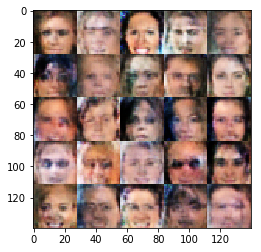

Epoch 1/10... Batch 1420... Discriminator Loss: 1.4073... Generator Loss: 1.0224
Epoch 1/10... Batch 1440... Discriminator Loss: 1.4976... Generator Loss: 0.6830
Epoch 1/10... Batch 1460... Discriminator Loss: 1.3815... Generator Loss: 0.6915
Epoch 1/10... Batch 1480... Discriminator Loss: 1.2719... Generator Loss: 1.2238
Epoch 1/10... Batch 1500... Discriminator Loss: 1.4473... Generator Loss: 0.5926
Epoch 1/10... Batch 1520... Discriminator Loss: 1.1424... Generator Loss: 0.9013
Epoch 1/10... Batch 1540... Discriminator Loss: 1.0724... Generator Loss: 1.0371
Epoch 1/10... Batch 1560... Discriminator Loss: 1.2403... Generator Loss: 0.7472
Epoch 1/10... Batch 1580... Discriminator Loss: 1.2084... Generator Loss: 0.9321
Epoch 1/10... Batch 1600... Discriminator Loss: 1.3334... Generator Loss: 0.6880


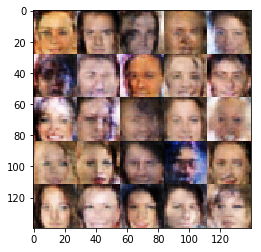

Epoch 1/10... Batch 1620... Discriminator Loss: 1.4445... Generator Loss: 0.5921
Epoch 1/10... Batch 1640... Discriminator Loss: 1.4616... Generator Loss: 0.6613
Epoch 1/10... Batch 1660... Discriminator Loss: 1.3079... Generator Loss: 0.6229
Epoch 1/10... Batch 1680... Discriminator Loss: 1.2227... Generator Loss: 0.8343
Epoch 1/10... Batch 1700... Discriminator Loss: 1.3576... Generator Loss: 0.8829
Epoch 1/10... Batch 1720... Discriminator Loss: 1.3737... Generator Loss: 0.7809
Epoch 1/10... Batch 1740... Discriminator Loss: 1.4931... Generator Loss: 0.8993
Epoch 1/10... Batch 1760... Discriminator Loss: 1.1466... Generator Loss: 1.1428
Epoch 1/10... Batch 1780... Discriminator Loss: 1.2694... Generator Loss: 0.9236
Epoch 1/10... Batch 1800... Discriminator Loss: 1.3533... Generator Loss: 0.6052


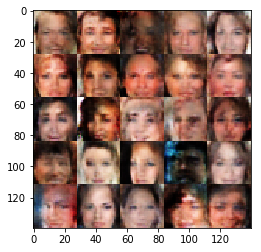

Epoch 1/10... Batch 1820... Discriminator Loss: 1.3242... Generator Loss: 0.8150
Epoch 1/10... Batch 1840... Discriminator Loss: 1.4723... Generator Loss: 0.4992
Epoch 1/10... Batch 1860... Discriminator Loss: 1.2364... Generator Loss: 0.8090
Epoch 1/10... Batch 1880... Discriminator Loss: 1.3279... Generator Loss: 0.6943
Epoch 1/10... Batch 1900... Discriminator Loss: 1.2764... Generator Loss: 0.8493
Epoch 1/10... Batch 1920... Discriminator Loss: 1.2762... Generator Loss: 0.8601
Epoch 1/10... Batch 1940... Discriminator Loss: 1.4757... Generator Loss: 0.7193
Epoch 1/10... Batch 1960... Discriminator Loss: 1.6623... Generator Loss: 0.4839
Epoch 1/10... Batch 1980... Discriminator Loss: 1.4053... Generator Loss: 0.7206
Epoch 1/10... Batch 2000... Discriminator Loss: 1.6765... Generator Loss: 0.5070


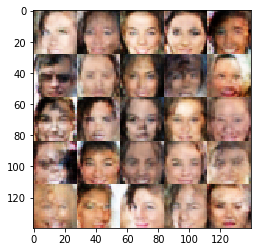

Epoch 1/10... Batch 2020... Discriminator Loss: 1.2472... Generator Loss: 0.7046
Epoch 1/10... Batch 2040... Discriminator Loss: 1.2176... Generator Loss: 1.0558
Epoch 1/10... Batch 2060... Discriminator Loss: 1.5577... Generator Loss: 0.5404
Epoch 1/10... Batch 2080... Discriminator Loss: 1.4722... Generator Loss: 0.6247
Epoch 1/10... Batch 2100... Discriminator Loss: 1.2499... Generator Loss: 0.8121
Epoch 1/10... Batch 2120... Discriminator Loss: 1.0894... Generator Loss: 0.9832
Epoch 1/10... Batch 2140... Discriminator Loss: 1.6062... Generator Loss: 0.6076
Epoch 1/10... Batch 2160... Discriminator Loss: 1.7373... Generator Loss: 0.4115
Epoch 1/10... Batch 2180... Discriminator Loss: 1.4873... Generator Loss: 0.6308
Epoch 1/10... Batch 2200... Discriminator Loss: 1.1475... Generator Loss: 0.9794


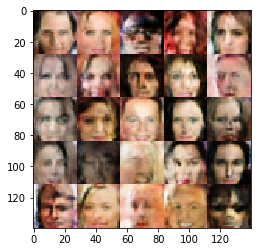

Epoch 1/10... Batch 2220... Discriminator Loss: 1.3486... Generator Loss: 0.5984
Epoch 1/10... Batch 2240... Discriminator Loss: 0.9590... Generator Loss: 1.3092
Epoch 1/10... Batch 2260... Discriminator Loss: 1.2237... Generator Loss: 0.9315
Epoch 1/10... Batch 2280... Discriminator Loss: 1.5270... Generator Loss: 0.5230
Epoch 1/10... Batch 2300... Discriminator Loss: 1.1490... Generator Loss: 0.7314
Epoch 1/10... Batch 2320... Discriminator Loss: 1.2268... Generator Loss: 1.0094
Epoch 1/10... Batch 2340... Discriminator Loss: 1.4209... Generator Loss: 0.8842
Epoch 1/10... Batch 2360... Discriminator Loss: 1.2871... Generator Loss: 0.6980
Epoch 1/10... Batch 2380... Discriminator Loss: 1.3600... Generator Loss: 0.7692
Epoch 1/10... Batch 2400... Discriminator Loss: 1.5810... Generator Loss: 0.6712


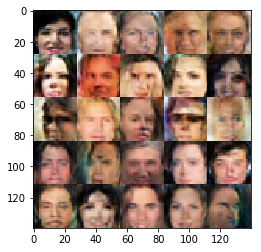

Epoch 1/10... Batch 2420... Discriminator Loss: 1.2947... Generator Loss: 0.7225
Epoch 1/10... Batch 2440... Discriminator Loss: 1.3646... Generator Loss: 0.7065
Epoch 1/10... Batch 2460... Discriminator Loss: 1.3842... Generator Loss: 0.6714
Epoch 1/10... Batch 2480... Discriminator Loss: 1.4316... Generator Loss: 0.7476
Epoch 1/10... Batch 2500... Discriminator Loss: 1.3521... Generator Loss: 0.6650
Epoch 1/10... Batch 2520... Discriminator Loss: 1.3503... Generator Loss: 0.8963
Epoch 1/10... Batch 2540... Discriminator Loss: 1.0826... Generator Loss: 1.0400
Epoch 1/10... Batch 2560... Discriminator Loss: 1.5093... Generator Loss: 0.6010
Epoch 1/10... Batch 2580... Discriminator Loss: 1.1972... Generator Loss: 0.9151
Epoch 1/10... Batch 2600... Discriminator Loss: 1.8103... Generator Loss: 0.4619


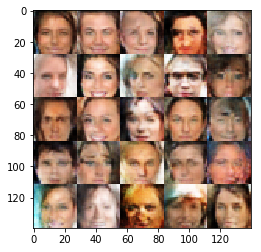

Epoch 1/10... Batch 2620... Discriminator Loss: 1.3391... Generator Loss: 0.5843
Epoch 1/10... Batch 2640... Discriminator Loss: 1.1964... Generator Loss: 0.9560
Epoch 1/10... Batch 2660... Discriminator Loss: 1.3390... Generator Loss: 1.0656
Epoch 1/10... Batch 2680... Discriminator Loss: 1.2954... Generator Loss: 0.9435
Epoch 1/10... Batch 2700... Discriminator Loss: 1.3762... Generator Loss: 0.8913
Epoch 1/10... Batch 2720... Discriminator Loss: 1.2013... Generator Loss: 0.8085
Epoch 1/10... Batch 2740... Discriminator Loss: 1.2597... Generator Loss: 0.6514
Epoch 1/10... Batch 2760... Discriminator Loss: 1.1768... Generator Loss: 0.9160
Epoch 1/10... Batch 2780... Discriminator Loss: 1.3041... Generator Loss: 1.0096
Epoch 1/10... Batch 2800... Discriminator Loss: 1.2183... Generator Loss: 0.9968


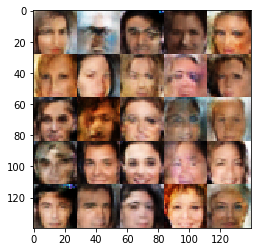

Epoch 1/10... Batch 2820... Discriminator Loss: 1.1886... Generator Loss: 0.9225
Epoch 1/10... Batch 2840... Discriminator Loss: 1.3886... Generator Loss: 0.7108
Epoch 1/10... Batch 2860... Discriminator Loss: 1.3014... Generator Loss: 0.8821
Epoch 1/10... Batch 2880... Discriminator Loss: 1.2817... Generator Loss: 0.7272
Epoch 1/10... Batch 2900... Discriminator Loss: 1.3391... Generator Loss: 1.1502
Epoch 1/10... Batch 2920... Discriminator Loss: 1.3117... Generator Loss: 0.7983
Epoch 1/10... Batch 2940... Discriminator Loss: 0.9687... Generator Loss: 1.1478
Epoch 1/10... Batch 2960... Discriminator Loss: 1.3300... Generator Loss: 0.8064
Epoch 1/10... Batch 2980... Discriminator Loss: 1.1299... Generator Loss: 0.9594
Epoch 1/10... Batch 3000... Discriminator Loss: 1.2209... Generator Loss: 0.7832


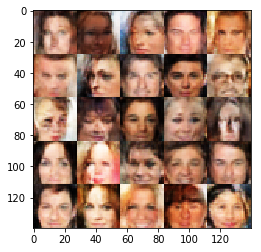

Epoch 1/10... Batch 3020... Discriminator Loss: 1.1510... Generator Loss: 1.0774
Epoch 1/10... Batch 3040... Discriminator Loss: 1.1415... Generator Loss: 0.8220
Epoch 1/10... Batch 3060... Discriminator Loss: 1.1980... Generator Loss: 0.7715
Epoch 1/10... Batch 3080... Discriminator Loss: 1.1098... Generator Loss: 0.9310
Epoch 1/10... Batch 3100... Discriminator Loss: 1.1661... Generator Loss: 1.0248
Epoch 1/10... Batch 3120... Discriminator Loss: 1.4710... Generator Loss: 0.5380
Epoch 1/10... Batch 3140... Discriminator Loss: 1.8721... Generator Loss: 0.3451
Epoch 1/10... Batch 3160... Discriminator Loss: 1.3668... Generator Loss: 0.7989
Epoch 2/10... Batch 20... Discriminator Loss: 1.1777... Generator Loss: 1.2047
Epoch 2/10... Batch 40... Discriminator Loss: 1.5778... Generator Loss: 0.5922
Epoch 2/10... Batch 60... Discriminator Loss: 1.3986... Generator Loss: 0.7523
Epoch 2/10... Batch 80... Discriminator Loss: 1.0616... Generator Loss: 1.3013
Epoch 2/10... Batch 100... Discrimin

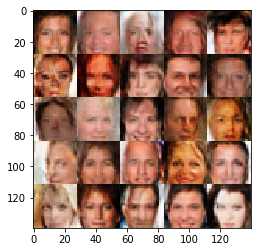

Epoch 2/10... Batch 220... Discriminator Loss: 1.3849... Generator Loss: 0.6522
Epoch 2/10... Batch 240... Discriminator Loss: 1.2477... Generator Loss: 0.9812
Epoch 2/10... Batch 260... Discriminator Loss: 1.3755... Generator Loss: 0.6109
Epoch 2/10... Batch 280... Discriminator Loss: 1.3584... Generator Loss: 0.6486
Epoch 2/10... Batch 300... Discriminator Loss: 2.3414... Generator Loss: 0.2613
Epoch 2/10... Batch 320... Discriminator Loss: 1.3521... Generator Loss: 0.7400
Epoch 2/10... Batch 340... Discriminator Loss: 1.5431... Generator Loss: 0.7622
Epoch 2/10... Batch 360... Discriminator Loss: 1.2489... Generator Loss: 0.7213
Epoch 2/10... Batch 380... Discriminator Loss: 1.1855... Generator Loss: 0.6630
Epoch 2/10... Batch 400... Discriminator Loss: 1.3345... Generator Loss: 0.8985


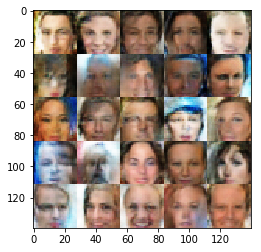

Epoch 2/10... Batch 420... Discriminator Loss: 1.1741... Generator Loss: 1.0352
Epoch 2/10... Batch 440... Discriminator Loss: 1.1914... Generator Loss: 1.0410
Epoch 2/10... Batch 460... Discriminator Loss: 1.3378... Generator Loss: 1.0051
Epoch 2/10... Batch 480... Discriminator Loss: 1.7753... Generator Loss: 0.3656
Epoch 2/10... Batch 500... Discriminator Loss: 1.4898... Generator Loss: 0.8221
Epoch 2/10... Batch 520... Discriminator Loss: 1.3034... Generator Loss: 0.8520
Epoch 2/10... Batch 540... Discriminator Loss: 1.5917... Generator Loss: 0.5085
Epoch 2/10... Batch 560... Discriminator Loss: 1.2445... Generator Loss: 0.8831
Epoch 2/10... Batch 580... Discriminator Loss: 1.2959... Generator Loss: 0.7206
Epoch 2/10... Batch 600... Discriminator Loss: 1.1769... Generator Loss: 1.4769


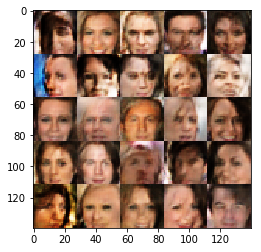

Epoch 2/10... Batch 620... Discriminator Loss: 1.0970... Generator Loss: 1.1826
Epoch 2/10... Batch 640... Discriminator Loss: 1.3163... Generator Loss: 0.6489
Epoch 2/10... Batch 660... Discriminator Loss: 1.3805... Generator Loss: 0.8413
Epoch 2/10... Batch 680... Discriminator Loss: 1.1957... Generator Loss: 0.6525
Epoch 2/10... Batch 700... Discriminator Loss: 1.0581... Generator Loss: 1.1072
Epoch 2/10... Batch 720... Discriminator Loss: 1.3280... Generator Loss: 0.9690
Epoch 2/10... Batch 740... Discriminator Loss: 1.4794... Generator Loss: 0.6946
Epoch 2/10... Batch 760... Discriminator Loss: 1.2214... Generator Loss: 0.8240
Epoch 2/10... Batch 780... Discriminator Loss: 1.0869... Generator Loss: 1.0660
Epoch 2/10... Batch 800... Discriminator Loss: 1.1158... Generator Loss: 0.9214


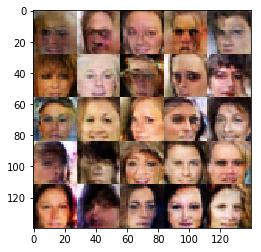

Epoch 2/10... Batch 820... Discriminator Loss: 1.5079... Generator Loss: 0.4718
Epoch 2/10... Batch 840... Discriminator Loss: 1.2392... Generator Loss: 0.8687
Epoch 2/10... Batch 860... Discriminator Loss: 1.3517... Generator Loss: 0.7456
Epoch 2/10... Batch 880... Discriminator Loss: 1.1988... Generator Loss: 0.9004
Epoch 2/10... Batch 900... Discriminator Loss: 1.2667... Generator Loss: 1.1415
Epoch 2/10... Batch 920... Discriminator Loss: 1.4166... Generator Loss: 0.5555
Epoch 2/10... Batch 940... Discriminator Loss: 1.0402... Generator Loss: 1.2564
Epoch 2/10... Batch 960... Discriminator Loss: 1.2109... Generator Loss: 1.0431
Epoch 2/10... Batch 980... Discriminator Loss: 1.3967... Generator Loss: 0.6141
Epoch 2/10... Batch 1000... Discriminator Loss: 1.3228... Generator Loss: 0.7053


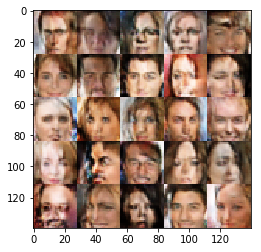

Epoch 2/10... Batch 1020... Discriminator Loss: 1.2307... Generator Loss: 0.7841
Epoch 2/10... Batch 1040... Discriminator Loss: 1.3166... Generator Loss: 0.8090
Epoch 2/10... Batch 1060... Discriminator Loss: 2.1000... Generator Loss: 0.2869
Epoch 2/10... Batch 1080... Discriminator Loss: 1.0368... Generator Loss: 1.1298
Epoch 2/10... Batch 1100... Discriminator Loss: 1.5521... Generator Loss: 0.5827
Epoch 2/10... Batch 1120... Discriminator Loss: 1.3482... Generator Loss: 0.8584
Epoch 2/10... Batch 1140... Discriminator Loss: 1.3343... Generator Loss: 0.7144
Epoch 2/10... Batch 1160... Discriminator Loss: 1.1267... Generator Loss: 1.0578
Epoch 2/10... Batch 1180... Discriminator Loss: 1.5563... Generator Loss: 0.7113
Epoch 2/10... Batch 1200... Discriminator Loss: 1.0932... Generator Loss: 0.9406


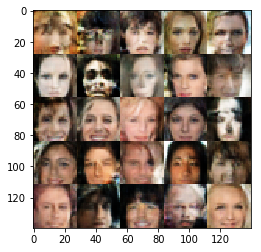

Epoch 2/10... Batch 1220... Discriminator Loss: 1.1811... Generator Loss: 0.6706
Epoch 2/10... Batch 1240... Discriminator Loss: 1.0945... Generator Loss: 0.8858
Epoch 2/10... Batch 1260... Discriminator Loss: 1.3984... Generator Loss: 0.6183
Epoch 2/10... Batch 1280... Discriminator Loss: 1.1140... Generator Loss: 0.9799
Epoch 2/10... Batch 1300... Discriminator Loss: 1.3569... Generator Loss: 0.8984
Epoch 2/10... Batch 1320... Discriminator Loss: 1.2242... Generator Loss: 0.9054
Epoch 2/10... Batch 1340... Discriminator Loss: 1.2100... Generator Loss: 0.9610
Epoch 2/10... Batch 1360... Discriminator Loss: 1.4874... Generator Loss: 0.8348
Epoch 2/10... Batch 1380... Discriminator Loss: 1.3468... Generator Loss: 0.8177
Epoch 2/10... Batch 1400... Discriminator Loss: 1.2306... Generator Loss: 0.9333


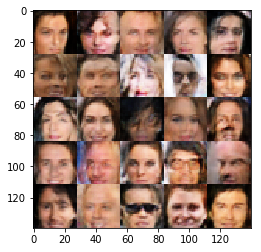

Epoch 2/10... Batch 1420... Discriminator Loss: 1.1702... Generator Loss: 1.0792
Epoch 2/10... Batch 1440... Discriminator Loss: 1.3319... Generator Loss: 0.6300
Epoch 2/10... Batch 1460... Discriminator Loss: 1.3579... Generator Loss: 0.6366
Epoch 2/10... Batch 1480... Discriminator Loss: 1.4887... Generator Loss: 0.6451
Epoch 2/10... Batch 1500... Discriminator Loss: 1.6334... Generator Loss: 0.6193
Epoch 2/10... Batch 1520... Discriminator Loss: 1.3631... Generator Loss: 0.9408
Epoch 2/10... Batch 1540... Discriminator Loss: 1.1939... Generator Loss: 1.1798
Epoch 2/10... Batch 1560... Discriminator Loss: 1.3865... Generator Loss: 0.7849
Epoch 2/10... Batch 1580... Discriminator Loss: 1.6437... Generator Loss: 0.5997
Epoch 2/10... Batch 1600... Discriminator Loss: 1.4141... Generator Loss: 0.8638


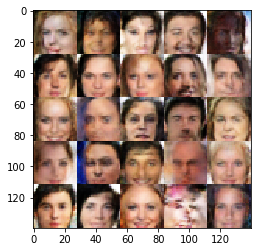

Epoch 2/10... Batch 1620... Discriminator Loss: 1.5175... Generator Loss: 0.5969
Epoch 2/10... Batch 1640... Discriminator Loss: 1.4127... Generator Loss: 0.7035
Epoch 2/10... Batch 1660... Discriminator Loss: 1.2724... Generator Loss: 0.8038
Epoch 2/10... Batch 1680... Discriminator Loss: 1.4682... Generator Loss: 0.7008
Epoch 2/10... Batch 1700... Discriminator Loss: 1.3199... Generator Loss: 0.5713
Epoch 2/10... Batch 1720... Discriminator Loss: 1.4875... Generator Loss: 0.7673
Epoch 2/10... Batch 1740... Discriminator Loss: 1.3299... Generator Loss: 0.6763
Epoch 2/10... Batch 1760... Discriminator Loss: 1.7388... Generator Loss: 0.6416
Epoch 2/10... Batch 1780... Discriminator Loss: 1.1995... Generator Loss: 0.8137
Epoch 2/10... Batch 1800... Discriminator Loss: 1.6533... Generator Loss: 0.4997


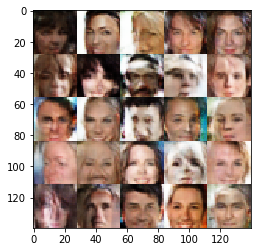

Epoch 2/10... Batch 1820... Discriminator Loss: 1.3068... Generator Loss: 0.8371
Epoch 2/10... Batch 1840... Discriminator Loss: 1.2953... Generator Loss: 0.5672
Epoch 2/10... Batch 1860... Discriminator Loss: 1.1975... Generator Loss: 0.8226
Epoch 2/10... Batch 1880... Discriminator Loss: 1.4897... Generator Loss: 0.6710
Epoch 2/10... Batch 1900... Discriminator Loss: 1.3682... Generator Loss: 1.1550
Epoch 2/10... Batch 1920... Discriminator Loss: 1.4377... Generator Loss: 0.6402
Epoch 2/10... Batch 1940... Discriminator Loss: 1.2138... Generator Loss: 1.5249
Epoch 2/10... Batch 1960... Discriminator Loss: 1.2897... Generator Loss: 0.7086
Epoch 2/10... Batch 1980... Discriminator Loss: 1.4127... Generator Loss: 0.7671
Epoch 2/10... Batch 2000... Discriminator Loss: 1.4036... Generator Loss: 0.6298


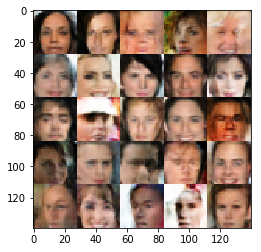

Epoch 2/10... Batch 2020... Discriminator Loss: 1.1674... Generator Loss: 0.8106
Epoch 2/10... Batch 2040... Discriminator Loss: 1.1922... Generator Loss: 0.9032
Epoch 2/10... Batch 2060... Discriminator Loss: 1.5960... Generator Loss: 0.3870
Epoch 2/10... Batch 2080... Discriminator Loss: 1.5716... Generator Loss: 0.5551
Epoch 2/10... Batch 2100... Discriminator Loss: 1.1989... Generator Loss: 0.9060
Epoch 2/10... Batch 2120... Discriminator Loss: 1.2736... Generator Loss: 0.7266
Epoch 2/10... Batch 2140... Discriminator Loss: 1.4320... Generator Loss: 0.8136
Epoch 2/10... Batch 2160... Discriminator Loss: 1.7456... Generator Loss: 0.4451
Epoch 2/10... Batch 2180... Discriminator Loss: 1.3997... Generator Loss: 0.7824
Epoch 2/10... Batch 2200... Discriminator Loss: 1.4420... Generator Loss: 0.6158


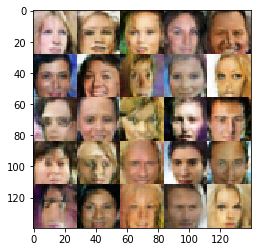

Epoch 2/10... Batch 2220... Discriminator Loss: 1.6388... Generator Loss: 0.4119
Epoch 2/10... Batch 2240... Discriminator Loss: 0.9846... Generator Loss: 1.5273
Epoch 2/10... Batch 2260... Discriminator Loss: 1.1364... Generator Loss: 1.0142
Epoch 2/10... Batch 2280... Discriminator Loss: 1.2664... Generator Loss: 0.9633
Epoch 2/10... Batch 2300... Discriminator Loss: 1.4400... Generator Loss: 0.4851
Epoch 2/10... Batch 2320... Discriminator Loss: 1.3395... Generator Loss: 0.7033
Epoch 2/10... Batch 2340... Discriminator Loss: 1.3054... Generator Loss: 0.7556
Epoch 2/10... Batch 2360... Discriminator Loss: 1.3222... Generator Loss: 0.7816
Epoch 2/10... Batch 2380... Discriminator Loss: 1.1243... Generator Loss: 0.9872
Epoch 2/10... Batch 2400... Discriminator Loss: 1.1619... Generator Loss: 1.0820


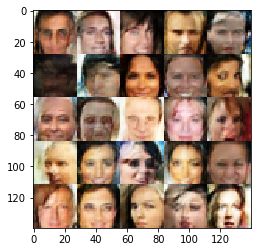

Epoch 2/10... Batch 2420... Discriminator Loss: 1.8632... Generator Loss: 0.4682
Epoch 2/10... Batch 2440... Discriminator Loss: 1.2957... Generator Loss: 0.7432
Epoch 2/10... Batch 2460... Discriminator Loss: 1.9180... Generator Loss: 0.4680
Epoch 2/10... Batch 2480... Discriminator Loss: 1.3068... Generator Loss: 0.8354
Epoch 2/10... Batch 2500... Discriminator Loss: 2.0792... Generator Loss: 0.3324
Epoch 2/10... Batch 2520... Discriminator Loss: 1.3167... Generator Loss: 0.6629
Epoch 2/10... Batch 2540... Discriminator Loss: 1.1831... Generator Loss: 1.4794
Epoch 2/10... Batch 2560... Discriminator Loss: 2.0339... Generator Loss: 0.3875
Epoch 2/10... Batch 2580... Discriminator Loss: 1.2494... Generator Loss: 0.6892
Epoch 2/10... Batch 2600... Discriminator Loss: 1.1944... Generator Loss: 0.9730


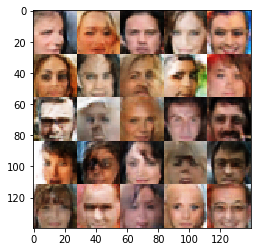

Epoch 2/10... Batch 2620... Discriminator Loss: 1.7018... Generator Loss: 0.4183
Epoch 2/10... Batch 2640... Discriminator Loss: 1.1862... Generator Loss: 1.0290
Epoch 2/10... Batch 2660... Discriminator Loss: 1.3189... Generator Loss: 0.9718
Epoch 2/10... Batch 2680... Discriminator Loss: 1.3609... Generator Loss: 0.8157
Epoch 2/10... Batch 2700... Discriminator Loss: 1.4730... Generator Loss: 0.5021
Epoch 2/10... Batch 2720... Discriminator Loss: 1.4260... Generator Loss: 0.7384
Epoch 2/10... Batch 2740... Discriminator Loss: 1.4107... Generator Loss: 0.6569
Epoch 2/10... Batch 2760... Discriminator Loss: 1.4353... Generator Loss: 0.6569
Epoch 2/10... Batch 2780... Discriminator Loss: 1.5413... Generator Loss: 0.4940
Epoch 2/10... Batch 2800... Discriminator Loss: 1.2632... Generator Loss: 0.8794


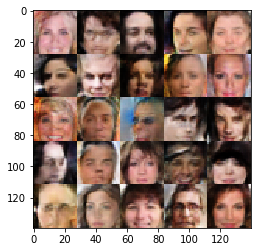

Epoch 2/10... Batch 2820... Discriminator Loss: 1.5564... Generator Loss: 0.6137
Epoch 2/10... Batch 2840... Discriminator Loss: 1.1271... Generator Loss: 1.0241
Epoch 2/10... Batch 2860... Discriminator Loss: 1.1965... Generator Loss: 0.6712
Epoch 2/10... Batch 2880... Discriminator Loss: 1.1679... Generator Loss: 0.8598
Epoch 2/10... Batch 2900... Discriminator Loss: 1.7552... Generator Loss: 0.4123
Epoch 2/10... Batch 2920... Discriminator Loss: 1.2184... Generator Loss: 0.9209
Epoch 2/10... Batch 2940... Discriminator Loss: 1.1392... Generator Loss: 0.9514
Epoch 2/10... Batch 2960... Discriminator Loss: 1.6583... Generator Loss: 0.5283
Epoch 2/10... Batch 2980... Discriminator Loss: 1.1755... Generator Loss: 1.0619
Epoch 2/10... Batch 3000... Discriminator Loss: 1.3551... Generator Loss: 0.8592


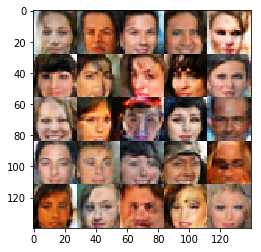

Epoch 2/10... Batch 3020... Discriminator Loss: 1.2599... Generator Loss: 0.8771
Epoch 2/10... Batch 3040... Discriminator Loss: 1.4194... Generator Loss: 0.7564
Epoch 2/10... Batch 3060... Discriminator Loss: 1.3146... Generator Loss: 0.7110
Epoch 2/10... Batch 3080... Discriminator Loss: 1.2697... Generator Loss: 0.7850
Epoch 2/10... Batch 3100... Discriminator Loss: 1.3310... Generator Loss: 1.3524
Epoch 2/10... Batch 3120... Discriminator Loss: 1.3277... Generator Loss: 0.9794
Epoch 2/10... Batch 3140... Discriminator Loss: 1.2629... Generator Loss: 0.9114
Epoch 2/10... Batch 3160... Discriminator Loss: 1.3927... Generator Loss: 0.8531
Epoch 3/10... Batch 20... Discriminator Loss: 1.1844... Generator Loss: 1.1918
Epoch 3/10... Batch 40... Discriminator Loss: 1.2813... Generator Loss: 0.7480
Epoch 3/10... Batch 60... Discriminator Loss: 1.2020... Generator Loss: 0.8931
Epoch 3/10... Batch 80... Discriminator Loss: 1.0944... Generator Loss: 1.2046
Epoch 3/10... Batch 100... Discrimin

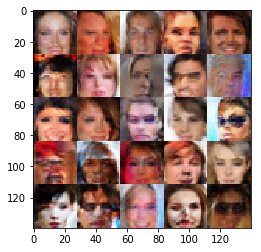

Epoch 3/10... Batch 220... Discriminator Loss: 1.2675... Generator Loss: 0.7992
Epoch 3/10... Batch 240... Discriminator Loss: 1.0413... Generator Loss: 1.0408
Epoch 3/10... Batch 260... Discriminator Loss: 1.3113... Generator Loss: 0.7996
Epoch 3/10... Batch 280... Discriminator Loss: 1.6125... Generator Loss: 0.7105
Epoch 3/10... Batch 300... Discriminator Loss: 1.1486... Generator Loss: 0.8527
Epoch 3/10... Batch 320... Discriminator Loss: 1.3730... Generator Loss: 0.6556
Epoch 3/10... Batch 340... Discriminator Loss: 1.0647... Generator Loss: 1.0062
Epoch 3/10... Batch 360... Discriminator Loss: 1.6650... Generator Loss: 0.4020
Epoch 3/10... Batch 380... Discriminator Loss: 1.3580... Generator Loss: 0.7301
Epoch 3/10... Batch 400... Discriminator Loss: 1.3188... Generator Loss: 0.7307


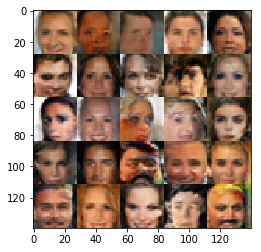

Epoch 3/10... Batch 420... Discriminator Loss: 1.3862... Generator Loss: 0.8999
Epoch 3/10... Batch 440... Discriminator Loss: 1.1199... Generator Loss: 0.7759
Epoch 3/10... Batch 460... Discriminator Loss: 1.1441... Generator Loss: 0.9946
Epoch 3/10... Batch 480... Discriminator Loss: 1.8816... Generator Loss: 0.4379
Epoch 3/10... Batch 500... Discriminator Loss: 1.2310... Generator Loss: 0.8472
Epoch 3/10... Batch 520... Discriminator Loss: 1.3482... Generator Loss: 0.7419
Epoch 3/10... Batch 540... Discriminator Loss: 1.4376... Generator Loss: 0.5384
Epoch 3/10... Batch 560... Discriminator Loss: 1.3502... Generator Loss: 0.9447
Epoch 3/10... Batch 580... Discriminator Loss: 1.3074... Generator Loss: 1.0462
Epoch 3/10... Batch 600... Discriminator Loss: 1.2524... Generator Loss: 0.7722


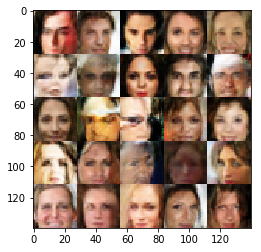

Epoch 3/10... Batch 620... Discriminator Loss: 0.8754... Generator Loss: 1.0901
Epoch 3/10... Batch 640... Discriminator Loss: 1.3557... Generator Loss: 0.7980
Epoch 3/10... Batch 660... Discriminator Loss: 1.4600... Generator Loss: 0.7057
Epoch 3/10... Batch 680... Discriminator Loss: 1.3369... Generator Loss: 0.6866
Epoch 3/10... Batch 700... Discriminator Loss: 1.1946... Generator Loss: 1.0038
Epoch 3/10... Batch 720... Discriminator Loss: 1.2289... Generator Loss: 0.9333
Epoch 3/10... Batch 740... Discriminator Loss: 1.9717... Generator Loss: 0.3294
Epoch 3/10... Batch 760... Discriminator Loss: 1.2464... Generator Loss: 0.8015
Epoch 3/10... Batch 780... Discriminator Loss: 1.1861... Generator Loss: 0.8798
Epoch 3/10... Batch 800... Discriminator Loss: 1.3531... Generator Loss: 0.7964


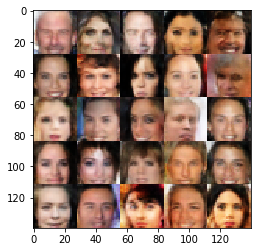

Epoch 3/10... Batch 820... Discriminator Loss: 1.4304... Generator Loss: 0.7124
Epoch 3/10... Batch 840... Discriminator Loss: 1.3251... Generator Loss: 0.8142
Epoch 3/10... Batch 860... Discriminator Loss: 1.1646... Generator Loss: 0.8732
Epoch 3/10... Batch 880... Discriminator Loss: 1.3614... Generator Loss: 0.8213
Epoch 3/10... Batch 900... Discriminator Loss: 1.0739... Generator Loss: 1.3632
Epoch 3/10... Batch 920... Discriminator Loss: 1.3437... Generator Loss: 0.7873
Epoch 3/10... Batch 940... Discriminator Loss: 0.7787... Generator Loss: 1.7020
Epoch 3/10... Batch 960... Discriminator Loss: 1.1614... Generator Loss: 1.0804
Epoch 3/10... Batch 980... Discriminator Loss: 1.1860... Generator Loss: 0.9918
Epoch 3/10... Batch 1000... Discriminator Loss: 1.3236... Generator Loss: 0.6541


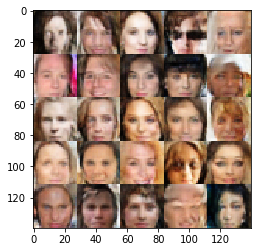

Epoch 3/10... Batch 1020... Discriminator Loss: 1.4192... Generator Loss: 0.8503
Epoch 3/10... Batch 1040... Discriminator Loss: 1.2868... Generator Loss: 0.7461
Epoch 3/10... Batch 1060... Discriminator Loss: 1.5309... Generator Loss: 0.7879
Epoch 3/10... Batch 1080... Discriminator Loss: 1.1426... Generator Loss: 0.8203
Epoch 3/10... Batch 1100... Discriminator Loss: 1.1887... Generator Loss: 0.8683
Epoch 3/10... Batch 1120... Discriminator Loss: 1.0759... Generator Loss: 0.9627
Epoch 3/10... Batch 1140... Discriminator Loss: 1.0764... Generator Loss: 0.9557
Epoch 3/10... Batch 1160... Discriminator Loss: 1.2685... Generator Loss: 0.6021
Epoch 3/10... Batch 1180... Discriminator Loss: 1.4096... Generator Loss: 0.6567
Epoch 3/10... Batch 1200... Discriminator Loss: 1.1827... Generator Loss: 1.2140


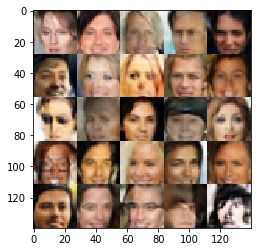

Epoch 3/10... Batch 1220... Discriminator Loss: 1.3913... Generator Loss: 0.6033
Epoch 3/10... Batch 1240... Discriminator Loss: 1.3578... Generator Loss: 0.7324
Epoch 3/10... Batch 1260... Discriminator Loss: 1.0539... Generator Loss: 1.1701
Epoch 3/10... Batch 1280... Discriminator Loss: 1.5376... Generator Loss: 0.7049
Epoch 3/10... Batch 1300... Discriminator Loss: 1.3882... Generator Loss: 0.6203
Epoch 3/10... Batch 1320... Discriminator Loss: 1.3638... Generator Loss: 1.0160
Epoch 3/10... Batch 1340... Discriminator Loss: 1.2148... Generator Loss: 1.0828
Epoch 3/10... Batch 1360... Discriminator Loss: 1.5106... Generator Loss: 0.7794
Epoch 3/10... Batch 1380... Discriminator Loss: 1.2535... Generator Loss: 0.7115
Epoch 3/10... Batch 1400... Discriminator Loss: 1.2404... Generator Loss: 0.8436


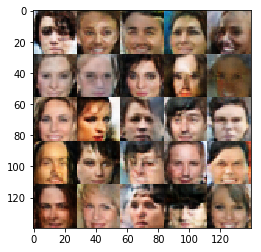

Epoch 3/10... Batch 1420... Discriminator Loss: 1.2862... Generator Loss: 0.9689
Epoch 3/10... Batch 1440... Discriminator Loss: 1.4145... Generator Loss: 0.6218
Epoch 3/10... Batch 1460... Discriminator Loss: 1.2471... Generator Loss: 0.7331
Epoch 3/10... Batch 1480... Discriminator Loss: 1.2355... Generator Loss: 1.0347
Epoch 3/10... Batch 1500... Discriminator Loss: 1.3188... Generator Loss: 0.8007
Epoch 3/10... Batch 1520... Discriminator Loss: 1.0552... Generator Loss: 1.0576
Epoch 3/10... Batch 1540... Discriminator Loss: 1.4967... Generator Loss: 0.4628
Epoch 3/10... Batch 1560... Discriminator Loss: 1.2683... Generator Loss: 0.9333
Epoch 3/10... Batch 1580... Discriminator Loss: 1.3463... Generator Loss: 0.6014
Epoch 3/10... Batch 1600... Discriminator Loss: 1.3718... Generator Loss: 1.0335


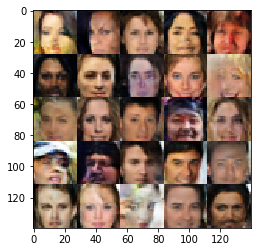

Epoch 3/10... Batch 1620... Discriminator Loss: 1.4797... Generator Loss: 0.5276
Epoch 3/10... Batch 1640... Discriminator Loss: 1.2799... Generator Loss: 0.9918
Epoch 3/10... Batch 1660... Discriminator Loss: 1.2406... Generator Loss: 0.7828
Epoch 3/10... Batch 1680... Discriminator Loss: 1.3015... Generator Loss: 0.7481
Epoch 3/10... Batch 1700... Discriminator Loss: 1.3383... Generator Loss: 1.4649
Epoch 3/10... Batch 1720... Discriminator Loss: 1.2097... Generator Loss: 0.8125
Epoch 3/10... Batch 1740... Discriminator Loss: 1.2943... Generator Loss: 0.8544
Epoch 3/10... Batch 1760... Discriminator Loss: 1.5674... Generator Loss: 0.4111
Epoch 3/10... Batch 1780... Discriminator Loss: 1.2322... Generator Loss: 0.8014
Epoch 3/10... Batch 1800... Discriminator Loss: 1.6070... Generator Loss: 0.4357


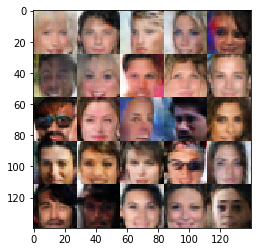

Epoch 3/10... Batch 1820... Discriminator Loss: 1.5693... Generator Loss: 0.5212
Epoch 3/10... Batch 1840... Discriminator Loss: 1.4049... Generator Loss: 0.5641
Epoch 3/10... Batch 1860... Discriminator Loss: 0.9794... Generator Loss: 1.1892
Epoch 3/10... Batch 1880... Discriminator Loss: 1.3889... Generator Loss: 0.6496
Epoch 3/10... Batch 1900... Discriminator Loss: 1.2400... Generator Loss: 0.8214
Epoch 3/10... Batch 1920... Discriminator Loss: 1.4474... Generator Loss: 0.5757
Epoch 3/10... Batch 1940... Discriminator Loss: 1.1430... Generator Loss: 1.2006
Epoch 3/10... Batch 1960... Discriminator Loss: 1.3682... Generator Loss: 0.7863
Epoch 3/10... Batch 1980... Discriminator Loss: 1.2660... Generator Loss: 0.9275
Epoch 3/10... Batch 2000... Discriminator Loss: 1.3571... Generator Loss: 1.1202


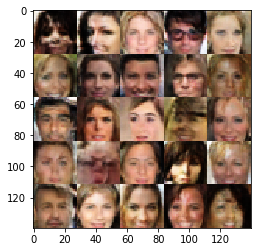

Epoch 3/10... Batch 2020... Discriminator Loss: 1.1968... Generator Loss: 0.8500
Epoch 3/10... Batch 2040... Discriminator Loss: 1.3645... Generator Loss: 0.7267
Epoch 3/10... Batch 2060... Discriminator Loss: 1.3623... Generator Loss: 0.8650
Epoch 3/10... Batch 2080... Discriminator Loss: 1.6910... Generator Loss: 0.4837
Epoch 3/10... Batch 2100... Discriminator Loss: 1.1313... Generator Loss: 1.1402
Epoch 3/10... Batch 2120... Discriminator Loss: 1.3310... Generator Loss: 0.6626
Epoch 3/10... Batch 2140... Discriminator Loss: 1.5386... Generator Loss: 0.7976
Epoch 3/10... Batch 2160... Discriminator Loss: 1.2023... Generator Loss: 0.8825
Epoch 3/10... Batch 2180... Discriminator Loss: 1.3932... Generator Loss: 0.6663
Epoch 3/10... Batch 2200... Discriminator Loss: 1.3487... Generator Loss: 0.6354


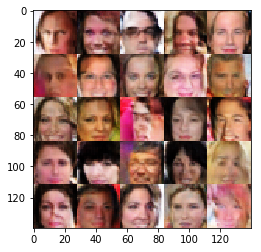

Epoch 3/10... Batch 2220... Discriminator Loss: 1.0961... Generator Loss: 0.9508
Epoch 3/10... Batch 2240... Discriminator Loss: 0.9181... Generator Loss: 1.5943
Epoch 3/10... Batch 2260... Discriminator Loss: 1.2018... Generator Loss: 1.0933
Epoch 3/10... Batch 2280... Discriminator Loss: 1.2843... Generator Loss: 1.1500
Epoch 3/10... Batch 2300... Discriminator Loss: 1.1177... Generator Loss: 0.8783
Epoch 3/10... Batch 2320... Discriminator Loss: 1.2456... Generator Loss: 0.7463
Epoch 3/10... Batch 2340... Discriminator Loss: 1.2094... Generator Loss: 1.0801
Epoch 3/10... Batch 2360... Discriminator Loss: 1.2536... Generator Loss: 0.8859
Epoch 3/10... Batch 2380... Discriminator Loss: 1.1177... Generator Loss: 0.8617
Epoch 3/10... Batch 2400... Discriminator Loss: 1.2340... Generator Loss: 1.2376


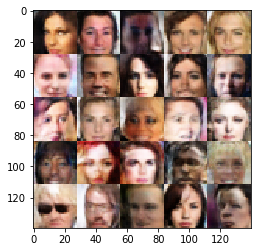

Epoch 3/10... Batch 2420... Discriminator Loss: 1.3350... Generator Loss: 0.8802
Epoch 3/10... Batch 2440... Discriminator Loss: 1.1726... Generator Loss: 0.9175
Epoch 3/10... Batch 2460... Discriminator Loss: 1.3326... Generator Loss: 0.7405
Epoch 3/10... Batch 2480... Discriminator Loss: 1.3223... Generator Loss: 0.6732
Epoch 3/10... Batch 2500... Discriminator Loss: 1.0459... Generator Loss: 1.0195
Epoch 3/10... Batch 2520... Discriminator Loss: 1.2088... Generator Loss: 1.2468
Epoch 3/10... Batch 2540... Discriminator Loss: 1.0244... Generator Loss: 1.0683
Epoch 3/10... Batch 2560... Discriminator Loss: 1.3819... Generator Loss: 0.9845
Epoch 3/10... Batch 2580... Discriminator Loss: 1.2242... Generator Loss: 0.9064
Epoch 3/10... Batch 2600... Discriminator Loss: 1.2161... Generator Loss: 0.9435


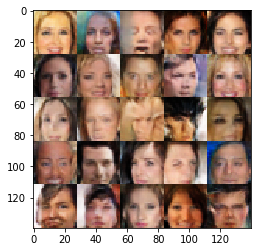

Epoch 3/10... Batch 2620... Discriminator Loss: 1.4631... Generator Loss: 0.8160
Epoch 3/10... Batch 2640... Discriminator Loss: 1.3592... Generator Loss: 0.7989
Epoch 3/10... Batch 2660... Discriminator Loss: 1.1684... Generator Loss: 0.9312
Epoch 3/10... Batch 2680... Discriminator Loss: 1.0799... Generator Loss: 0.8161
Epoch 3/10... Batch 2700... Discriminator Loss: 1.1155... Generator Loss: 0.9521
Epoch 3/10... Batch 2720... Discriminator Loss: 1.1632... Generator Loss: 0.8735
Epoch 3/10... Batch 2740... Discriminator Loss: 1.5740... Generator Loss: 0.6678
Epoch 3/10... Batch 2760... Discriminator Loss: 1.3485... Generator Loss: 0.7550
Epoch 3/10... Batch 2780... Discriminator Loss: 1.5602... Generator Loss: 0.5051
Epoch 3/10... Batch 2800... Discriminator Loss: 1.1246... Generator Loss: 0.8626


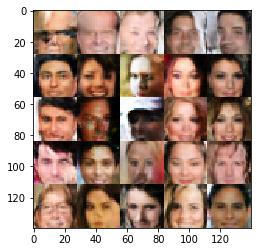

Epoch 3/10... Batch 2820... Discriminator Loss: 1.6783... Generator Loss: 0.4336
Epoch 3/10... Batch 2840... Discriminator Loss: 1.1725... Generator Loss: 1.2789
Epoch 3/10... Batch 2860... Discriminator Loss: 1.9730... Generator Loss: 0.3919
Epoch 3/10... Batch 2880... Discriminator Loss: 1.7332... Generator Loss: 0.3971
Epoch 3/10... Batch 2900... Discriminator Loss: 1.4524... Generator Loss: 0.7284
Epoch 3/10... Batch 2920... Discriminator Loss: 1.0845... Generator Loss: 0.9506
Epoch 3/10... Batch 2940... Discriminator Loss: 1.0793... Generator Loss: 0.8775
Epoch 3/10... Batch 2960... Discriminator Loss: 1.2888... Generator Loss: 0.6805
Epoch 3/10... Batch 2980... Discriminator Loss: 1.2471... Generator Loss: 0.7590
Epoch 3/10... Batch 3000... Discriminator Loss: 1.1378... Generator Loss: 1.0622


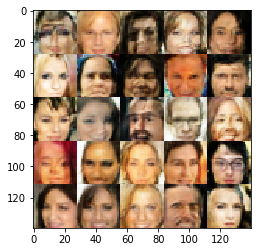

Epoch 3/10... Batch 3020... Discriminator Loss: 1.2333... Generator Loss: 0.8697
Epoch 3/10... Batch 3040... Discriminator Loss: 1.3246... Generator Loss: 0.8447
Epoch 3/10... Batch 3060... Discriminator Loss: 1.4906... Generator Loss: 0.5344
Epoch 3/10... Batch 3080... Discriminator Loss: 1.2616... Generator Loss: 0.9292
Epoch 3/10... Batch 3100... Discriminator Loss: 1.5217... Generator Loss: 0.4872
Epoch 3/10... Batch 3120... Discriminator Loss: 1.2950... Generator Loss: 0.7845
Epoch 3/10... Batch 3140... Discriminator Loss: 1.4506... Generator Loss: 0.7171
Epoch 3/10... Batch 3160... Discriminator Loss: 1.4807... Generator Loss: 0.6472
Epoch 4/10... Batch 20... Discriminator Loss: 0.9723... Generator Loss: 1.0125
Epoch 4/10... Batch 40... Discriminator Loss: 1.3553... Generator Loss: 0.8428
Epoch 4/10... Batch 60... Discriminator Loss: 1.2525... Generator Loss: 0.8358
Epoch 4/10... Batch 80... Discriminator Loss: 1.2746... Generator Loss: 0.7524
Epoch 4/10... Batch 100... Discrimin

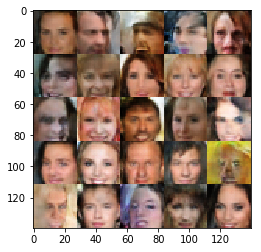

Epoch 4/10... Batch 220... Discriminator Loss: 1.2089... Generator Loss: 0.9423
Epoch 4/10... Batch 240... Discriminator Loss: 1.0847... Generator Loss: 0.9543
Epoch 4/10... Batch 260... Discriminator Loss: 1.1092... Generator Loss: 0.8788
Epoch 4/10... Batch 280... Discriminator Loss: 1.2351... Generator Loss: 0.7740
Epoch 4/10... Batch 300... Discriminator Loss: 1.4475... Generator Loss: 1.1965
Epoch 4/10... Batch 320... Discriminator Loss: 1.2919... Generator Loss: 0.9036
Epoch 4/10... Batch 340... Discriminator Loss: 1.1870... Generator Loss: 0.7635
Epoch 4/10... Batch 360... Discriminator Loss: 1.2365... Generator Loss: 0.7534
Epoch 4/10... Batch 380... Discriminator Loss: 0.8346... Generator Loss: 1.5131
Epoch 4/10... Batch 400... Discriminator Loss: 1.1130... Generator Loss: 1.1980


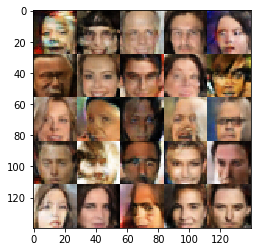

Epoch 4/10... Batch 420... Discriminator Loss: 1.5129... Generator Loss: 0.5072
Epoch 4/10... Batch 440... Discriminator Loss: 1.0113... Generator Loss: 1.1474
Epoch 4/10... Batch 460... Discriminator Loss: 1.2291... Generator Loss: 0.9740
Epoch 4/10... Batch 480... Discriminator Loss: 1.2793... Generator Loss: 0.9830
Epoch 4/10... Batch 500... Discriminator Loss: 1.1881... Generator Loss: 1.1562
Epoch 4/10... Batch 520... Discriminator Loss: 1.5043... Generator Loss: 0.6845
Epoch 4/10... Batch 540... Discriminator Loss: 1.3739... Generator Loss: 0.7379
Epoch 4/10... Batch 560... Discriminator Loss: 1.4056... Generator Loss: 0.7441
Epoch 4/10... Batch 580... Discriminator Loss: 1.2137... Generator Loss: 0.8816
Epoch 4/10... Batch 600... Discriminator Loss: 1.0614... Generator Loss: 1.0556


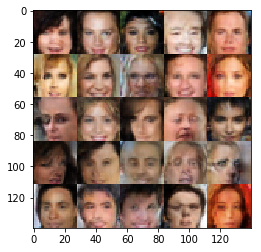

Epoch 4/10... Batch 620... Discriminator Loss: 0.8342... Generator Loss: 1.2895
Epoch 4/10... Batch 640... Discriminator Loss: 1.3614... Generator Loss: 0.7380
Epoch 4/10... Batch 660... Discriminator Loss: 1.4759... Generator Loss: 0.7245
Epoch 4/10... Batch 680... Discriminator Loss: 1.2447... Generator Loss: 0.9408
Epoch 4/10... Batch 700... Discriminator Loss: 1.1754... Generator Loss: 0.8857
Epoch 4/10... Batch 720... Discriminator Loss: 1.1748... Generator Loss: 1.0614
Epoch 4/10... Batch 740... Discriminator Loss: 1.4581... Generator Loss: 0.8555
Epoch 4/10... Batch 760... Discriminator Loss: 1.2947... Generator Loss: 0.8238
Epoch 4/10... Batch 780... Discriminator Loss: 1.0186... Generator Loss: 0.9962
Epoch 4/10... Batch 800... Discriminator Loss: 1.0852... Generator Loss: 1.1581


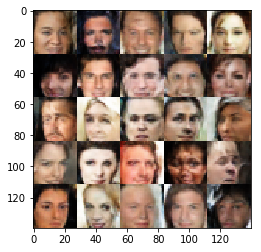

Epoch 4/10... Batch 820... Discriminator Loss: 1.6425... Generator Loss: 0.6193
Epoch 4/10... Batch 840... Discriminator Loss: 1.3042... Generator Loss: 0.7189
Epoch 4/10... Batch 860... Discriminator Loss: 1.2511... Generator Loss: 0.9370
Epoch 4/10... Batch 880... Discriminator Loss: 1.3492... Generator Loss: 0.9311
Epoch 4/10... Batch 900... Discriminator Loss: 1.0013... Generator Loss: 1.3120
Epoch 4/10... Batch 920... Discriminator Loss: 1.2596... Generator Loss: 0.8155
Epoch 4/10... Batch 940... Discriminator Loss: 0.9815... Generator Loss: 1.5763
Epoch 4/10... Batch 960... Discriminator Loss: 1.1956... Generator Loss: 1.0099
Epoch 4/10... Batch 980... Discriminator Loss: 1.8842... Generator Loss: 0.3792
Epoch 4/10... Batch 1000... Discriminator Loss: 1.6427... Generator Loss: 0.4909


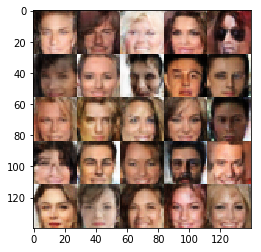

Epoch 4/10... Batch 1020... Discriminator Loss: 1.2593... Generator Loss: 0.7622
Epoch 4/10... Batch 1040... Discriminator Loss: 1.0608... Generator Loss: 0.9210
Epoch 4/10... Batch 1060... Discriminator Loss: 1.4224... Generator Loss: 0.4799
Epoch 4/10... Batch 1080... Discriminator Loss: 0.9816... Generator Loss: 1.2053
Epoch 4/10... Batch 1100... Discriminator Loss: 1.1277... Generator Loss: 0.7803
Epoch 4/10... Batch 1120... Discriminator Loss: 1.6621... Generator Loss: 0.4799
Epoch 4/10... Batch 1140... Discriminator Loss: 1.4587... Generator Loss: 0.6034
Epoch 4/10... Batch 1160... Discriminator Loss: 1.1201... Generator Loss: 1.0108
Epoch 4/10... Batch 1180... Discriminator Loss: 1.3748... Generator Loss: 0.6454
Epoch 4/10... Batch 1200... Discriminator Loss: 1.1743... Generator Loss: 1.1288


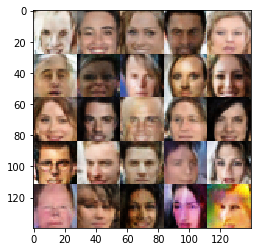

Epoch 4/10... Batch 1220... Discriminator Loss: 1.2947... Generator Loss: 0.8084
Epoch 4/10... Batch 1240... Discriminator Loss: 1.0547... Generator Loss: 0.9281
Epoch 4/10... Batch 1260... Discriminator Loss: 1.0289... Generator Loss: 1.3004
Epoch 4/10... Batch 1280... Discriminator Loss: 1.0623... Generator Loss: 1.1535
Epoch 4/10... Batch 1300... Discriminator Loss: 1.2915... Generator Loss: 0.7189
Epoch 4/10... Batch 1320... Discriminator Loss: 1.7577... Generator Loss: 0.6765
Epoch 4/10... Batch 1340... Discriminator Loss: 1.1753... Generator Loss: 1.4492
Epoch 4/10... Batch 1360... Discriminator Loss: 1.3164... Generator Loss: 0.7009
Epoch 4/10... Batch 1380... Discriminator Loss: 1.3079... Generator Loss: 0.9884
Epoch 4/10... Batch 1400... Discriminator Loss: 1.5046... Generator Loss: 0.6202


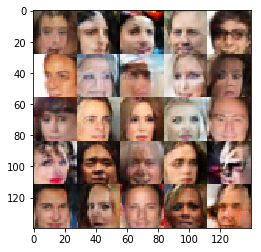

Epoch 4/10... Batch 1420... Discriminator Loss: 1.3012... Generator Loss: 0.9381
Epoch 4/10... Batch 1440... Discriminator Loss: 1.4404... Generator Loss: 0.6867
Epoch 4/10... Batch 1460... Discriminator Loss: 1.3935... Generator Loss: 0.7255
Epoch 4/10... Batch 1480... Discriminator Loss: 1.0974... Generator Loss: 1.0168
Epoch 4/10... Batch 1500... Discriminator Loss: 1.3646... Generator Loss: 0.5216
Epoch 4/10... Batch 1520... Discriminator Loss: 1.1161... Generator Loss: 0.9672
Epoch 4/10... Batch 1540... Discriminator Loss: 0.9100... Generator Loss: 1.1463
Epoch 4/10... Batch 1560... Discriminator Loss: 1.1444... Generator Loss: 1.1103
Epoch 4/10... Batch 1580... Discriminator Loss: 1.2213... Generator Loss: 0.8696
Epoch 4/10... Batch 1600... Discriminator Loss: 1.2980... Generator Loss: 0.7556


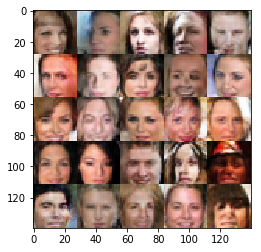

Epoch 4/10... Batch 1620... Discriminator Loss: 1.5580... Generator Loss: 0.5309
Epoch 4/10... Batch 1640... Discriminator Loss: 0.9580... Generator Loss: 1.2612
Epoch 4/10... Batch 1660... Discriminator Loss: 1.2131... Generator Loss: 0.7445
Epoch 4/10... Batch 1680... Discriminator Loss: 1.0218... Generator Loss: 1.2305
Epoch 4/10... Batch 1700... Discriminator Loss: 1.2192... Generator Loss: 0.9689
Epoch 4/10... Batch 1720... Discriminator Loss: 1.0297... Generator Loss: 0.9996
Epoch 4/10... Batch 1740... Discriminator Loss: 1.1442... Generator Loss: 0.9348
Epoch 4/10... Batch 1760... Discriminator Loss: 1.2512... Generator Loss: 0.7552
Epoch 4/10... Batch 1780... Discriminator Loss: 1.2550... Generator Loss: 1.0419
Epoch 4/10... Batch 1800... Discriminator Loss: 1.3544... Generator Loss: 0.4985


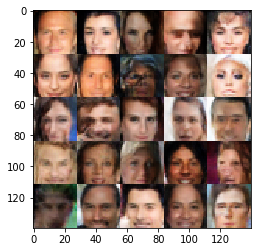

Epoch 4/10... Batch 1820... Discriminator Loss: 1.3926... Generator Loss: 0.6492
Epoch 4/10... Batch 1840... Discriminator Loss: 1.0770... Generator Loss: 0.7130
Epoch 4/10... Batch 1860... Discriminator Loss: 1.0653... Generator Loss: 1.1434
Epoch 4/10... Batch 1880... Discriminator Loss: 1.5886... Generator Loss: 0.5613
Epoch 4/10... Batch 1900... Discriminator Loss: 1.2134... Generator Loss: 0.9510
Epoch 4/10... Batch 1920... Discriminator Loss: 1.4701... Generator Loss: 1.2988
Epoch 4/10... Batch 1940... Discriminator Loss: 1.2817... Generator Loss: 0.7218
Epoch 4/10... Batch 1960... Discriminator Loss: 1.3158... Generator Loss: 0.7774
Epoch 4/10... Batch 1980... Discriminator Loss: 1.6677... Generator Loss: 0.6548
Epoch 4/10... Batch 2000... Discriminator Loss: 1.0292... Generator Loss: 0.8899


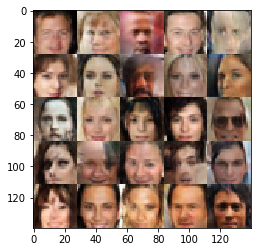

Epoch 4/10... Batch 2020... Discriminator Loss: 1.1082... Generator Loss: 1.0448
Epoch 4/10... Batch 2040... Discriminator Loss: 1.6017... Generator Loss: 0.8505
Epoch 4/10... Batch 2060... Discriminator Loss: 1.2194... Generator Loss: 1.0005
Epoch 4/10... Batch 2080... Discriminator Loss: 1.2443... Generator Loss: 0.7374
Epoch 4/10... Batch 2100... Discriminator Loss: 1.1176... Generator Loss: 1.0038
Epoch 4/10... Batch 2120... Discriminator Loss: 1.0626... Generator Loss: 1.2105
Epoch 4/10... Batch 2140... Discriminator Loss: 1.2629... Generator Loss: 0.8105
Epoch 4/10... Batch 2160... Discriminator Loss: 1.2335... Generator Loss: 0.7094
Epoch 4/10... Batch 2180... Discriminator Loss: 1.4111... Generator Loss: 0.7286
Epoch 4/10... Batch 2200... Discriminator Loss: 1.2332... Generator Loss: 0.9190


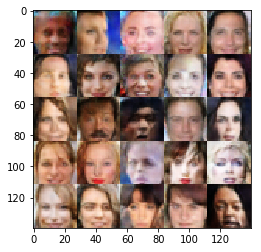

Epoch 4/10... Batch 2220... Discriminator Loss: 1.4222... Generator Loss: 0.5464
Epoch 4/10... Batch 2240... Discriminator Loss: 0.9846... Generator Loss: 1.0246
Epoch 4/10... Batch 2260... Discriminator Loss: 1.2136... Generator Loss: 1.1551
Epoch 4/10... Batch 2280... Discriminator Loss: 1.1072... Generator Loss: 0.8329
Epoch 4/10... Batch 2300... Discriminator Loss: 1.5654... Generator Loss: 0.4912
Epoch 4/10... Batch 2320... Discriminator Loss: 1.2592... Generator Loss: 1.1571
Epoch 4/10... Batch 2340... Discriminator Loss: 1.5345... Generator Loss: 0.7130
Epoch 4/10... Batch 2360... Discriminator Loss: 1.2215... Generator Loss: 1.0467
Epoch 4/10... Batch 2380... Discriminator Loss: 1.1989... Generator Loss: 0.9672
Epoch 4/10... Batch 2400... Discriminator Loss: 1.1668... Generator Loss: 0.9766


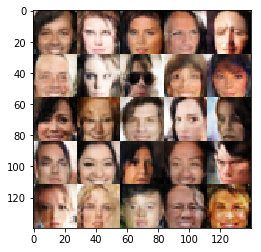

Epoch 4/10... Batch 2420... Discriminator Loss: 1.2452... Generator Loss: 0.7411
Epoch 4/10... Batch 2440... Discriminator Loss: 1.0738... Generator Loss: 0.9299
Epoch 4/10... Batch 2460... Discriminator Loss: 1.5633... Generator Loss: 0.6383
Epoch 4/10... Batch 2480... Discriminator Loss: 1.1213... Generator Loss: 1.0671
Epoch 4/10... Batch 2500... Discriminator Loss: 1.4957... Generator Loss: 0.6734
Epoch 4/10... Batch 2520... Discriminator Loss: 1.1447... Generator Loss: 1.1869
Epoch 4/10... Batch 2540... Discriminator Loss: 1.1103... Generator Loss: 0.9911
Epoch 4/10... Batch 2560... Discriminator Loss: 1.2816... Generator Loss: 0.6541
Epoch 4/10... Batch 2580... Discriminator Loss: 1.2258... Generator Loss: 0.8627
Epoch 4/10... Batch 2600... Discriminator Loss: 1.0752... Generator Loss: 1.0189


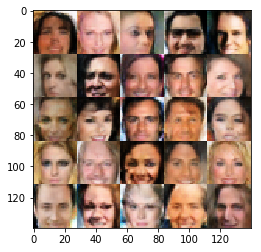

Epoch 4/10... Batch 2620... Discriminator Loss: 1.0890... Generator Loss: 0.9510
Epoch 4/10... Batch 2640... Discriminator Loss: 1.0045... Generator Loss: 1.2729
Epoch 4/10... Batch 2660... Discriminator Loss: 1.0498... Generator Loss: 1.3645
Epoch 4/10... Batch 2680... Discriminator Loss: 1.1495... Generator Loss: 0.9215
Epoch 4/10... Batch 2700... Discriminator Loss: 1.0792... Generator Loss: 0.9521
Epoch 4/10... Batch 2720... Discriminator Loss: 1.7784... Generator Loss: 0.4070
Epoch 4/10... Batch 2740... Discriminator Loss: 1.5146... Generator Loss: 0.4954
Epoch 4/10... Batch 2760... Discriminator Loss: 1.5451... Generator Loss: 0.7468
Epoch 4/10... Batch 2780... Discriminator Loss: 1.2494... Generator Loss: 0.7041
Epoch 4/10... Batch 2800... Discriminator Loss: 1.4533... Generator Loss: 0.5688


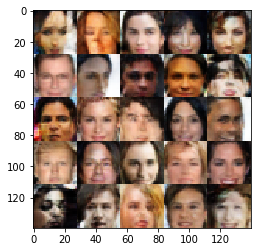

Epoch 4/10... Batch 2820... Discriminator Loss: 1.5751... Generator Loss: 0.6809
Epoch 4/10... Batch 2840... Discriminator Loss: 1.5131... Generator Loss: 0.7699
Epoch 4/10... Batch 2860... Discriminator Loss: 1.2848... Generator Loss: 1.0780
Epoch 4/10... Batch 2880... Discriminator Loss: 1.2437... Generator Loss: 0.9725
Epoch 4/10... Batch 2900... Discriminator Loss: 1.9341... Generator Loss: 0.5178
Epoch 4/10... Batch 2920... Discriminator Loss: 1.0390... Generator Loss: 0.7922
Epoch 4/10... Batch 2940... Discriminator Loss: 0.9737... Generator Loss: 1.2231
Epoch 4/10... Batch 2960... Discriminator Loss: 1.2023... Generator Loss: 0.8487
Epoch 4/10... Batch 2980... Discriminator Loss: 1.5631... Generator Loss: 0.5426
Epoch 4/10... Batch 3000... Discriminator Loss: 1.4906... Generator Loss: 0.9308


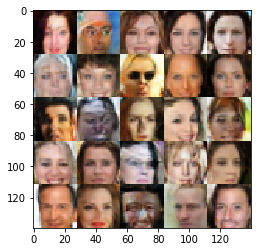

Epoch 4/10... Batch 3020... Discriminator Loss: 1.3019... Generator Loss: 0.7037
Epoch 4/10... Batch 3040... Discriminator Loss: 1.5436... Generator Loss: 0.6345
Epoch 4/10... Batch 3060... Discriminator Loss: 1.1488... Generator Loss: 0.8920
Epoch 4/10... Batch 3080... Discriminator Loss: 0.9801... Generator Loss: 1.2672
Epoch 4/10... Batch 3100... Discriminator Loss: 1.2897... Generator Loss: 0.8154
Epoch 4/10... Batch 3120... Discriminator Loss: 0.7888... Generator Loss: 1.2548
Epoch 4/10... Batch 3140... Discriminator Loss: 1.1644... Generator Loss: 1.0838
Epoch 4/10... Batch 3160... Discriminator Loss: 1.2122... Generator Loss: 0.9338
Epoch 5/10... Batch 20... Discriminator Loss: 1.1145... Generator Loss: 1.2839
Epoch 5/10... Batch 40... Discriminator Loss: 1.1338... Generator Loss: 1.2776
Epoch 5/10... Batch 60... Discriminator Loss: 1.3104... Generator Loss: 0.8083
Epoch 5/10... Batch 80... Discriminator Loss: 0.9969... Generator Loss: 1.1823
Epoch 5/10... Batch 100... Discrimin

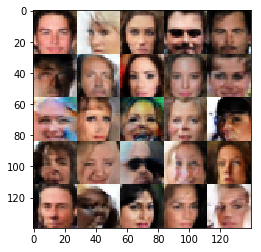

Epoch 5/10... Batch 220... Discriminator Loss: 1.4226... Generator Loss: 0.9011
Epoch 5/10... Batch 240... Discriminator Loss: 0.8335... Generator Loss: 1.4873
Epoch 5/10... Batch 260... Discriminator Loss: 1.3750... Generator Loss: 0.8498
Epoch 5/10... Batch 280... Discriminator Loss: 1.0735... Generator Loss: 0.9725
Epoch 5/10... Batch 300... Discriminator Loss: 1.2102... Generator Loss: 1.5446
Epoch 5/10... Batch 320... Discriminator Loss: 1.2461... Generator Loss: 1.0130
Epoch 5/10... Batch 340... Discriminator Loss: 1.3381... Generator Loss: 0.8044
Epoch 5/10... Batch 360... Discriminator Loss: 1.5222... Generator Loss: 0.5358
Epoch 5/10... Batch 380... Discriminator Loss: 0.8604... Generator Loss: 1.3371
Epoch 5/10... Batch 400... Discriminator Loss: 0.9691... Generator Loss: 1.2531


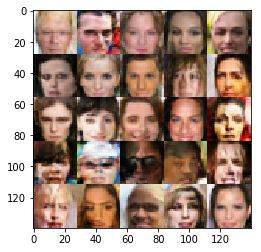

Epoch 5/10... Batch 420... Discriminator Loss: 1.1494... Generator Loss: 0.7787
Epoch 5/10... Batch 440... Discriminator Loss: 1.0787... Generator Loss: 0.9060
Epoch 5/10... Batch 460... Discriminator Loss: 1.1965... Generator Loss: 0.8306
Epoch 5/10... Batch 480... Discriminator Loss: 1.5461... Generator Loss: 0.4523
Epoch 5/10... Batch 500... Discriminator Loss: 1.6940... Generator Loss: 0.5824
Epoch 5/10... Batch 520... Discriminator Loss: 1.3814... Generator Loss: 0.5581
Epoch 5/10... Batch 540... Discriminator Loss: 1.1046... Generator Loss: 0.7365
Epoch 5/10... Batch 560... Discriminator Loss: 1.3871... Generator Loss: 0.6508
Epoch 5/10... Batch 580... Discriminator Loss: 1.6162... Generator Loss: 0.5478
Epoch 5/10... Batch 600... Discriminator Loss: 0.9886... Generator Loss: 1.0366


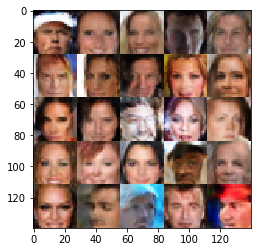

Epoch 5/10... Batch 620... Discriminator Loss: 0.8442... Generator Loss: 1.3676
Epoch 5/10... Batch 640... Discriminator Loss: 1.1985... Generator Loss: 0.7823
Epoch 5/10... Batch 660... Discriminator Loss: 1.3846... Generator Loss: 1.0408
Epoch 5/10... Batch 680... Discriminator Loss: 1.3080... Generator Loss: 0.8723
Epoch 5/10... Batch 700... Discriminator Loss: 1.1045... Generator Loss: 0.6957
Epoch 5/10... Batch 720... Discriminator Loss: 1.0194... Generator Loss: 0.8707
Epoch 5/10... Batch 740... Discriminator Loss: 1.2871... Generator Loss: 0.9014
Epoch 5/10... Batch 760... Discriminator Loss: 1.2774... Generator Loss: 1.0473
Epoch 5/10... Batch 780... Discriminator Loss: 1.1947... Generator Loss: 0.8857
Epoch 5/10... Batch 800... Discriminator Loss: 0.8380... Generator Loss: 1.2723


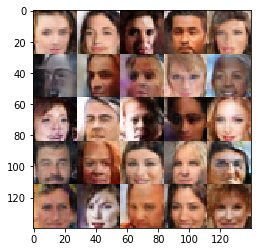

Epoch 5/10... Batch 820... Discriminator Loss: 1.2060... Generator Loss: 0.8428
Epoch 5/10... Batch 840... Discriminator Loss: 1.4420... Generator Loss: 1.0405
Epoch 5/10... Batch 860... Discriminator Loss: 1.3138... Generator Loss: 0.6895
Epoch 5/10... Batch 880... Discriminator Loss: 1.0839... Generator Loss: 0.8299
Epoch 5/10... Batch 900... Discriminator Loss: 1.1227... Generator Loss: 1.0108
Epoch 5/10... Batch 920... Discriminator Loss: 1.3871... Generator Loss: 0.7934
Epoch 5/10... Batch 940... Discriminator Loss: 0.8834... Generator Loss: 1.7241
Epoch 5/10... Batch 960... Discriminator Loss: 1.2393... Generator Loss: 0.7408
Epoch 5/10... Batch 980... Discriminator Loss: 0.9844... Generator Loss: 0.9039
Epoch 5/10... Batch 1000... Discriminator Loss: 1.2886... Generator Loss: 0.8631


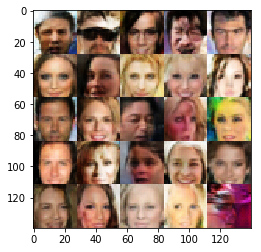

Epoch 5/10... Batch 1020... Discriminator Loss: 1.2369... Generator Loss: 1.0598
Epoch 5/10... Batch 1040... Discriminator Loss: 1.1951... Generator Loss: 1.1386
Epoch 5/10... Batch 1060... Discriminator Loss: 1.6365... Generator Loss: 0.8078
Epoch 5/10... Batch 1080... Discriminator Loss: 1.2561... Generator Loss: 0.6256
Epoch 5/10... Batch 1100... Discriminator Loss: 1.0900... Generator Loss: 0.6649
Epoch 5/10... Batch 1120... Discriminator Loss: 1.3628... Generator Loss: 0.6989
Epoch 5/10... Batch 1140... Discriminator Loss: 1.2802... Generator Loss: 0.9143
Epoch 5/10... Batch 1160... Discriminator Loss: 0.9804... Generator Loss: 1.1686
Epoch 5/10... Batch 1180... Discriminator Loss: 1.4702... Generator Loss: 0.6390
Epoch 5/10... Batch 1200... Discriminator Loss: 0.9813... Generator Loss: 1.2249


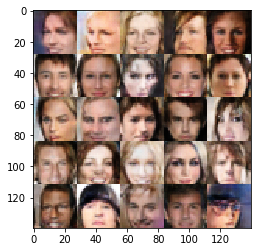

Epoch 5/10... Batch 1220... Discriminator Loss: 1.1794... Generator Loss: 0.7729
Epoch 5/10... Batch 1240... Discriminator Loss: 1.3606... Generator Loss: 0.9034
Epoch 5/10... Batch 1260... Discriminator Loss: 0.8751... Generator Loss: 1.5603
Epoch 5/10... Batch 1280... Discriminator Loss: 1.3630... Generator Loss: 0.8935
Epoch 5/10... Batch 1300... Discriminator Loss: 1.3014... Generator Loss: 1.1484
Epoch 5/10... Batch 1320... Discriminator Loss: 1.2240... Generator Loss: 0.8794
Epoch 5/10... Batch 1340... Discriminator Loss: 0.9455... Generator Loss: 1.2911
Epoch 5/10... Batch 1360... Discriminator Loss: 1.2732... Generator Loss: 0.8102
Epoch 5/10... Batch 1380... Discriminator Loss: 1.1699... Generator Loss: 0.9954
Epoch 5/10... Batch 1400... Discriminator Loss: 1.7802... Generator Loss: 0.6012


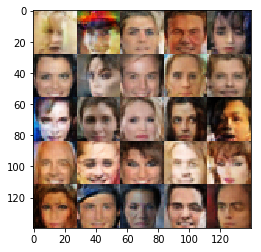

Epoch 5/10... Batch 1420... Discriminator Loss: 1.1894... Generator Loss: 0.9335
Epoch 5/10... Batch 1440... Discriminator Loss: 1.5250... Generator Loss: 0.4445
Epoch 5/10... Batch 1460... Discriminator Loss: 1.3015... Generator Loss: 0.7261
Epoch 5/10... Batch 1480... Discriminator Loss: 1.1897... Generator Loss: 0.8491
Epoch 5/10... Batch 1500... Discriminator Loss: 0.9728... Generator Loss: 1.1390
Epoch 5/10... Batch 1520... Discriminator Loss: 1.0024... Generator Loss: 1.3361
Epoch 5/10... Batch 1540... Discriminator Loss: 0.9792... Generator Loss: 1.3502
Epoch 5/10... Batch 1560... Discriminator Loss: 1.0659... Generator Loss: 1.2655
Epoch 5/10... Batch 1580... Discriminator Loss: 1.3617... Generator Loss: 0.7561
Epoch 5/10... Batch 1600... Discriminator Loss: 1.2966... Generator Loss: 0.9832


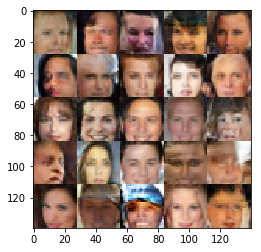

Epoch 5/10... Batch 1620... Discriminator Loss: 1.2246... Generator Loss: 0.9289
Epoch 5/10... Batch 1640... Discriminator Loss: 1.3295... Generator Loss: 1.0276
Epoch 5/10... Batch 1660... Discriminator Loss: 0.9695... Generator Loss: 1.3690
Epoch 5/10... Batch 1680... Discriminator Loss: 1.1284... Generator Loss: 1.1997
Epoch 5/10... Batch 1700... Discriminator Loss: 1.0605... Generator Loss: 1.4555
Epoch 5/10... Batch 1720... Discriminator Loss: 1.1392... Generator Loss: 0.9308
Epoch 5/10... Batch 1740... Discriminator Loss: 1.1272... Generator Loss: 1.0596
Epoch 5/10... Batch 1760... Discriminator Loss: 1.4912... Generator Loss: 0.5967
Epoch 5/10... Batch 1780... Discriminator Loss: 1.0283... Generator Loss: 1.0685
Epoch 5/10... Batch 1800... Discriminator Loss: 1.5331... Generator Loss: 0.5734


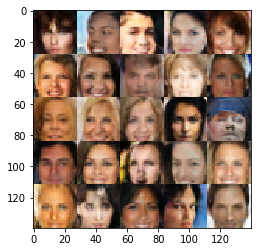

Epoch 5/10... Batch 1820... Discriminator Loss: 1.5049... Generator Loss: 0.7751
Epoch 5/10... Batch 1840... Discriminator Loss: 1.3107... Generator Loss: 0.7664
Epoch 5/10... Batch 1860... Discriminator Loss: 0.8033... Generator Loss: 1.1532
Epoch 5/10... Batch 1880... Discriminator Loss: 1.0880... Generator Loss: 0.7342
Epoch 5/10... Batch 1900... Discriminator Loss: 1.5002... Generator Loss: 0.6693
Epoch 5/10... Batch 1920... Discriminator Loss: 1.1235... Generator Loss: 1.0557
Epoch 5/10... Batch 1940... Discriminator Loss: 1.3537... Generator Loss: 0.6369
Epoch 5/10... Batch 1960... Discriminator Loss: 1.2868... Generator Loss: 0.9117
Epoch 5/10... Batch 1980... Discriminator Loss: 1.0859... Generator Loss: 1.0171
Epoch 5/10... Batch 2000... Discriminator Loss: 1.2025... Generator Loss: 0.7794


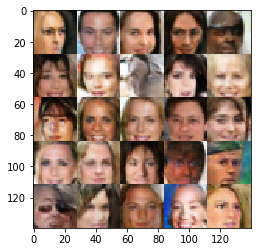

Epoch 5/10... Batch 2020... Discriminator Loss: 1.1073... Generator Loss: 0.9917
Epoch 5/10... Batch 2040... Discriminator Loss: 1.2763... Generator Loss: 0.9352
Epoch 5/10... Batch 2060... Discriminator Loss: 1.2989... Generator Loss: 0.9097
Epoch 5/10... Batch 2080... Discriminator Loss: 1.1781... Generator Loss: 1.0006
Epoch 5/10... Batch 2100... Discriminator Loss: 1.1235... Generator Loss: 0.8088
Epoch 5/10... Batch 2120... Discriminator Loss: 1.5991... Generator Loss: 0.6548
Epoch 5/10... Batch 2140... Discriminator Loss: 1.2961... Generator Loss: 0.9704
Epoch 5/10... Batch 2160... Discriminator Loss: 1.6980... Generator Loss: 0.4983
Epoch 5/10... Batch 2180... Discriminator Loss: 1.1351... Generator Loss: 1.1590
Epoch 5/10... Batch 2200... Discriminator Loss: 1.0194... Generator Loss: 0.9782


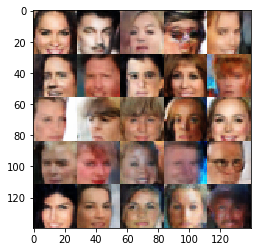

Epoch 5/10... Batch 2220... Discriminator Loss: 1.3506... Generator Loss: 0.6836
Epoch 5/10... Batch 2240... Discriminator Loss: 0.5339... Generator Loss: 2.0007
Epoch 5/10... Batch 2260... Discriminator Loss: 0.8679... Generator Loss: 1.1456
Epoch 5/10... Batch 2280... Discriminator Loss: 1.2746... Generator Loss: 0.6676
Epoch 5/10... Batch 2300... Discriminator Loss: 1.2769... Generator Loss: 0.6825
Epoch 5/10... Batch 2320... Discriminator Loss: 1.7293... Generator Loss: 0.4540
Epoch 5/10... Batch 2340... Discriminator Loss: 1.2648... Generator Loss: 0.6531
Epoch 5/10... Batch 2360... Discriminator Loss: 1.2632... Generator Loss: 1.1450
Epoch 5/10... Batch 2380... Discriminator Loss: 1.1122... Generator Loss: 0.8105
Epoch 5/10... Batch 2400... Discriminator Loss: 0.9322... Generator Loss: 1.4376


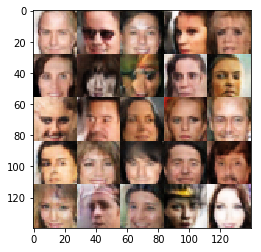

Epoch 5/10... Batch 2420... Discriminator Loss: 1.0843... Generator Loss: 1.0991
Epoch 5/10... Batch 2440... Discriminator Loss: 1.3815... Generator Loss: 0.6886
Epoch 5/10... Batch 2460... Discriminator Loss: 1.0306... Generator Loss: 0.8000
Epoch 5/10... Batch 2480... Discriminator Loss: 1.3101... Generator Loss: 0.7208
Epoch 5/10... Batch 2500... Discriminator Loss: 1.0222... Generator Loss: 1.0526
Epoch 5/10... Batch 2520... Discriminator Loss: 1.0777... Generator Loss: 1.0973
Epoch 5/10... Batch 2540... Discriminator Loss: 1.1085... Generator Loss: 1.0327
Epoch 5/10... Batch 2560... Discriminator Loss: 1.3122... Generator Loss: 0.9187
Epoch 5/10... Batch 2580... Discriminator Loss: 1.1414... Generator Loss: 1.4054
Epoch 5/10... Batch 2600... Discriminator Loss: 1.4492... Generator Loss: 0.7454


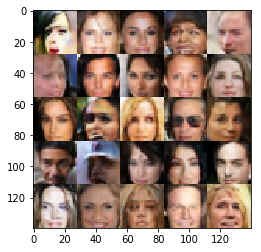

Epoch 5/10... Batch 2620... Discriminator Loss: 1.0843... Generator Loss: 1.3572
Epoch 5/10... Batch 2640... Discriminator Loss: 1.2222... Generator Loss: 1.2303
Epoch 5/10... Batch 2660... Discriminator Loss: 0.9095... Generator Loss: 1.2963
Epoch 5/10... Batch 2680... Discriminator Loss: 0.9869... Generator Loss: 1.2639
Epoch 5/10... Batch 2700... Discriminator Loss: 1.3260... Generator Loss: 0.6917
Epoch 5/10... Batch 2720... Discriminator Loss: 1.4470... Generator Loss: 0.4967
Epoch 5/10... Batch 2740... Discriminator Loss: 1.3256... Generator Loss: 0.8801
Epoch 5/10... Batch 2760... Discriminator Loss: 1.4563... Generator Loss: 0.6376
Epoch 5/10... Batch 2780... Discriminator Loss: 1.2381... Generator Loss: 0.7481
Epoch 5/10... Batch 2800... Discriminator Loss: 1.1929... Generator Loss: 0.9382


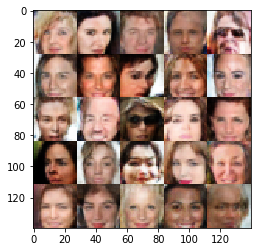

Epoch 5/10... Batch 2820... Discriminator Loss: 1.2075... Generator Loss: 0.5748
Epoch 5/10... Batch 2840... Discriminator Loss: 1.0836... Generator Loss: 1.2993
Epoch 5/10... Batch 2860... Discriminator Loss: 1.3152... Generator Loss: 0.8093
Epoch 5/10... Batch 2880... Discriminator Loss: 1.1693... Generator Loss: 0.7481
Epoch 5/10... Batch 2900... Discriminator Loss: 1.7057... Generator Loss: 0.5698
Epoch 5/10... Batch 2920... Discriminator Loss: 1.3652... Generator Loss: 0.8700
Epoch 5/10... Batch 2940... Discriminator Loss: 1.1425... Generator Loss: 1.0904
Epoch 5/10... Batch 2960... Discriminator Loss: 0.9945... Generator Loss: 0.7789
Epoch 5/10... Batch 2980... Discriminator Loss: 1.1063... Generator Loss: 0.7583
Epoch 5/10... Batch 3000... Discriminator Loss: 1.0385... Generator Loss: 1.0711


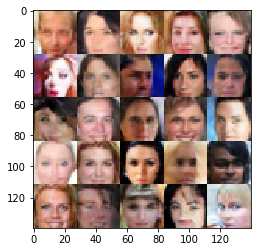

Epoch 5/10... Batch 3020... Discriminator Loss: 0.8276... Generator Loss: 1.3157
Epoch 5/10... Batch 3040... Discriminator Loss: 1.1741... Generator Loss: 0.8474
Epoch 5/10... Batch 3060... Discriminator Loss: 1.1323... Generator Loss: 0.8667
Epoch 5/10... Batch 3080... Discriminator Loss: 1.1526... Generator Loss: 0.9015
Epoch 5/10... Batch 3100... Discriminator Loss: 1.2216... Generator Loss: 0.7598
Epoch 5/10... Batch 3120... Discriminator Loss: 0.7779... Generator Loss: 1.6656
Epoch 5/10... Batch 3140... Discriminator Loss: 1.1525... Generator Loss: 0.6424
Epoch 5/10... Batch 3160... Discriminator Loss: 1.1402... Generator Loss: 1.1213
Epoch 6/10... Batch 20... Discriminator Loss: 0.8688... Generator Loss: 1.8179
Epoch 6/10... Batch 40... Discriminator Loss: 1.3601... Generator Loss: 0.6406
Epoch 6/10... Batch 60... Discriminator Loss: 0.9772... Generator Loss: 0.9315
Epoch 6/10... Batch 80... Discriminator Loss: 1.2473... Generator Loss: 0.7799
Epoch 6/10... Batch 100... Discrimin

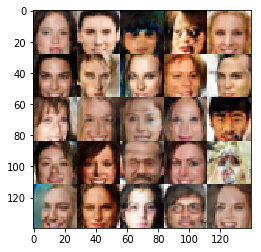

Epoch 6/10... Batch 220... Discriminator Loss: 1.4865... Generator Loss: 0.8850
Epoch 6/10... Batch 240... Discriminator Loss: 0.7854... Generator Loss: 1.6227
Epoch 6/10... Batch 260... Discriminator Loss: 0.9521... Generator Loss: 1.2409
Epoch 6/10... Batch 280... Discriminator Loss: 1.1153... Generator Loss: 0.8333
Epoch 6/10... Batch 300... Discriminator Loss: 1.1159... Generator Loss: 1.7213
Epoch 6/10... Batch 320... Discriminator Loss: 1.2693... Generator Loss: 1.1336
Epoch 6/10... Batch 340... Discriminator Loss: 1.2680... Generator Loss: 1.0729
Epoch 6/10... Batch 360... Discriminator Loss: 1.5279... Generator Loss: 0.7720
Epoch 6/10... Batch 380... Discriminator Loss: 0.9316... Generator Loss: 1.3952
Epoch 6/10... Batch 400... Discriminator Loss: 0.7043... Generator Loss: 1.7924


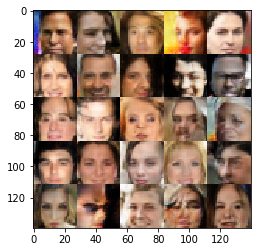

Epoch 6/10... Batch 420... Discriminator Loss: 1.2705... Generator Loss: 0.6151
Epoch 6/10... Batch 440... Discriminator Loss: 0.7570... Generator Loss: 1.2773
Epoch 6/10... Batch 460... Discriminator Loss: 1.4024... Generator Loss: 0.8514
Epoch 6/10... Batch 480... Discriminator Loss: 2.2090... Generator Loss: 0.3325
Epoch 6/10... Batch 500... Discriminator Loss: 0.9047... Generator Loss: 1.2450
Epoch 6/10... Batch 520... Discriminator Loss: 1.0776... Generator Loss: 1.2719
Epoch 6/10... Batch 540... Discriminator Loss: 1.4703... Generator Loss: 0.6128
Epoch 6/10... Batch 560... Discriminator Loss: 1.0437... Generator Loss: 1.2995
Epoch 6/10... Batch 580... Discriminator Loss: 1.6501... Generator Loss: 0.8683
Epoch 6/10... Batch 600... Discriminator Loss: 0.8005... Generator Loss: 1.5492


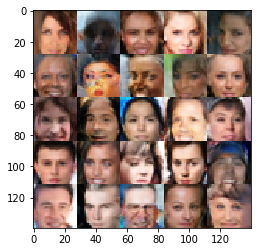

Epoch 6/10... Batch 620... Discriminator Loss: 0.7923... Generator Loss: 1.6904
Epoch 6/10... Batch 640... Discriminator Loss: 1.1372... Generator Loss: 1.2199
Epoch 6/10... Batch 660... Discriminator Loss: 1.2333... Generator Loss: 0.8921
Epoch 6/10... Batch 680... Discriminator Loss: 1.2290... Generator Loss: 0.9165
Epoch 6/10... Batch 700... Discriminator Loss: 1.2593... Generator Loss: 0.8956
Epoch 6/10... Batch 720... Discriminator Loss: 1.2109... Generator Loss: 0.9729
Epoch 6/10... Batch 740... Discriminator Loss: 1.3838... Generator Loss: 0.6838
Epoch 6/10... Batch 760... Discriminator Loss: 1.2012... Generator Loss: 1.0486
Epoch 6/10... Batch 780... Discriminator Loss: 0.8609... Generator Loss: 1.4888
Epoch 6/10... Batch 800... Discriminator Loss: 0.9241... Generator Loss: 1.7776


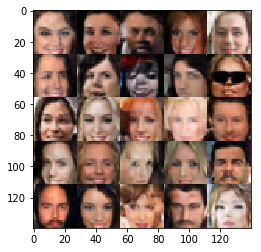

Epoch 6/10... Batch 820... Discriminator Loss: 1.3799... Generator Loss: 0.5172
Epoch 6/10... Batch 840... Discriminator Loss: 0.9928... Generator Loss: 1.1769
Epoch 6/10... Batch 860... Discriminator Loss: 1.3712... Generator Loss: 0.5802
Epoch 6/10... Batch 880... Discriminator Loss: 0.8794... Generator Loss: 1.4101
Epoch 6/10... Batch 900... Discriminator Loss: 1.1220... Generator Loss: 1.0134
Epoch 6/10... Batch 920... Discriminator Loss: 1.2839... Generator Loss: 0.8218
Epoch 6/10... Batch 940... Discriminator Loss: 0.7819... Generator Loss: 1.4649
Epoch 6/10... Batch 960... Discriminator Loss: 0.9158... Generator Loss: 1.9567
Epoch 6/10... Batch 980... Discriminator Loss: 1.0784... Generator Loss: 1.2365
Epoch 6/10... Batch 1000... Discriminator Loss: 1.2231... Generator Loss: 1.2217


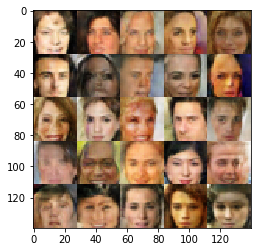

Epoch 6/10... Batch 1020... Discriminator Loss: 0.9922... Generator Loss: 1.0982
Epoch 6/10... Batch 1040... Discriminator Loss: 1.1538... Generator Loss: 0.7137
Epoch 6/10... Batch 1060... Discriminator Loss: 1.0769... Generator Loss: 1.1666
Epoch 6/10... Batch 1080... Discriminator Loss: 1.2826... Generator Loss: 0.9576
Epoch 6/10... Batch 1100... Discriminator Loss: 0.9001... Generator Loss: 1.0400
Epoch 6/10... Batch 1120... Discriminator Loss: 1.4177... Generator Loss: 0.6153
Epoch 6/10... Batch 1140... Discriminator Loss: 1.0559... Generator Loss: 0.9047
Epoch 6/10... Batch 1160... Discriminator Loss: 0.8492... Generator Loss: 1.3740
Epoch 6/10... Batch 1180... Discriminator Loss: 1.0734... Generator Loss: 1.0063
Epoch 6/10... Batch 1200... Discriminator Loss: 0.8796... Generator Loss: 1.2212


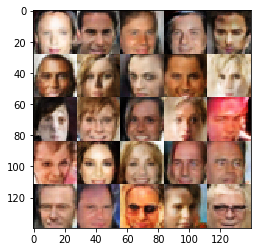

Epoch 6/10... Batch 1220... Discriminator Loss: 1.1086... Generator Loss: 1.1049
Epoch 6/10... Batch 1240... Discriminator Loss: 0.8709... Generator Loss: 1.3514
Epoch 6/10... Batch 1260... Discriminator Loss: 0.9015... Generator Loss: 1.3072
Epoch 6/10... Batch 1280... Discriminator Loss: 0.9535... Generator Loss: 1.0786
Epoch 6/10... Batch 1300... Discriminator Loss: 0.9523... Generator Loss: 1.2497
Epoch 6/10... Batch 1320... Discriminator Loss: 1.1192... Generator Loss: 1.1931
Epoch 6/10... Batch 1340... Discriminator Loss: 0.8928... Generator Loss: 1.1401
Epoch 6/10... Batch 1360... Discriminator Loss: 1.2417... Generator Loss: 0.9270
Epoch 6/10... Batch 1380... Discriminator Loss: 1.2880... Generator Loss: 0.8502
Epoch 6/10... Batch 1400... Discriminator Loss: 0.9505... Generator Loss: 1.3689


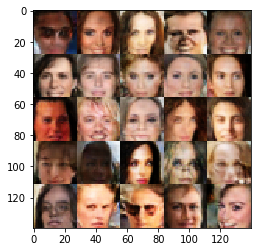

Epoch 6/10... Batch 1420... Discriminator Loss: 1.0172... Generator Loss: 1.1270
Epoch 6/10... Batch 1440... Discriminator Loss: 1.5105... Generator Loss: 0.5107
Epoch 6/10... Batch 1460... Discriminator Loss: 1.4719... Generator Loss: 0.6881
Epoch 6/10... Batch 1480... Discriminator Loss: 1.1957... Generator Loss: 0.8924
Epoch 6/10... Batch 1500... Discriminator Loss: 1.3410... Generator Loss: 0.6094
Epoch 6/10... Batch 1520... Discriminator Loss: 1.0472... Generator Loss: 1.1869
Epoch 6/10... Batch 1540... Discriminator Loss: 0.8583... Generator Loss: 1.3002
Epoch 6/10... Batch 1560... Discriminator Loss: 0.9374... Generator Loss: 1.2229
Epoch 6/10... Batch 1580... Discriminator Loss: 1.1323... Generator Loss: 1.1147
Epoch 6/10... Batch 1600... Discriminator Loss: 1.0276... Generator Loss: 1.2716


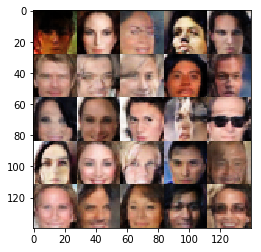

Epoch 6/10... Batch 1620... Discriminator Loss: 1.1285... Generator Loss: 0.9348
Epoch 6/10... Batch 1640... Discriminator Loss: 1.1528... Generator Loss: 1.2142
Epoch 6/10... Batch 1660... Discriminator Loss: 0.8707... Generator Loss: 1.3108
Epoch 6/10... Batch 1680... Discriminator Loss: 0.9957... Generator Loss: 1.2351
Epoch 6/10... Batch 1700... Discriminator Loss: 1.0529... Generator Loss: 1.3631
Epoch 6/10... Batch 1720... Discriminator Loss: 1.0659... Generator Loss: 1.2029
Epoch 6/10... Batch 1740... Discriminator Loss: 0.9626... Generator Loss: 1.5308
Epoch 6/10... Batch 1760... Discriminator Loss: 1.1252... Generator Loss: 0.8895
Epoch 6/10... Batch 1780... Discriminator Loss: 1.4319... Generator Loss: 0.6745
Epoch 6/10... Batch 1800... Discriminator Loss: 1.1308... Generator Loss: 0.7401


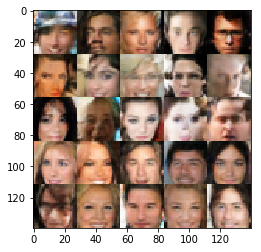

Epoch 6/10... Batch 1820... Discriminator Loss: 1.0631... Generator Loss: 1.1188
Epoch 6/10... Batch 1840... Discriminator Loss: 1.5260... Generator Loss: 0.7048
Epoch 6/10... Batch 1860... Discriminator Loss: 0.8451... Generator Loss: 1.4922
Epoch 6/10... Batch 1880... Discriminator Loss: 1.2159... Generator Loss: 0.7887
Epoch 6/10... Batch 1900... Discriminator Loss: 1.3423... Generator Loss: 0.7738
Epoch 6/10... Batch 1920... Discriminator Loss: 1.1358... Generator Loss: 0.7198
Epoch 6/10... Batch 1940... Discriminator Loss: 1.1707... Generator Loss: 1.1393
Epoch 6/10... Batch 1960... Discriminator Loss: 1.4530... Generator Loss: 0.8900
Epoch 6/10... Batch 1980... Discriminator Loss: 0.9791... Generator Loss: 1.1697
Epoch 6/10... Batch 2000... Discriminator Loss: 1.0460... Generator Loss: 1.3891


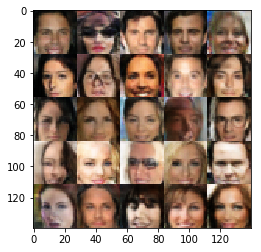

Epoch 6/10... Batch 2020... Discriminator Loss: 1.1536... Generator Loss: 0.7197
Epoch 6/10... Batch 2040... Discriminator Loss: 1.0122... Generator Loss: 1.1047
Epoch 6/10... Batch 2060... Discriminator Loss: 1.2387... Generator Loss: 1.1244
Epoch 6/10... Batch 2080... Discriminator Loss: 1.1453... Generator Loss: 1.0015
Epoch 6/10... Batch 2100... Discriminator Loss: 1.1059... Generator Loss: 0.8441
Epoch 6/10... Batch 2120... Discriminator Loss: 1.0586... Generator Loss: 1.1222
Epoch 6/10... Batch 2140... Discriminator Loss: 1.2721... Generator Loss: 0.9527
Epoch 6/10... Batch 2160... Discriminator Loss: 1.0688... Generator Loss: 0.8604
Epoch 6/10... Batch 2180... Discriminator Loss: 1.4226... Generator Loss: 0.4149
Epoch 6/10... Batch 2200... Discriminator Loss: 0.9046... Generator Loss: 1.2554


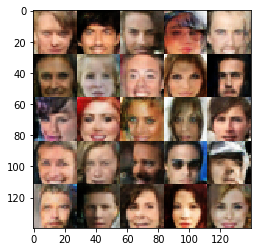

Epoch 6/10... Batch 2220... Discriminator Loss: 1.1966... Generator Loss: 2.0321
Epoch 6/10... Batch 2240... Discriminator Loss: 0.7935... Generator Loss: 1.4262
Epoch 6/10... Batch 2260... Discriminator Loss: 1.0972... Generator Loss: 0.9258
Epoch 6/10... Batch 2280... Discriminator Loss: 1.2441... Generator Loss: 0.7443
Epoch 6/10... Batch 2300... Discriminator Loss: 1.4934... Generator Loss: 0.4854
Epoch 6/10... Batch 2320... Discriminator Loss: 1.2118... Generator Loss: 1.0342
Epoch 6/10... Batch 2340... Discriminator Loss: 1.4838... Generator Loss: 0.8163
Epoch 6/10... Batch 2360... Discriminator Loss: 0.9045... Generator Loss: 1.5034
Epoch 6/10... Batch 2380... Discriminator Loss: 2.1359... Generator Loss: 0.2860
Epoch 6/10... Batch 2400... Discriminator Loss: 1.0858... Generator Loss: 1.2674


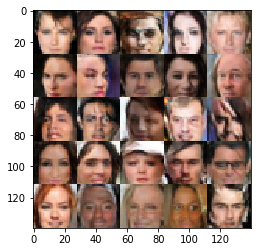

Epoch 6/10... Batch 2420... Discriminator Loss: 1.0718... Generator Loss: 0.9256
Epoch 6/10... Batch 2440... Discriminator Loss: 1.3942... Generator Loss: 0.6852
Epoch 6/10... Batch 2460... Discriminator Loss: 0.8439... Generator Loss: 1.2119
Epoch 6/10... Batch 2480... Discriminator Loss: 1.2212... Generator Loss: 0.9577
Epoch 6/10... Batch 2500... Discriminator Loss: 1.2254... Generator Loss: 0.9813
Epoch 6/10... Batch 2520... Discriminator Loss: 1.0514... Generator Loss: 1.3983
Epoch 6/10... Batch 2540... Discriminator Loss: 0.9153... Generator Loss: 1.2315
Epoch 6/10... Batch 2560... Discriminator Loss: 1.2981... Generator Loss: 0.6936
Epoch 6/10... Batch 2580... Discriminator Loss: 1.1273... Generator Loss: 1.6005
Epoch 6/10... Batch 2600... Discriminator Loss: 1.0047... Generator Loss: 0.8778


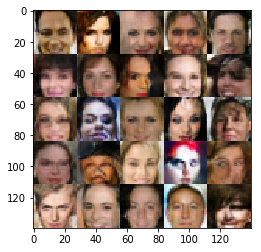

Epoch 6/10... Batch 2620... Discriminator Loss: 1.0324... Generator Loss: 1.7572
Epoch 6/10... Batch 2640... Discriminator Loss: 1.0299... Generator Loss: 1.3412
Epoch 6/10... Batch 2660... Discriminator Loss: 1.0099... Generator Loss: 1.0878
Epoch 6/10... Batch 2680... Discriminator Loss: 1.0583... Generator Loss: 1.1612
Epoch 6/10... Batch 2700... Discriminator Loss: 1.0148... Generator Loss: 1.5457
Epoch 6/10... Batch 2720... Discriminator Loss: 1.1797... Generator Loss: 1.0125
Epoch 6/10... Batch 2740... Discriminator Loss: 1.3706... Generator Loss: 0.9259
Epoch 6/10... Batch 2760... Discriminator Loss: 1.1986... Generator Loss: 0.8369
Epoch 6/10... Batch 2780... Discriminator Loss: 1.2371... Generator Loss: 0.9911
Epoch 6/10... Batch 2800... Discriminator Loss: 1.3366... Generator Loss: 0.9585


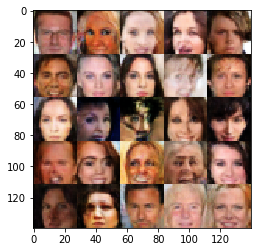

Epoch 6/10... Batch 2820... Discriminator Loss: 1.4066... Generator Loss: 0.9156
Epoch 6/10... Batch 2840... Discriminator Loss: 1.3337... Generator Loss: 0.8711
Epoch 6/10... Batch 2860... Discriminator Loss: 1.0728... Generator Loss: 1.2390
Epoch 6/10... Batch 2880... Discriminator Loss: 1.0557... Generator Loss: 0.9517
Epoch 6/10... Batch 2900... Discriminator Loss: 1.4640... Generator Loss: 1.1822
Epoch 6/10... Batch 2920... Discriminator Loss: 0.8854... Generator Loss: 1.2280
Epoch 6/10... Batch 2940... Discriminator Loss: 0.9962... Generator Loss: 1.0235
Epoch 6/10... Batch 2960... Discriminator Loss: 0.8830... Generator Loss: 1.1113
Epoch 6/10... Batch 2980... Discriminator Loss: 1.0000... Generator Loss: 1.1278
Epoch 6/10... Batch 3000... Discriminator Loss: 1.0991... Generator Loss: 1.0071


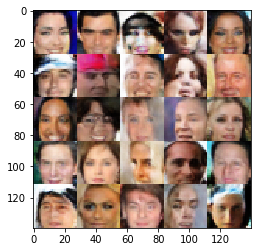

Epoch 6/10... Batch 3020... Discriminator Loss: 1.1723... Generator Loss: 0.7056
Epoch 6/10... Batch 3040... Discriminator Loss: 1.6721... Generator Loss: 0.4099
Epoch 6/10... Batch 3060... Discriminator Loss: 1.5402... Generator Loss: 0.5184
Epoch 6/10... Batch 3080... Discriminator Loss: 0.8010... Generator Loss: 1.3908
Epoch 6/10... Batch 3100... Discriminator Loss: 1.1237... Generator Loss: 0.8561
Epoch 6/10... Batch 3120... Discriminator Loss: 0.9672... Generator Loss: 1.3773
Epoch 6/10... Batch 3140... Discriminator Loss: 1.2450... Generator Loss: 1.0139
Epoch 6/10... Batch 3160... Discriminator Loss: 1.1690... Generator Loss: 1.1492
Epoch 7/10... Batch 20... Discriminator Loss: 0.8818... Generator Loss: 1.5092
Epoch 7/10... Batch 40... Discriminator Loss: 1.6789... Generator Loss: 0.5594
Epoch 7/10... Batch 60... Discriminator Loss: 1.1351... Generator Loss: 0.8893
Epoch 7/10... Batch 80... Discriminator Loss: 1.0435... Generator Loss: 1.1318
Epoch 7/10... Batch 100... Discrimin

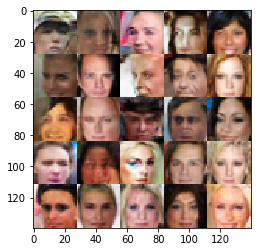

Epoch 7/10... Batch 220... Discriminator Loss: 1.0242... Generator Loss: 0.9695
Epoch 7/10... Batch 240... Discriminator Loss: 0.9815... Generator Loss: 1.1471
Epoch 7/10... Batch 260... Discriminator Loss: 1.1740... Generator Loss: 1.0971
Epoch 7/10... Batch 280... Discriminator Loss: 0.8877... Generator Loss: 1.2883
Epoch 7/10... Batch 300... Discriminator Loss: 1.3256... Generator Loss: 0.9382
Epoch 7/10... Batch 320... Discriminator Loss: 1.0477... Generator Loss: 1.1461
Epoch 7/10... Batch 340... Discriminator Loss: 1.3823... Generator Loss: 0.6221
Epoch 7/10... Batch 360... Discriminator Loss: 1.0054... Generator Loss: 1.2413
Epoch 7/10... Batch 380... Discriminator Loss: 0.7414... Generator Loss: 2.0628
Epoch 7/10... Batch 400... Discriminator Loss: 0.7705... Generator Loss: 1.6080


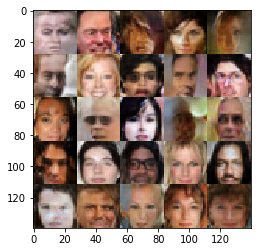

Epoch 7/10... Batch 420... Discriminator Loss: 1.4350... Generator Loss: 0.8941
Epoch 7/10... Batch 440... Discriminator Loss: 0.8510... Generator Loss: 1.5430
Epoch 7/10... Batch 460... Discriminator Loss: 1.1865... Generator Loss: 0.6784
Epoch 7/10... Batch 480... Discriminator Loss: 1.2328... Generator Loss: 0.9438
Epoch 7/10... Batch 500... Discriminator Loss: 1.1885... Generator Loss: 1.0537
Epoch 7/10... Batch 520... Discriminator Loss: 1.4534... Generator Loss: 0.7011
Epoch 7/10... Batch 540... Discriminator Loss: 0.8372... Generator Loss: 1.6138
Epoch 7/10... Batch 560... Discriminator Loss: 1.0706... Generator Loss: 1.1833
Epoch 7/10... Batch 580... Discriminator Loss: 1.0636... Generator Loss: 1.3417
Epoch 7/10... Batch 600... Discriminator Loss: 0.7670... Generator Loss: 1.9601


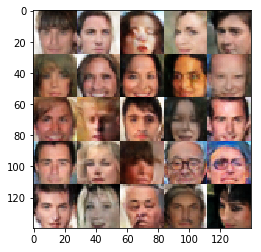

Epoch 7/10... Batch 620... Discriminator Loss: 0.7749... Generator Loss: 1.4417
Epoch 7/10... Batch 640... Discriminator Loss: 1.0139... Generator Loss: 0.9162
Epoch 7/10... Batch 660... Discriminator Loss: 1.2209... Generator Loss: 1.0648
Epoch 7/10... Batch 680... Discriminator Loss: 1.0806... Generator Loss: 1.1357
Epoch 7/10... Batch 700... Discriminator Loss: 1.0453... Generator Loss: 0.9501
Epoch 7/10... Batch 720... Discriminator Loss: 1.0620... Generator Loss: 0.7234
Epoch 7/10... Batch 740... Discriminator Loss: 1.2517... Generator Loss: 0.7677
Epoch 7/10... Batch 760... Discriminator Loss: 0.9520... Generator Loss: 1.2589
Epoch 7/10... Batch 780... Discriminator Loss: 1.0174... Generator Loss: 1.2980
Epoch 7/10... Batch 800... Discriminator Loss: 0.7805... Generator Loss: 1.6073


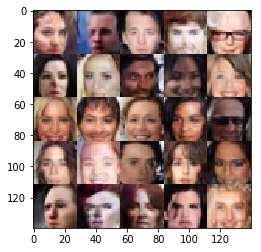

Epoch 7/10... Batch 820... Discriminator Loss: 1.1271... Generator Loss: 0.8131
Epoch 7/10... Batch 840... Discriminator Loss: 0.9637... Generator Loss: 1.3904
Epoch 7/10... Batch 860... Discriminator Loss: 1.0436... Generator Loss: 1.4680
Epoch 7/10... Batch 880... Discriminator Loss: 0.7956... Generator Loss: 1.2408
Epoch 7/10... Batch 900... Discriminator Loss: 0.9254... Generator Loss: 1.4883
Epoch 7/10... Batch 920... Discriminator Loss: 1.4814... Generator Loss: 0.5015
Epoch 7/10... Batch 940... Discriminator Loss: 0.7595... Generator Loss: 2.2140
Epoch 7/10... Batch 960... Discriminator Loss: 0.9090... Generator Loss: 1.4462
Epoch 7/10... Batch 980... Discriminator Loss: 0.8305... Generator Loss: 1.5887
Epoch 7/10... Batch 1000... Discriminator Loss: 0.9356... Generator Loss: 1.0966


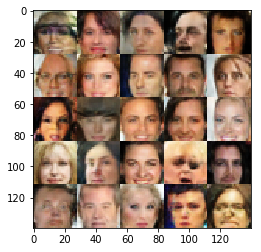

Epoch 7/10... Batch 1020... Discriminator Loss: 1.1599... Generator Loss: 0.9450
Epoch 7/10... Batch 1040... Discriminator Loss: 0.7347... Generator Loss: 1.5834
Epoch 7/10... Batch 1060... Discriminator Loss: 1.0142... Generator Loss: 0.9839
Epoch 7/10... Batch 1080... Discriminator Loss: 0.8683... Generator Loss: 1.3782
Epoch 7/10... Batch 1100... Discriminator Loss: 1.1371... Generator Loss: 0.9756
Epoch 7/10... Batch 1120... Discriminator Loss: 0.9741... Generator Loss: 0.8184
Epoch 7/10... Batch 1140... Discriminator Loss: 0.7782... Generator Loss: 1.6195
Epoch 7/10... Batch 1160... Discriminator Loss: 0.9899... Generator Loss: 1.1036
Epoch 7/10... Batch 1180... Discriminator Loss: 1.0889... Generator Loss: 1.1518
Epoch 7/10... Batch 1200... Discriminator Loss: 0.9972... Generator Loss: 1.8006


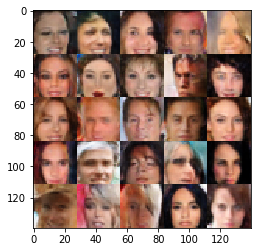

Epoch 7/10... Batch 1220... Discriminator Loss: 1.2227... Generator Loss: 0.6527
Epoch 7/10... Batch 1240... Discriminator Loss: 0.9692... Generator Loss: 1.2087
Epoch 7/10... Batch 1260... Discriminator Loss: 0.7883... Generator Loss: 1.9424
Epoch 7/10... Batch 1280... Discriminator Loss: 1.1424... Generator Loss: 1.6732
Epoch 7/10... Batch 1300... Discriminator Loss: 1.3635... Generator Loss: 0.8408
Epoch 7/10... Batch 1320... Discriminator Loss: 0.9990... Generator Loss: 1.2861
Epoch 7/10... Batch 1340... Discriminator Loss: 0.7931... Generator Loss: 1.7352
Epoch 7/10... Batch 1360... Discriminator Loss: 1.2784... Generator Loss: 0.5503
Epoch 7/10... Batch 1380... Discriminator Loss: 1.0790... Generator Loss: 1.0946
Epoch 7/10... Batch 1400... Discriminator Loss: 1.0920... Generator Loss: 1.0407


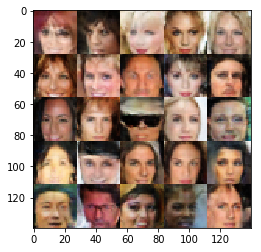

Epoch 7/10... Batch 1420... Discriminator Loss: 1.0608... Generator Loss: 0.8625
Epoch 7/10... Batch 1440... Discriminator Loss: 1.4213... Generator Loss: 0.8163
Epoch 7/10... Batch 1460... Discriminator Loss: 1.5573... Generator Loss: 0.6451
Epoch 7/10... Batch 1480... Discriminator Loss: 1.1721... Generator Loss: 0.8240
Epoch 7/10... Batch 1500... Discriminator Loss: 1.0935... Generator Loss: 1.4311
Epoch 7/10... Batch 1520... Discriminator Loss: 0.8597... Generator Loss: 1.4583
Epoch 7/10... Batch 1540... Discriminator Loss: 1.0619... Generator Loss: 1.5619
Epoch 7/10... Batch 1560... Discriminator Loss: 0.9575... Generator Loss: 1.4822
Epoch 7/10... Batch 1580... Discriminator Loss: 1.0924... Generator Loss: 0.9429
Epoch 7/10... Batch 1600... Discriminator Loss: 1.0568... Generator Loss: 1.1283


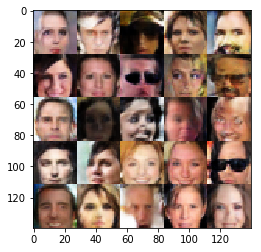

Epoch 7/10... Batch 1620... Discriminator Loss: 1.1353... Generator Loss: 0.8148
Epoch 7/10... Batch 1640... Discriminator Loss: 0.8859... Generator Loss: 1.6239
Epoch 7/10... Batch 1660... Discriminator Loss: 0.8324... Generator Loss: 1.3695
Epoch 7/10... Batch 1680... Discriminator Loss: 1.7956... Generator Loss: 0.5067
Epoch 7/10... Batch 1700... Discriminator Loss: 1.1072... Generator Loss: 1.0805
Epoch 7/10... Batch 1720... Discriminator Loss: 1.0773... Generator Loss: 0.9638
Epoch 7/10... Batch 1740... Discriminator Loss: 0.9310... Generator Loss: 0.9974
Epoch 7/10... Batch 1760... Discriminator Loss: 0.9813... Generator Loss: 1.2925
Epoch 7/10... Batch 1780... Discriminator Loss: 1.1205... Generator Loss: 1.2867
Epoch 7/10... Batch 1800... Discriminator Loss: 1.3342... Generator Loss: 0.6167


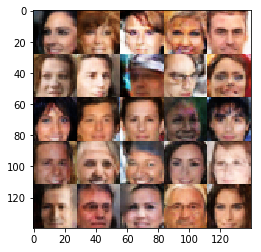

Epoch 7/10... Batch 1820... Discriminator Loss: 0.9911... Generator Loss: 1.3870
Epoch 7/10... Batch 1840... Discriminator Loss: 1.6003... Generator Loss: 0.5218
Epoch 7/10... Batch 1860... Discriminator Loss: 0.8505... Generator Loss: 1.7025
Epoch 7/10... Batch 1880... Discriminator Loss: 0.9649... Generator Loss: 1.0832
Epoch 7/10... Batch 1900... Discriminator Loss: 1.2728... Generator Loss: 0.6251
Epoch 7/10... Batch 1920... Discriminator Loss: 1.3214... Generator Loss: 0.8793
Epoch 7/10... Batch 1940... Discriminator Loss: 1.1169... Generator Loss: 0.7485
Epoch 7/10... Batch 1960... Discriminator Loss: 1.3719... Generator Loss: 0.7604
Epoch 7/10... Batch 1980... Discriminator Loss: 0.9162... Generator Loss: 1.0447
Epoch 7/10... Batch 2000... Discriminator Loss: 0.9597... Generator Loss: 1.1854


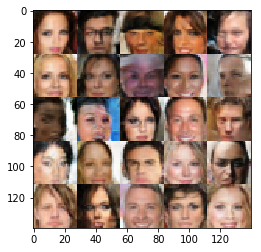

Epoch 7/10... Batch 2020... Discriminator Loss: 0.7692... Generator Loss: 1.4259
Epoch 7/10... Batch 2040... Discriminator Loss: 0.8903... Generator Loss: 1.6840
Epoch 7/10... Batch 2060... Discriminator Loss: 1.2289... Generator Loss: 0.7567
Epoch 7/10... Batch 2080... Discriminator Loss: 1.4314... Generator Loss: 0.5641
Epoch 7/10... Batch 2100... Discriminator Loss: 1.0229... Generator Loss: 0.9794
Epoch 7/10... Batch 2120... Discriminator Loss: 1.1159... Generator Loss: 0.9816
Epoch 7/10... Batch 2140... Discriminator Loss: 1.1214... Generator Loss: 0.9029
Epoch 7/10... Batch 2160... Discriminator Loss: 1.2711... Generator Loss: 0.8263
Epoch 7/10... Batch 2180... Discriminator Loss: 0.8590... Generator Loss: 1.1347
Epoch 7/10... Batch 2200... Discriminator Loss: 1.2636... Generator Loss: 0.7928


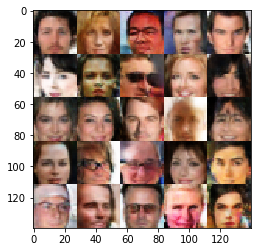

Epoch 7/10... Batch 2220... Discriminator Loss: 0.9521... Generator Loss: 1.5231
Epoch 7/10... Batch 2240... Discriminator Loss: 0.6755... Generator Loss: 1.9056
Epoch 7/10... Batch 2260... Discriminator Loss: 0.8899... Generator Loss: 1.5820
Epoch 7/10... Batch 2280... Discriminator Loss: 1.6880... Generator Loss: 0.6989
Epoch 7/10... Batch 2300... Discriminator Loss: 1.1668... Generator Loss: 0.6689
Epoch 7/10... Batch 2320... Discriminator Loss: 1.3845... Generator Loss: 0.6422
Epoch 7/10... Batch 2340... Discriminator Loss: 1.0401... Generator Loss: 1.3363
Epoch 7/10... Batch 2360... Discriminator Loss: 1.0080... Generator Loss: 1.1696
Epoch 7/10... Batch 2380... Discriminator Loss: 0.6432... Generator Loss: 2.2433
Epoch 7/10... Batch 2400... Discriminator Loss: 0.9643... Generator Loss: 1.3068


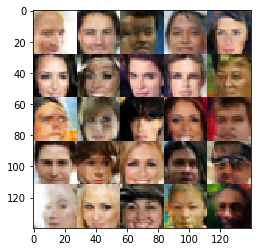

Epoch 7/10... Batch 2420... Discriminator Loss: 1.0592... Generator Loss: 0.9107
Epoch 7/10... Batch 2440... Discriminator Loss: 0.9598... Generator Loss: 0.9819
Epoch 7/10... Batch 2460... Discriminator Loss: 0.8980... Generator Loss: 1.0657
Epoch 7/10... Batch 2480... Discriminator Loss: 1.5164... Generator Loss: 0.6863
Epoch 7/10... Batch 2500... Discriminator Loss: 1.1473... Generator Loss: 0.6921
Epoch 7/10... Batch 2520... Discriminator Loss: 1.0614... Generator Loss: 1.1874
Epoch 7/10... Batch 2540... Discriminator Loss: 0.9716... Generator Loss: 0.8196
Epoch 7/10... Batch 2560... Discriminator Loss: 1.3197... Generator Loss: 0.7923
Epoch 7/10... Batch 2580... Discriminator Loss: 1.2649... Generator Loss: 0.8245
Epoch 7/10... Batch 2600... Discriminator Loss: 1.1973... Generator Loss: 1.2376


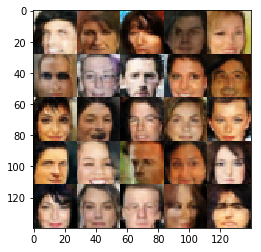

Epoch 7/10... Batch 2620... Discriminator Loss: 0.9208... Generator Loss: 1.7818
Epoch 7/10... Batch 2640... Discriminator Loss: 1.1921... Generator Loss: 1.1118
Epoch 7/10... Batch 2660... Discriminator Loss: 0.9597... Generator Loss: 1.1955
Epoch 7/10... Batch 2680... Discriminator Loss: 0.9127... Generator Loss: 1.3582
Epoch 7/10... Batch 2700... Discriminator Loss: 1.5736... Generator Loss: 1.0115
Epoch 7/10... Batch 2720... Discriminator Loss: 0.9381... Generator Loss: 1.0233
Epoch 7/10... Batch 2740... Discriminator Loss: 1.0062... Generator Loss: 0.8948
Epoch 7/10... Batch 2760... Discriminator Loss: 1.3336... Generator Loss: 0.7640
Epoch 7/10... Batch 2780... Discriminator Loss: 1.4820... Generator Loss: 0.8403
Epoch 7/10... Batch 2800... Discriminator Loss: 1.1418... Generator Loss: 0.9324


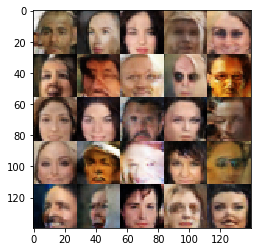

Epoch 7/10... Batch 2820... Discriminator Loss: 1.0645... Generator Loss: 0.9999
Epoch 7/10... Batch 2840... Discriminator Loss: 0.9071... Generator Loss: 1.4087
Epoch 7/10... Batch 2860... Discriminator Loss: 2.6184... Generator Loss: 0.5240
Epoch 7/10... Batch 2880... Discriminator Loss: 1.0350... Generator Loss: 0.9034
Epoch 7/10... Batch 2900... Discriminator Loss: 1.0504... Generator Loss: 0.9667
Epoch 7/10... Batch 2920... Discriminator Loss: 1.0613... Generator Loss: 1.1234
Epoch 7/10... Batch 2940... Discriminator Loss: 1.3273... Generator Loss: 0.7648
Epoch 7/10... Batch 2960... Discriminator Loss: 0.9261... Generator Loss: 1.2044
Epoch 7/10... Batch 2980... Discriminator Loss: 1.0422... Generator Loss: 0.9975
Epoch 7/10... Batch 3000... Discriminator Loss: 1.2287... Generator Loss: 0.8418


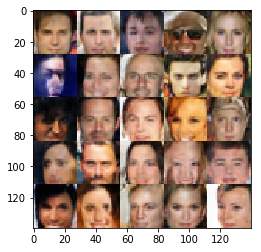

Epoch 7/10... Batch 3020... Discriminator Loss: 0.9006... Generator Loss: 1.5074
Epoch 7/10... Batch 3040... Discriminator Loss: 1.0962... Generator Loss: 1.2174
Epoch 7/10... Batch 3060... Discriminator Loss: 1.4908... Generator Loss: 0.6984
Epoch 7/10... Batch 3080... Discriminator Loss: 1.1140... Generator Loss: 0.9212
Epoch 7/10... Batch 3100... Discriminator Loss: 1.1454... Generator Loss: 0.7969
Epoch 7/10... Batch 3120... Discriminator Loss: 0.9341... Generator Loss: 1.1877
Epoch 7/10... Batch 3140... Discriminator Loss: 1.0453... Generator Loss: 1.1646
Epoch 7/10... Batch 3160... Discriminator Loss: 1.2172... Generator Loss: 0.8954
Epoch 8/10... Batch 20... Discriminator Loss: 0.8312... Generator Loss: 1.4655
Epoch 8/10... Batch 40... Discriminator Loss: 1.2025... Generator Loss: 0.8263
Epoch 8/10... Batch 60... Discriminator Loss: 1.3822... Generator Loss: 0.6448
Epoch 8/10... Batch 80... Discriminator Loss: 1.1904... Generator Loss: 1.0255
Epoch 8/10... Batch 100... Discrimin

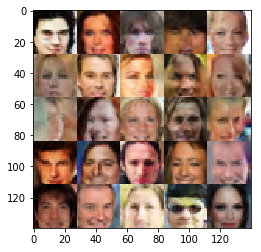

Epoch 8/10... Batch 220... Discriminator Loss: 1.2232... Generator Loss: 0.8378
Epoch 8/10... Batch 240... Discriminator Loss: 1.0305... Generator Loss: 0.9921
Epoch 8/10... Batch 260... Discriminator Loss: 0.8384... Generator Loss: 1.3574
Epoch 8/10... Batch 280... Discriminator Loss: 1.0463... Generator Loss: 1.0329
Epoch 8/10... Batch 300... Discriminator Loss: 1.0088... Generator Loss: 1.0524
Epoch 8/10... Batch 320... Discriminator Loss: 0.9797... Generator Loss: 1.3957
Epoch 8/10... Batch 340... Discriminator Loss: 0.8447... Generator Loss: 2.0449
Epoch 8/10... Batch 360... Discriminator Loss: 1.2917... Generator Loss: 0.8836
Epoch 8/10... Batch 380... Discriminator Loss: 0.7642... Generator Loss: 1.8773
Epoch 8/10... Batch 400... Discriminator Loss: 0.8293... Generator Loss: 1.4814


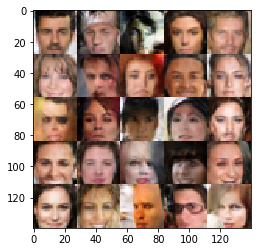

Epoch 8/10... Batch 420... Discriminator Loss: 1.6442... Generator Loss: 0.4449
Epoch 8/10... Batch 440... Discriminator Loss: 0.9694... Generator Loss: 1.0761
Epoch 8/10... Batch 460... Discriminator Loss: 1.5857... Generator Loss: 0.8273
Epoch 8/10... Batch 480... Discriminator Loss: 1.2162... Generator Loss: 1.1226
Epoch 8/10... Batch 500... Discriminator Loss: 0.8598... Generator Loss: 1.6913
Epoch 8/10... Batch 520... Discriminator Loss: 0.9366... Generator Loss: 1.7108
Epoch 8/10... Batch 540... Discriminator Loss: 0.8009... Generator Loss: 1.9613
Epoch 8/10... Batch 560... Discriminator Loss: 1.4315... Generator Loss: 1.2053
Epoch 8/10... Batch 580... Discriminator Loss: 0.7766... Generator Loss: 1.4426
Epoch 8/10... Batch 600... Discriminator Loss: 0.8706... Generator Loss: 1.5058


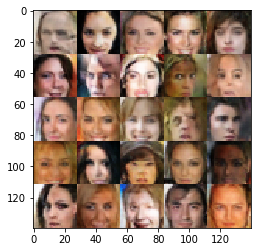

Epoch 8/10... Batch 620... Discriminator Loss: 1.1382... Generator Loss: 0.9829
Epoch 8/10... Batch 640... Discriminator Loss: 1.0473... Generator Loss: 1.2775
Epoch 8/10... Batch 660... Discriminator Loss: 1.4261... Generator Loss: 0.6633
Epoch 8/10... Batch 680... Discriminator Loss: 1.4668... Generator Loss: 0.7715
Epoch 8/10... Batch 700... Discriminator Loss: 1.6528... Generator Loss: 0.9995
Epoch 8/10... Batch 720... Discriminator Loss: 0.7751... Generator Loss: 1.4837
Epoch 8/10... Batch 740... Discriminator Loss: 1.3258... Generator Loss: 1.7848
Epoch 8/10... Batch 760... Discriminator Loss: 1.2204... Generator Loss: 0.8453
Epoch 8/10... Batch 780... Discriminator Loss: 1.1158... Generator Loss: 1.1699
Epoch 8/10... Batch 800... Discriminator Loss: 0.7074... Generator Loss: 1.6950


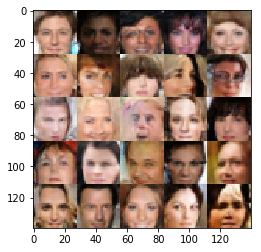

Epoch 8/10... Batch 820... Discriminator Loss: 1.2440... Generator Loss: 0.8261
Epoch 8/10... Batch 840... Discriminator Loss: 1.0415... Generator Loss: 0.8025
Epoch 8/10... Batch 860... Discriminator Loss: 1.1692... Generator Loss: 0.7208
Epoch 8/10... Batch 880... Discriminator Loss: 0.9014... Generator Loss: 1.5778
Epoch 8/10... Batch 900... Discriminator Loss: 1.0686... Generator Loss: 0.9950
Epoch 8/10... Batch 920... Discriminator Loss: 1.1543... Generator Loss: 0.8684
Epoch 8/10... Batch 940... Discriminator Loss: 0.6360... Generator Loss: 2.0318
Epoch 8/10... Batch 960... Discriminator Loss: 0.8581... Generator Loss: 1.4042
Epoch 8/10... Batch 980... Discriminator Loss: 0.9686... Generator Loss: 1.0764
Epoch 8/10... Batch 1000... Discriminator Loss: 1.3083... Generator Loss: 0.5914


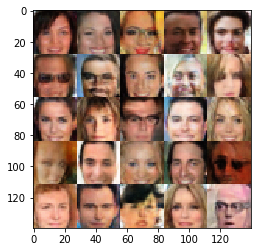

Epoch 8/10... Batch 1020... Discriminator Loss: 1.1931... Generator Loss: 0.9214
Epoch 8/10... Batch 1040... Discriminator Loss: 0.8798... Generator Loss: 1.3353
Epoch 8/10... Batch 1060... Discriminator Loss: 1.2908... Generator Loss: 1.0996
Epoch 8/10... Batch 1080... Discriminator Loss: 1.2640... Generator Loss: 1.0302
Epoch 8/10... Batch 1100... Discriminator Loss: 1.2881... Generator Loss: 1.0372
Epoch 8/10... Batch 1120... Discriminator Loss: 1.2920... Generator Loss: 0.5500
Epoch 8/10... Batch 1140... Discriminator Loss: 0.7114... Generator Loss: 1.4495
Epoch 8/10... Batch 1160... Discriminator Loss: 1.0957... Generator Loss: 2.3865
Epoch 8/10... Batch 1180... Discriminator Loss: 0.8632... Generator Loss: 1.5071
Epoch 8/10... Batch 1200... Discriminator Loss: 1.3001... Generator Loss: 0.7493


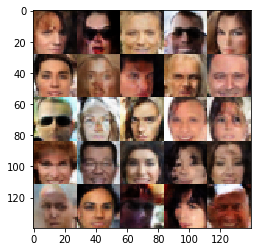

Epoch 8/10... Batch 1220... Discriminator Loss: 1.3111... Generator Loss: 0.8241
Epoch 8/10... Batch 1240... Discriminator Loss: 0.8631... Generator Loss: 1.8041
Epoch 8/10... Batch 1260... Discriminator Loss: 0.9336... Generator Loss: 1.3732
Epoch 8/10... Batch 1280... Discriminator Loss: 1.0632... Generator Loss: 1.4730
Epoch 8/10... Batch 1300... Discriminator Loss: 1.3068... Generator Loss: 1.0283
Epoch 8/10... Batch 1320... Discriminator Loss: 1.0022... Generator Loss: 1.3546
Epoch 8/10... Batch 1340... Discriminator Loss: 1.0263... Generator Loss: 0.9646
Epoch 8/10... Batch 1360... Discriminator Loss: 1.2120... Generator Loss: 0.8731
Epoch 8/10... Batch 1380... Discriminator Loss: 1.3034... Generator Loss: 0.6753
Epoch 8/10... Batch 1400... Discriminator Loss: 0.9055... Generator Loss: 1.0817


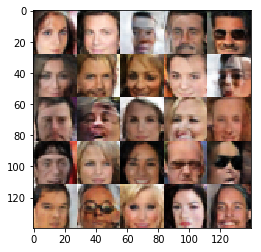

Epoch 8/10... Batch 1420... Discriminator Loss: 1.3593... Generator Loss: 0.6818
Epoch 8/10... Batch 1440... Discriminator Loss: 0.9599... Generator Loss: 0.9530
Epoch 8/10... Batch 1460... Discriminator Loss: 1.2201... Generator Loss: 1.0904
Epoch 8/10... Batch 1480... Discriminator Loss: 1.2578... Generator Loss: 1.4382
Epoch 8/10... Batch 1500... Discriminator Loss: 0.6822... Generator Loss: 1.7355
Epoch 8/10... Batch 1520... Discriminator Loss: 1.5342... Generator Loss: 0.7081
Epoch 8/10... Batch 1540... Discriminator Loss: 0.7400... Generator Loss: 1.3669
Epoch 8/10... Batch 1560... Discriminator Loss: 0.8590... Generator Loss: 1.3990
Epoch 8/10... Batch 1580... Discriminator Loss: 0.8073... Generator Loss: 1.4705
Epoch 8/10... Batch 1600... Discriminator Loss: 1.1103... Generator Loss: 1.2150


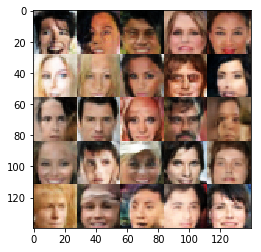

Epoch 8/10... Batch 1620... Discriminator Loss: 1.9261... Generator Loss: 0.4782
Epoch 8/10... Batch 1640... Discriminator Loss: 1.1424... Generator Loss: 1.3662
Epoch 8/10... Batch 1660... Discriminator Loss: 1.3304... Generator Loss: 0.8123
Epoch 8/10... Batch 1680... Discriminator Loss: 0.8533... Generator Loss: 1.1201
Epoch 8/10... Batch 1700... Discriminator Loss: 0.8548... Generator Loss: 1.5553
Epoch 8/10... Batch 1720... Discriminator Loss: 0.8889... Generator Loss: 1.4795
Epoch 8/10... Batch 1740... Discriminator Loss: 0.9322... Generator Loss: 1.6335
Epoch 8/10... Batch 1760... Discriminator Loss: 1.0972... Generator Loss: 1.1266
Epoch 8/10... Batch 1780... Discriminator Loss: 1.2643... Generator Loss: 1.0394
Epoch 8/10... Batch 1800... Discriminator Loss: 1.5477... Generator Loss: 0.9495


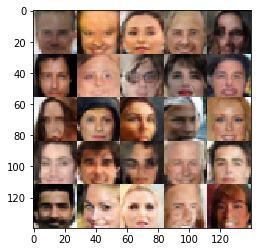

Epoch 8/10... Batch 1820... Discriminator Loss: 0.7687... Generator Loss: 1.9129
Epoch 8/10... Batch 1840... Discriminator Loss: 0.8456... Generator Loss: 1.0138
Epoch 8/10... Batch 1860... Discriminator Loss: 0.7447... Generator Loss: 1.4646
Epoch 8/10... Batch 1880... Discriminator Loss: 1.3847... Generator Loss: 1.0626
Epoch 8/10... Batch 1900... Discriminator Loss: 1.3005... Generator Loss: 1.1394
Epoch 8/10... Batch 1920... Discriminator Loss: 0.8488... Generator Loss: 1.3736
Epoch 8/10... Batch 1940... Discriminator Loss: 0.8582... Generator Loss: 1.9385
Epoch 8/10... Batch 1960... Discriminator Loss: 1.3598... Generator Loss: 0.6501
Epoch 8/10... Batch 1980... Discriminator Loss: 1.3527... Generator Loss: 0.8525
Epoch 8/10... Batch 2000... Discriminator Loss: 1.0128... Generator Loss: 1.3932


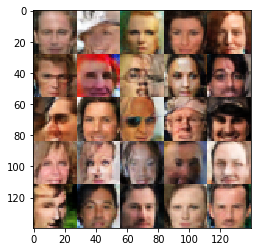

Epoch 8/10... Batch 2020... Discriminator Loss: 1.1064... Generator Loss: 1.2084
Epoch 8/10... Batch 2040... Discriminator Loss: 0.8847... Generator Loss: 1.8038
Epoch 8/10... Batch 2060... Discriminator Loss: 0.9765... Generator Loss: 1.2932
Epoch 8/10... Batch 2080... Discriminator Loss: 0.8559... Generator Loss: 1.3314
Epoch 8/10... Batch 2100... Discriminator Loss: 0.8510... Generator Loss: 1.4502
Epoch 8/10... Batch 2120... Discriminator Loss: 0.8639... Generator Loss: 1.7477
Epoch 8/10... Batch 2140... Discriminator Loss: 0.9079... Generator Loss: 1.7333
Epoch 8/10... Batch 2160... Discriminator Loss: 1.3561... Generator Loss: 0.5868
Epoch 8/10... Batch 2180... Discriminator Loss: 0.7592... Generator Loss: 1.6339
Epoch 8/10... Batch 2200... Discriminator Loss: 0.9400... Generator Loss: 1.1611


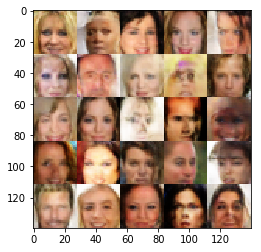

Epoch 8/10... Batch 2220... Discriminator Loss: 0.9423... Generator Loss: 1.3619
Epoch 8/10... Batch 2240... Discriminator Loss: 0.7482... Generator Loss: 1.5931
Epoch 8/10... Batch 2260... Discriminator Loss: 0.8073... Generator Loss: 1.7443
Epoch 8/10... Batch 2280... Discriminator Loss: 1.0722... Generator Loss: 1.2689
Epoch 8/10... Batch 2300... Discriminator Loss: 1.6617... Generator Loss: 0.5617
Epoch 8/10... Batch 2320... Discriminator Loss: 1.0519... Generator Loss: 1.1737
Epoch 8/10... Batch 2340... Discriminator Loss: 1.3033... Generator Loss: 1.2260
Epoch 8/10... Batch 2360... Discriminator Loss: 1.1745... Generator Loss: 1.2423
Epoch 8/10... Batch 2380... Discriminator Loss: 1.5685... Generator Loss: 0.8043
Epoch 8/10... Batch 2400... Discriminator Loss: 0.9298... Generator Loss: 1.2036


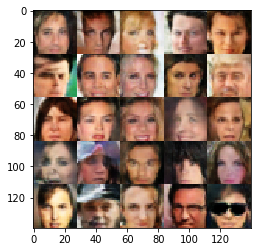

Epoch 8/10... Batch 2420... Discriminator Loss: 1.1695... Generator Loss: 1.1129
Epoch 8/10... Batch 2440... Discriminator Loss: 1.1774... Generator Loss: 0.7511
Epoch 8/10... Batch 2460... Discriminator Loss: 0.9315... Generator Loss: 1.3465
Epoch 8/10... Batch 2480... Discriminator Loss: 0.9989... Generator Loss: 1.0451
Epoch 8/10... Batch 2500... Discriminator Loss: 1.1912... Generator Loss: 1.1686
Epoch 8/10... Batch 2520... Discriminator Loss: 0.8226... Generator Loss: 1.4022
Epoch 8/10... Batch 2540... Discriminator Loss: 0.7501... Generator Loss: 1.9450
Epoch 8/10... Batch 2560... Discriminator Loss: 1.2987... Generator Loss: 0.8747
Epoch 8/10... Batch 2580... Discriminator Loss: 0.9990... Generator Loss: 0.9498
Epoch 8/10... Batch 2600... Discriminator Loss: 0.9374... Generator Loss: 1.7102


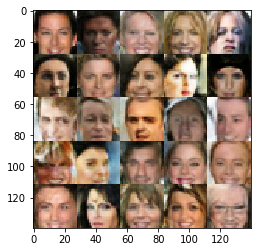

Epoch 8/10... Batch 2620... Discriminator Loss: 0.7328... Generator Loss: 1.8886
Epoch 8/10... Batch 2640... Discriminator Loss: 1.1433... Generator Loss: 0.8442
Epoch 8/10... Batch 2660... Discriminator Loss: 0.8147... Generator Loss: 1.4536
Epoch 8/10... Batch 2680... Discriminator Loss: 0.8042... Generator Loss: 1.7484
Epoch 8/10... Batch 2700... Discriminator Loss: 0.7394... Generator Loss: 1.4475
Epoch 8/10... Batch 2720... Discriminator Loss: 1.2126... Generator Loss: 0.6763
Epoch 8/10... Batch 2740... Discriminator Loss: 1.1713... Generator Loss: 1.1783
Epoch 8/10... Batch 2760... Discriminator Loss: 1.4144... Generator Loss: 0.9206
Epoch 8/10... Batch 2780... Discriminator Loss: 1.2876... Generator Loss: 0.8967
Epoch 8/10... Batch 2800... Discriminator Loss: 1.4491... Generator Loss: 0.8276


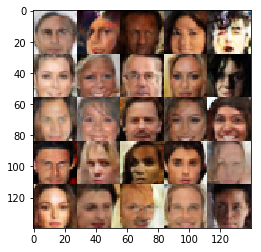

Epoch 8/10... Batch 2820... Discriminator Loss: 1.3354... Generator Loss: 0.7320
Epoch 8/10... Batch 2840... Discriminator Loss: 1.0286... Generator Loss: 1.0356
Epoch 8/10... Batch 2860... Discriminator Loss: 1.2294... Generator Loss: 0.9076
Epoch 8/10... Batch 2880... Discriminator Loss: 1.5036... Generator Loss: 0.6425
Epoch 8/10... Batch 2900... Discriminator Loss: 1.2879... Generator Loss: 1.0921
Epoch 8/10... Batch 2920... Discriminator Loss: 0.7806... Generator Loss: 1.3807
Epoch 8/10... Batch 2940... Discriminator Loss: 1.3443... Generator Loss: 0.7049
Epoch 8/10... Batch 2960... Discriminator Loss: 1.0423... Generator Loss: 1.2561
Epoch 8/10... Batch 2980... Discriminator Loss: 0.9749... Generator Loss: 1.3565
Epoch 8/10... Batch 3000... Discriminator Loss: 1.1283... Generator Loss: 0.9592


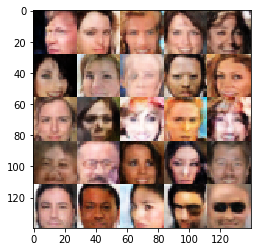

Epoch 8/10... Batch 3020... Discriminator Loss: 1.0134... Generator Loss: 0.9898
Epoch 8/10... Batch 3040... Discriminator Loss: 1.1102... Generator Loss: 0.7571
Epoch 8/10... Batch 3060... Discriminator Loss: 1.6173... Generator Loss: 0.7411
Epoch 8/10... Batch 3080... Discriminator Loss: 0.7004... Generator Loss: 2.1394
Epoch 8/10... Batch 3100... Discriminator Loss: 1.2783... Generator Loss: 0.9384
Epoch 8/10... Batch 3120... Discriminator Loss: 0.7061... Generator Loss: 1.5957
Epoch 8/10... Batch 3140... Discriminator Loss: 0.8849... Generator Loss: 1.4613
Epoch 8/10... Batch 3160... Discriminator Loss: 0.8933... Generator Loss: 1.8760
Epoch 9/10... Batch 20... Discriminator Loss: 0.7417... Generator Loss: 2.1408
Epoch 9/10... Batch 40... Discriminator Loss: 0.6732... Generator Loss: 1.8227
Epoch 9/10... Batch 60... Discriminator Loss: 0.8834... Generator Loss: 1.2297
Epoch 9/10... Batch 80... Discriminator Loss: 0.8923... Generator Loss: 1.1005
Epoch 9/10... Batch 100... Discrimin

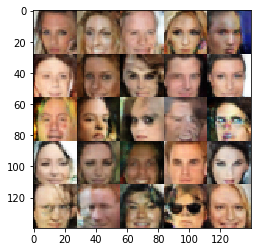

Epoch 9/10... Batch 220... Discriminator Loss: 1.1636... Generator Loss: 1.2020
Epoch 9/10... Batch 240... Discriminator Loss: 0.6979... Generator Loss: 1.5770
Epoch 9/10... Batch 260... Discriminator Loss: 0.8931... Generator Loss: 1.5781
Epoch 9/10... Batch 280... Discriminator Loss: 0.7326... Generator Loss: 1.5473
Epoch 9/10... Batch 300... Discriminator Loss: 0.9260... Generator Loss: 0.9680
Epoch 9/10... Batch 320... Discriminator Loss: 0.9018... Generator Loss: 1.2118
Epoch 9/10... Batch 340... Discriminator Loss: 1.1113... Generator Loss: 1.0823
Epoch 9/10... Batch 360... Discriminator Loss: 0.8202... Generator Loss: 1.3214
Epoch 9/10... Batch 380... Discriminator Loss: 0.8104... Generator Loss: 1.6512
Epoch 9/10... Batch 400... Discriminator Loss: 0.7138... Generator Loss: 1.8994


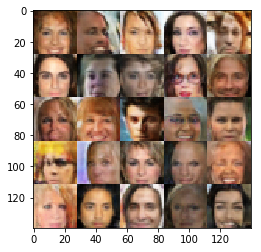

Epoch 9/10... Batch 420... Discriminator Loss: 0.9519... Generator Loss: 1.8351
Epoch 9/10... Batch 440... Discriminator Loss: 0.6617... Generator Loss: 1.7700
Epoch 9/10... Batch 460... Discriminator Loss: 1.5026... Generator Loss: 2.1521
Epoch 9/10... Batch 480... Discriminator Loss: 0.9413... Generator Loss: 1.2683
Epoch 9/10... Batch 500... Discriminator Loss: 1.0243... Generator Loss: 1.3524
Epoch 9/10... Batch 520... Discriminator Loss: 0.9904... Generator Loss: 1.0307
Epoch 9/10... Batch 540... Discriminator Loss: 0.8278... Generator Loss: 1.4586
Epoch 9/10... Batch 560... Discriminator Loss: 0.9217... Generator Loss: 1.1670
Epoch 9/10... Batch 580... Discriminator Loss: 0.8592... Generator Loss: 2.9770
Epoch 9/10... Batch 600... Discriminator Loss: 0.6429... Generator Loss: 2.2924


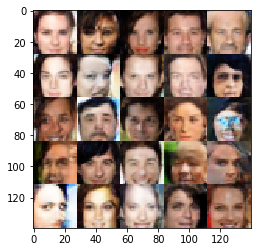

Epoch 9/10... Batch 620... Discriminator Loss: 0.6930... Generator Loss: 1.8870
Epoch 9/10... Batch 640... Discriminator Loss: 1.2991... Generator Loss: 0.7926
Epoch 9/10... Batch 660... Discriminator Loss: 1.0165... Generator Loss: 1.2245
Epoch 9/10... Batch 680... Discriminator Loss: 1.2538... Generator Loss: 0.9393
Epoch 9/10... Batch 700... Discriminator Loss: 0.7408... Generator Loss: 1.2286
Epoch 9/10... Batch 720... Discriminator Loss: 1.0339... Generator Loss: 1.0584
Epoch 9/10... Batch 740... Discriminator Loss: 1.3223... Generator Loss: 0.9443
Epoch 9/10... Batch 760... Discriminator Loss: 1.1698... Generator Loss: 0.5367
Epoch 9/10... Batch 780... Discriminator Loss: 0.6644... Generator Loss: 1.9896
Epoch 9/10... Batch 800... Discriminator Loss: 1.0781... Generator Loss: 1.4862


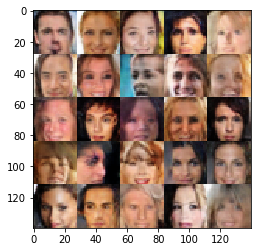

Epoch 9/10... Batch 820... Discriminator Loss: 1.1032... Generator Loss: 1.3156
Epoch 9/10... Batch 840... Discriminator Loss: 1.0409... Generator Loss: 1.1954
Epoch 9/10... Batch 860... Discriminator Loss: 1.1337... Generator Loss: 1.4986
Epoch 9/10... Batch 880... Discriminator Loss: 1.1512... Generator Loss: 1.1331
Epoch 9/10... Batch 900... Discriminator Loss: 0.8980... Generator Loss: 1.4196
Epoch 9/10... Batch 920... Discriminator Loss: 0.9542... Generator Loss: 0.8864
Epoch 9/10... Batch 940... Discriminator Loss: 0.6564... Generator Loss: 2.2448
Epoch 9/10... Batch 960... Discriminator Loss: 0.9370... Generator Loss: 1.5157
Epoch 9/10... Batch 980... Discriminator Loss: 0.9391... Generator Loss: 1.1160
Epoch 9/10... Batch 1000... Discriminator Loss: 1.1144... Generator Loss: 0.8261


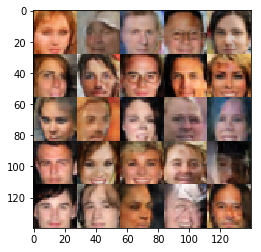

Epoch 9/10... Batch 1020... Discriminator Loss: 0.8705... Generator Loss: 1.6804
Epoch 9/10... Batch 1040... Discriminator Loss: 1.1712... Generator Loss: 1.0807
Epoch 9/10... Batch 1060... Discriminator Loss: 1.3587... Generator Loss: 0.8115
Epoch 9/10... Batch 1080... Discriminator Loss: 1.0663... Generator Loss: 1.2812
Epoch 9/10... Batch 1100... Discriminator Loss: 1.1015... Generator Loss: 0.9635
Epoch 9/10... Batch 1120... Discriminator Loss: 1.4835... Generator Loss: 0.8513
Epoch 9/10... Batch 1140... Discriminator Loss: 0.7192... Generator Loss: 1.8918
Epoch 9/10... Batch 1160... Discriminator Loss: 0.9681... Generator Loss: 0.9553
Epoch 9/10... Batch 1180... Discriminator Loss: 0.8937... Generator Loss: 1.7735
Epoch 9/10... Batch 1200... Discriminator Loss: 1.0815... Generator Loss: 1.0765


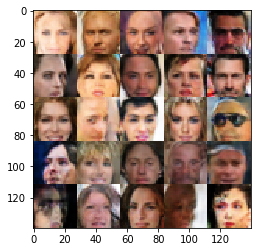

Epoch 9/10... Batch 1220... Discriminator Loss: 0.8269... Generator Loss: 1.2066
Epoch 9/10... Batch 1240... Discriminator Loss: 0.9892... Generator Loss: 1.3835
Epoch 9/10... Batch 1260... Discriminator Loss: 0.8589... Generator Loss: 1.7291
Epoch 9/10... Batch 1280... Discriminator Loss: 0.8720... Generator Loss: 1.4510
Epoch 9/10... Batch 1300... Discriminator Loss: 1.0966... Generator Loss: 1.2017
Epoch 9/10... Batch 1320... Discriminator Loss: 0.9026... Generator Loss: 1.3993
Epoch 9/10... Batch 1340... Discriminator Loss: 0.6895... Generator Loss: 1.7324
Epoch 9/10... Batch 1360... Discriminator Loss: 1.0571... Generator Loss: 1.2702
Epoch 9/10... Batch 1380... Discriminator Loss: 0.7870... Generator Loss: 0.9872
Epoch 9/10... Batch 1400... Discriminator Loss: 0.9629... Generator Loss: 0.9310


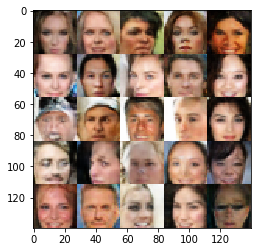

Epoch 9/10... Batch 1420... Discriminator Loss: 1.1905... Generator Loss: 0.7845
Epoch 9/10... Batch 1440... Discriminator Loss: 0.9696... Generator Loss: 1.1058
Epoch 9/10... Batch 1460... Discriminator Loss: 2.0664... Generator Loss: 0.4102
Epoch 9/10... Batch 1480... Discriminator Loss: 1.0902... Generator Loss: 0.9336
Epoch 9/10... Batch 1500... Discriminator Loss: 1.1267... Generator Loss: 1.3586
Epoch 9/10... Batch 1520... Discriminator Loss: 1.2595... Generator Loss: 1.0437
Epoch 9/10... Batch 1540... Discriminator Loss: 0.8428... Generator Loss: 1.6530
Epoch 9/10... Batch 1560... Discriminator Loss: 0.9223... Generator Loss: 1.4760
Epoch 9/10... Batch 1580... Discriminator Loss: 0.8231... Generator Loss: 1.6830
Epoch 9/10... Batch 1600... Discriminator Loss: 0.8046... Generator Loss: 1.3671


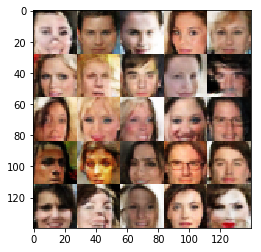

Epoch 9/10... Batch 1620... Discriminator Loss: 0.8545... Generator Loss: 1.6388
Epoch 9/10... Batch 1640... Discriminator Loss: 1.1125... Generator Loss: 1.8123
Epoch 9/10... Batch 1660... Discriminator Loss: 0.6566... Generator Loss: 1.4549
Epoch 9/10... Batch 1680... Discriminator Loss: 0.8891... Generator Loss: 1.3620
Epoch 9/10... Batch 1700... Discriminator Loss: 0.9597... Generator Loss: 1.5828
Epoch 9/10... Batch 1720... Discriminator Loss: 1.1887... Generator Loss: 0.6843
Epoch 9/10... Batch 1740... Discriminator Loss: 0.8820... Generator Loss: 1.7411
Epoch 9/10... Batch 1760... Discriminator Loss: 0.9983... Generator Loss: 1.2111
Epoch 9/10... Batch 1780... Discriminator Loss: 2.4156... Generator Loss: 0.3945
Epoch 9/10... Batch 1800... Discriminator Loss: 1.3941... Generator Loss: 0.8720


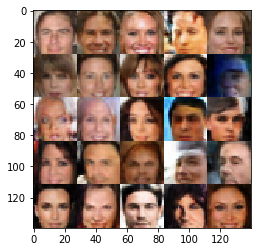

Epoch 9/10... Batch 1820... Discriminator Loss: 1.0639... Generator Loss: 0.8377
Epoch 9/10... Batch 1840... Discriminator Loss: 0.8874... Generator Loss: 0.9771
Epoch 9/10... Batch 1860... Discriminator Loss: 0.7602... Generator Loss: 2.1998
Epoch 9/10... Batch 1880... Discriminator Loss: 1.2328... Generator Loss: 1.2719
Epoch 9/10... Batch 1900... Discriminator Loss: 1.4261... Generator Loss: 0.7655
Epoch 9/10... Batch 1920... Discriminator Loss: 0.7486... Generator Loss: 1.5702
Epoch 9/10... Batch 1940... Discriminator Loss: 0.9844... Generator Loss: 2.1275
Epoch 9/10... Batch 1960... Discriminator Loss: 1.2357... Generator Loss: 0.9403
Epoch 9/10... Batch 1980... Discriminator Loss: 0.9490... Generator Loss: 1.9369
Epoch 9/10... Batch 2000... Discriminator Loss: 1.1651... Generator Loss: 0.7244


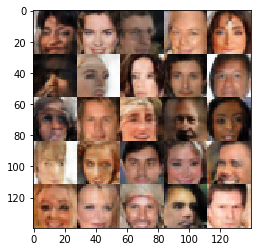

Epoch 9/10... Batch 2020... Discriminator Loss: 0.6874... Generator Loss: 2.0286
Epoch 9/10... Batch 2040... Discriminator Loss: 0.7942... Generator Loss: 1.5229
Epoch 9/10... Batch 2060... Discriminator Loss: 1.0024... Generator Loss: 1.1419
Epoch 9/10... Batch 2080... Discriminator Loss: 0.9280... Generator Loss: 1.5813
Epoch 9/10... Batch 2100... Discriminator Loss: 1.0742... Generator Loss: 0.9926
Epoch 9/10... Batch 2120... Discriminator Loss: 1.4747... Generator Loss: 1.0422
Epoch 9/10... Batch 2140... Discriminator Loss: 0.9077... Generator Loss: 1.2138
Epoch 9/10... Batch 2160... Discriminator Loss: 1.0425... Generator Loss: 1.0158
Epoch 9/10... Batch 2180... Discriminator Loss: 0.8491... Generator Loss: 1.6234
Epoch 9/10... Batch 2200... Discriminator Loss: 1.5197... Generator Loss: 0.5841


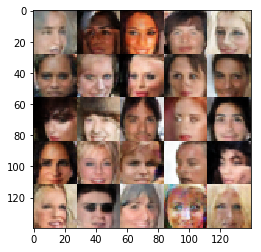

Epoch 9/10... Batch 2220... Discriminator Loss: 0.8498... Generator Loss: 1.8937
Epoch 9/10... Batch 2240... Discriminator Loss: 0.5849... Generator Loss: 2.4295
Epoch 9/10... Batch 2260... Discriminator Loss: 0.8448... Generator Loss: 1.5602
Epoch 9/10... Batch 2280... Discriminator Loss: 0.9011... Generator Loss: 1.4174
Epoch 9/10... Batch 2300... Discriminator Loss: 0.9211... Generator Loss: 0.7123
Epoch 9/10... Batch 2320... Discriminator Loss: 1.0862... Generator Loss: 1.2789
Epoch 9/10... Batch 2340... Discriminator Loss: 1.6659... Generator Loss: 0.4226
Epoch 9/10... Batch 2360... Discriminator Loss: 0.8709... Generator Loss: 1.8219
Epoch 9/10... Batch 2380... Discriminator Loss: 0.6326... Generator Loss: 2.6110
Epoch 9/10... Batch 2400... Discriminator Loss: 0.6486... Generator Loss: 1.7742


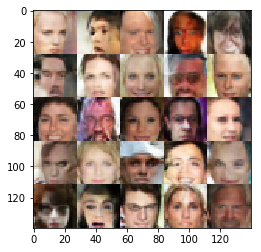

Epoch 9/10... Batch 2420... Discriminator Loss: 1.0087... Generator Loss: 0.8508
Epoch 9/10... Batch 2440... Discriminator Loss: 1.2978... Generator Loss: 1.0664
Epoch 9/10... Batch 2460... Discriminator Loss: 1.0446... Generator Loss: 1.1405
Epoch 9/10... Batch 2480... Discriminator Loss: 1.1414... Generator Loss: 1.2668
Epoch 9/10... Batch 2500... Discriminator Loss: 1.2047... Generator Loss: 0.8344
Epoch 9/10... Batch 2520... Discriminator Loss: 0.9473... Generator Loss: 1.0254
Epoch 9/10... Batch 2540... Discriminator Loss: 0.6107... Generator Loss: 2.2125
Epoch 9/10... Batch 2560... Discriminator Loss: 1.2224... Generator Loss: 0.7865
Epoch 9/10... Batch 2580... Discriminator Loss: 0.7704... Generator Loss: 1.5911
Epoch 9/10... Batch 2600... Discriminator Loss: 1.2143... Generator Loss: 1.7347


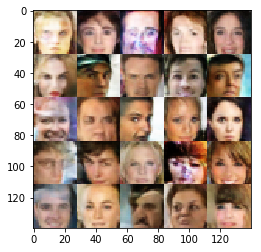

Epoch 9/10... Batch 2620... Discriminator Loss: 0.9376... Generator Loss: 1.6195
Epoch 9/10... Batch 2640... Discriminator Loss: 1.2432... Generator Loss: 0.8514
Epoch 9/10... Batch 2660... Discriminator Loss: 0.6006... Generator Loss: 1.8926
Epoch 9/10... Batch 2680... Discriminator Loss: 0.7238... Generator Loss: 2.0565
Epoch 9/10... Batch 2700... Discriminator Loss: 0.8748... Generator Loss: 0.9119
Epoch 9/10... Batch 2720... Discriminator Loss: 1.1537... Generator Loss: 0.9882
Epoch 9/10... Batch 2740... Discriminator Loss: 1.3418... Generator Loss: 0.8881
Epoch 9/10... Batch 2760... Discriminator Loss: 0.8634... Generator Loss: 1.2593
Epoch 9/10... Batch 2780... Discriminator Loss: 0.7524... Generator Loss: 1.4123
Epoch 9/10... Batch 2800... Discriminator Loss: 1.1603... Generator Loss: 1.0819


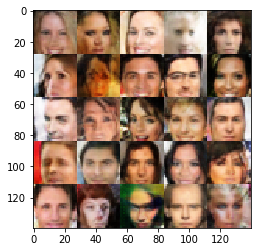

Epoch 9/10... Batch 2820... Discriminator Loss: 0.8912... Generator Loss: 1.7009
Epoch 9/10... Batch 2840... Discriminator Loss: 1.1238... Generator Loss: 1.1886
Epoch 9/10... Batch 2860... Discriminator Loss: 1.0911... Generator Loss: 0.7250
Epoch 9/10... Batch 2880... Discriminator Loss: 0.6926... Generator Loss: 1.6327
Epoch 9/10... Batch 2900... Discriminator Loss: 1.2640... Generator Loss: 0.8243
Epoch 9/10... Batch 2920... Discriminator Loss: 0.9976... Generator Loss: 1.0313
Epoch 9/10... Batch 2940... Discriminator Loss: 0.6100... Generator Loss: 1.2114
Epoch 9/10... Batch 2960... Discriminator Loss: 0.6393... Generator Loss: 2.2155
Epoch 9/10... Batch 2980... Discriminator Loss: 0.8402... Generator Loss: 1.9291
Epoch 9/10... Batch 3000... Discriminator Loss: 0.9977... Generator Loss: 1.3519


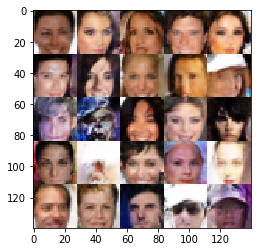

Epoch 9/10... Batch 3020... Discriminator Loss: 0.9765... Generator Loss: 1.2284
Epoch 9/10... Batch 3040... Discriminator Loss: 1.1370... Generator Loss: 1.8110
Epoch 9/10... Batch 3060... Discriminator Loss: 1.2881... Generator Loss: 0.5552
Epoch 9/10... Batch 3080... Discriminator Loss: 0.7177... Generator Loss: 1.5827
Epoch 9/10... Batch 3100... Discriminator Loss: 0.9833... Generator Loss: 1.5814
Epoch 9/10... Batch 3120... Discriminator Loss: 0.7607... Generator Loss: 2.5650
Epoch 9/10... Batch 3140... Discriminator Loss: 1.1010... Generator Loss: 1.9502
Epoch 9/10... Batch 3160... Discriminator Loss: 0.8452... Generator Loss: 1.4760
Epoch 10/10... Batch 20... Discriminator Loss: 0.9062... Generator Loss: 2.2019
Epoch 10/10... Batch 40... Discriminator Loss: 0.8293... Generator Loss: 1.2104
Epoch 10/10... Batch 60... Discriminator Loss: 1.1098... Generator Loss: 1.0664
Epoch 10/10... Batch 80... Discriminator Loss: 0.9602... Generator Loss: 1.3506
Epoch 10/10... Batch 100... Disc

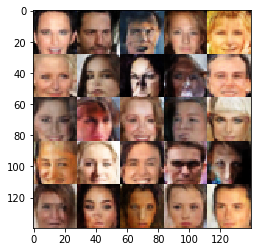

Epoch 10/10... Batch 220... Discriminator Loss: 1.2586... Generator Loss: 1.0084
Epoch 10/10... Batch 240... Discriminator Loss: 0.8493... Generator Loss: 1.4307
Epoch 10/10... Batch 260... Discriminator Loss: 0.8853... Generator Loss: 1.2257
Epoch 10/10... Batch 280... Discriminator Loss: 0.7293... Generator Loss: 2.1619
Epoch 10/10... Batch 300... Discriminator Loss: 1.2148... Generator Loss: 1.0947
Epoch 10/10... Batch 320... Discriminator Loss: 0.7584... Generator Loss: 1.3155
Epoch 10/10... Batch 340... Discriminator Loss: 0.9007... Generator Loss: 1.3829
Epoch 10/10... Batch 360... Discriminator Loss: 1.2369... Generator Loss: 1.1915
Epoch 10/10... Batch 380... Discriminator Loss: 0.7729... Generator Loss: 1.9893
Epoch 10/10... Batch 400... Discriminator Loss: 0.8061... Generator Loss: 1.6250


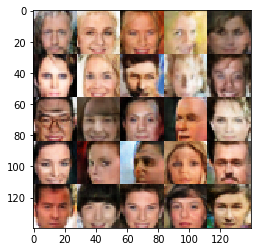

Epoch 10/10... Batch 420... Discriminator Loss: 0.8401... Generator Loss: 1.0077
Epoch 10/10... Batch 440... Discriminator Loss: 0.7474... Generator Loss: 1.8591
Epoch 10/10... Batch 460... Discriminator Loss: 1.0416... Generator Loss: 1.7959
Epoch 10/10... Batch 480... Discriminator Loss: 1.0228... Generator Loss: 1.4097
Epoch 10/10... Batch 500... Discriminator Loss: 0.6967... Generator Loss: 1.9916
Epoch 10/10... Batch 520... Discriminator Loss: 1.1366... Generator Loss: 0.8776
Epoch 10/10... Batch 540... Discriminator Loss: 0.6725... Generator Loss: 2.1127
Epoch 10/10... Batch 560... Discriminator Loss: 0.9677... Generator Loss: 1.2523
Epoch 10/10... Batch 580... Discriminator Loss: 0.8097... Generator Loss: 1.9470
Epoch 10/10... Batch 600... Discriminator Loss: 0.6903... Generator Loss: 1.8357


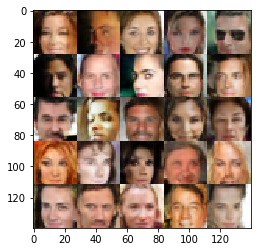

Epoch 10/10... Batch 620... Discriminator Loss: 0.6123... Generator Loss: 1.9935
Epoch 10/10... Batch 640... Discriminator Loss: 0.8778... Generator Loss: 1.5444
Epoch 10/10... Batch 660... Discriminator Loss: 1.0438... Generator Loss: 1.0978
Epoch 10/10... Batch 680... Discriminator Loss: 1.0966... Generator Loss: 1.0137
Epoch 10/10... Batch 700... Discriminator Loss: 0.7675... Generator Loss: 1.5387
Epoch 10/10... Batch 720... Discriminator Loss: 0.7958... Generator Loss: 1.4588
Epoch 10/10... Batch 740... Discriminator Loss: 1.0177... Generator Loss: 0.7769
Epoch 10/10... Batch 760... Discriminator Loss: 0.8351... Generator Loss: 1.5420
Epoch 10/10... Batch 780... Discriminator Loss: 0.9391... Generator Loss: 1.4947
Epoch 10/10... Batch 800... Discriminator Loss: 0.8917... Generator Loss: 1.6216


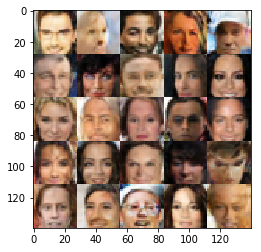

Epoch 10/10... Batch 820... Discriminator Loss: 1.0143... Generator Loss: 0.8846
Epoch 10/10... Batch 840... Discriminator Loss: 0.9578... Generator Loss: 1.4868
Epoch 10/10... Batch 860... Discriminator Loss: 1.0321... Generator Loss: 0.8681
Epoch 10/10... Batch 880... Discriminator Loss: 0.8026... Generator Loss: 1.5171
Epoch 10/10... Batch 900... Discriminator Loss: 0.8158... Generator Loss: 1.3174
Epoch 10/10... Batch 920... Discriminator Loss: 1.1097... Generator Loss: 0.9808
Epoch 10/10... Batch 940... Discriminator Loss: 0.5714... Generator Loss: 2.0044
Epoch 10/10... Batch 960... Discriminator Loss: 1.0103... Generator Loss: 1.2122
Epoch 10/10... Batch 980... Discriminator Loss: 0.5381... Generator Loss: 2.7440
Epoch 10/10... Batch 1000... Discriminator Loss: 0.9560... Generator Loss: 1.3195


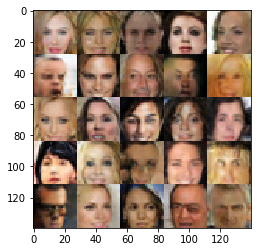

Epoch 10/10... Batch 1020... Discriminator Loss: 1.0212... Generator Loss: 0.8703
Epoch 10/10... Batch 1040... Discriminator Loss: 0.7407... Generator Loss: 1.8601
Epoch 10/10... Batch 1060... Discriminator Loss: 0.9547... Generator Loss: 1.2156
Epoch 10/10... Batch 1080... Discriminator Loss: 0.7469... Generator Loss: 1.8661
Epoch 10/10... Batch 1100... Discriminator Loss: 1.0997... Generator Loss: 1.0813
Epoch 10/10... Batch 1120... Discriminator Loss: 0.9027... Generator Loss: 1.3305
Epoch 10/10... Batch 1140... Discriminator Loss: 0.6431... Generator Loss: 2.3877
Epoch 10/10... Batch 1160... Discriminator Loss: 1.0916... Generator Loss: 1.2769
Epoch 10/10... Batch 1180... Discriminator Loss: 0.6391... Generator Loss: 1.5439
Epoch 10/10... Batch 1200... Discriminator Loss: 1.3005... Generator Loss: 1.0297


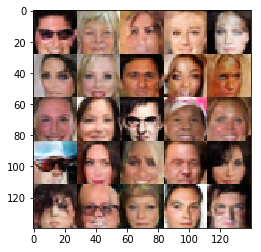

Epoch 10/10... Batch 1220... Discriminator Loss: 1.1398... Generator Loss: 0.9719
Epoch 10/10... Batch 1240... Discriminator Loss: 1.0495... Generator Loss: 1.1335
Epoch 10/10... Batch 1260... Discriminator Loss: 0.7039... Generator Loss: 2.0483
Epoch 10/10... Batch 1280... Discriminator Loss: 0.8634... Generator Loss: 2.0127
Epoch 10/10... Batch 1300... Discriminator Loss: 1.2175... Generator Loss: 0.7406
Epoch 10/10... Batch 1320... Discriminator Loss: 1.2123... Generator Loss: 2.5029
Epoch 10/10... Batch 1340... Discriminator Loss: 0.7257... Generator Loss: 1.4433
Epoch 10/10... Batch 1360... Discriminator Loss: 0.8225... Generator Loss: 1.9997
Epoch 10/10... Batch 1380... Discriminator Loss: 1.2596... Generator Loss: 0.9640
Epoch 10/10... Batch 1400... Discriminator Loss: 0.7623... Generator Loss: 1.5540


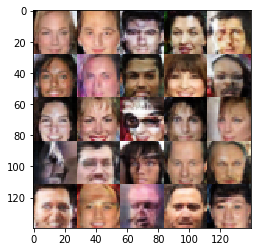

Epoch 10/10... Batch 1420... Discriminator Loss: 0.9774... Generator Loss: 1.1851
Epoch 10/10... Batch 1440... Discriminator Loss: 1.0268... Generator Loss: 1.1737
Epoch 10/10... Batch 1460... Discriminator Loss: 1.4467... Generator Loss: 0.6983
Epoch 10/10... Batch 1480... Discriminator Loss: 1.2917... Generator Loss: 1.0699
Epoch 10/10... Batch 1500... Discriminator Loss: 0.7931... Generator Loss: 1.6949
Epoch 10/10... Batch 1520... Discriminator Loss: 0.8642... Generator Loss: 1.1993
Epoch 10/10... Batch 1540... Discriminator Loss: 0.6128... Generator Loss: 2.9132
Epoch 10/10... Batch 1560... Discriminator Loss: 1.9997... Generator Loss: 3.4988
Epoch 10/10... Batch 1580... Discriminator Loss: 0.9465... Generator Loss: 1.3835
Epoch 10/10... Batch 1600... Discriminator Loss: 0.8014... Generator Loss: 1.7927


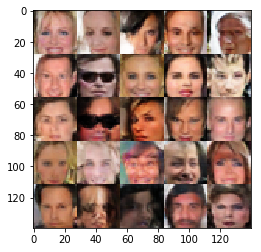

Epoch 10/10... Batch 1620... Discriminator Loss: 0.6807... Generator Loss: 1.8880
Epoch 10/10... Batch 1640... Discriminator Loss: 0.8155... Generator Loss: 1.1406
Epoch 10/10... Batch 1660... Discriminator Loss: 0.6625... Generator Loss: 1.9800
Epoch 10/10... Batch 1680... Discriminator Loss: 0.6994... Generator Loss: 2.2464
Epoch 10/10... Batch 1700... Discriminator Loss: 0.6559... Generator Loss: 1.7350
Epoch 10/10... Batch 1720... Discriminator Loss: 1.0032... Generator Loss: 1.4054
Epoch 10/10... Batch 1740... Discriminator Loss: 0.8587... Generator Loss: 1.1807
Epoch 10/10... Batch 1760... Discriminator Loss: 1.1545... Generator Loss: 0.7429
Epoch 10/10... Batch 1780... Discriminator Loss: 0.9983... Generator Loss: 1.3060
Epoch 10/10... Batch 1800... Discriminator Loss: 1.7822... Generator Loss: 0.5962


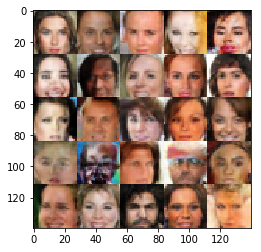

Epoch 10/10... Batch 1820... Discriminator Loss: 1.0115... Generator Loss: 1.0966
Epoch 10/10... Batch 1840... Discriminator Loss: 1.1368... Generator Loss: 1.4457
Epoch 10/10... Batch 1860... Discriminator Loss: 0.7231... Generator Loss: 1.4578
Epoch 10/10... Batch 1880... Discriminator Loss: 1.0312... Generator Loss: 1.5000
Epoch 10/10... Batch 1900... Discriminator Loss: 0.9588... Generator Loss: 0.7575
Epoch 10/10... Batch 1920... Discriminator Loss: 1.1835... Generator Loss: 0.9962
Epoch 10/10... Batch 1940... Discriminator Loss: 0.7870... Generator Loss: 2.9335
Epoch 10/10... Batch 1960... Discriminator Loss: 1.0817... Generator Loss: 0.8894
Epoch 10/10... Batch 1980... Discriminator Loss: 1.0143... Generator Loss: 1.2623
Epoch 10/10... Batch 2000... Discriminator Loss: 1.4223... Generator Loss: 0.7368


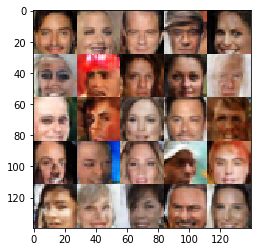

Epoch 10/10... Batch 2020... Discriminator Loss: 0.5863... Generator Loss: 2.6786
Epoch 10/10... Batch 2040... Discriminator Loss: 0.9794... Generator Loss: 1.6475
Epoch 10/10... Batch 2060... Discriminator Loss: 0.9147... Generator Loss: 1.4933
Epoch 10/10... Batch 2080... Discriminator Loss: 0.7648... Generator Loss: 1.6546
Epoch 10/10... Batch 2100... Discriminator Loss: 0.8608... Generator Loss: 1.1700
Epoch 10/10... Batch 2120... Discriminator Loss: 0.8296... Generator Loss: 1.9765
Epoch 10/10... Batch 2140... Discriminator Loss: 0.8824... Generator Loss: 2.1179
Epoch 10/10... Batch 2160... Discriminator Loss: 0.7448... Generator Loss: 2.0407
Epoch 10/10... Batch 2180... Discriminator Loss: 0.9781... Generator Loss: 1.4592
Epoch 10/10... Batch 2200... Discriminator Loss: 0.7679... Generator Loss: 2.2697


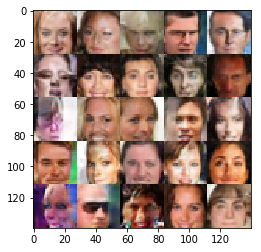

Epoch 10/10... Batch 2220... Discriminator Loss: 0.8439... Generator Loss: 1.4031
Epoch 10/10... Batch 2240... Discriminator Loss: 0.6858... Generator Loss: 4.1951
Epoch 10/10... Batch 2260... Discriminator Loss: 0.7820... Generator Loss: 2.1712
Epoch 10/10... Batch 2280... Discriminator Loss: 1.1893... Generator Loss: 0.9169
Epoch 10/10... Batch 2300... Discriminator Loss: 0.7911... Generator Loss: 1.1183
Epoch 10/10... Batch 2320... Discriminator Loss: 0.9098... Generator Loss: 1.0552
Epoch 10/10... Batch 2340... Discriminator Loss: 0.9517... Generator Loss: 1.3929
Epoch 10/10... Batch 2360... Discriminator Loss: 0.6644... Generator Loss: 1.9460
Epoch 10/10... Batch 2380... Discriminator Loss: 1.0066... Generator Loss: 1.4399
Epoch 10/10... Batch 2400... Discriminator Loss: 1.0653... Generator Loss: 1.4399


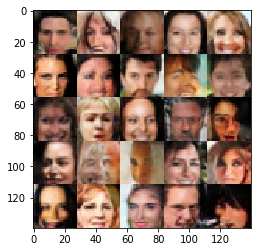

Epoch 10/10... Batch 2420... Discriminator Loss: 1.1022... Generator Loss: 1.3315
Epoch 10/10... Batch 2440... Discriminator Loss: 0.8883... Generator Loss: 1.6472
Epoch 10/10... Batch 2460... Discriminator Loss: 0.9255... Generator Loss: 1.4848
Epoch 10/10... Batch 2480... Discriminator Loss: 0.9377... Generator Loss: 0.9929
Epoch 10/10... Batch 2500... Discriminator Loss: 1.1439... Generator Loss: 1.0951
Epoch 10/10... Batch 2520... Discriminator Loss: 1.0735... Generator Loss: 1.1107
Epoch 10/10... Batch 2540... Discriminator Loss: 0.7516... Generator Loss: 1.7545
Epoch 10/10... Batch 2560... Discriminator Loss: 1.4152... Generator Loss: 0.7522
Epoch 10/10... Batch 2580... Discriminator Loss: 0.9586... Generator Loss: 1.4745
Epoch 10/10... Batch 2600... Discriminator Loss: 0.6526... Generator Loss: 2.1849


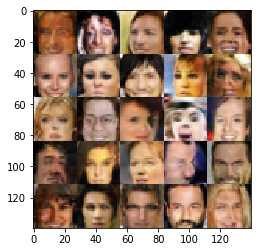

Epoch 10/10... Batch 2620... Discriminator Loss: 0.9834... Generator Loss: 1.2235
Epoch 10/10... Batch 2640... Discriminator Loss: 0.9216... Generator Loss: 1.6754
Epoch 10/10... Batch 2660... Discriminator Loss: 0.8644... Generator Loss: 1.1986
Epoch 10/10... Batch 2680... Discriminator Loss: 0.6341... Generator Loss: 2.0530
Epoch 10/10... Batch 2700... Discriminator Loss: 0.6639... Generator Loss: 1.8744
Epoch 10/10... Batch 2720... Discriminator Loss: 1.0886... Generator Loss: 1.0163
Epoch 10/10... Batch 2740... Discriminator Loss: 1.3036... Generator Loss: 1.0447
Epoch 10/10... Batch 2760... Discriminator Loss: 1.5098... Generator Loss: 0.7177
Epoch 10/10... Batch 2780... Discriminator Loss: 1.0856... Generator Loss: 1.2594
Epoch 10/10... Batch 2800... Discriminator Loss: 0.8521... Generator Loss: 1.5745


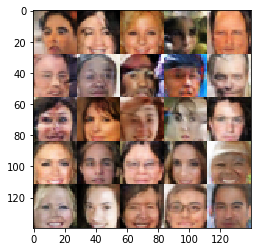

Epoch 10/10... Batch 2820... Discriminator Loss: 1.0909... Generator Loss: 1.1549
Epoch 10/10... Batch 2840... Discriminator Loss: 0.9148... Generator Loss: 2.1306
Epoch 10/10... Batch 2860... Discriminator Loss: 0.9299... Generator Loss: 1.2362
Epoch 10/10... Batch 2880... Discriminator Loss: 0.8108... Generator Loss: 1.9779
Epoch 10/10... Batch 2900... Discriminator Loss: 1.3199... Generator Loss: 0.9418
Epoch 10/10... Batch 2920... Discriminator Loss: 0.6185... Generator Loss: 2.2321
Epoch 10/10... Batch 2940... Discriminator Loss: 0.7491... Generator Loss: 1.8733
Epoch 10/10... Batch 2960... Discriminator Loss: 0.7949... Generator Loss: 1.9850
Epoch 10/10... Batch 2980... Discriminator Loss: 0.6716... Generator Loss: 1.8387
Epoch 10/10... Batch 3000... Discriminator Loss: 0.7349... Generator Loss: 1.4932


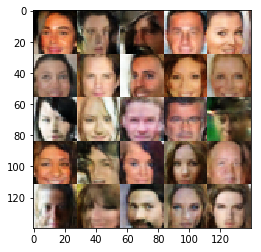

Epoch 10/10... Batch 3020... Discriminator Loss: 0.6301... Generator Loss: 2.6497
Epoch 10/10... Batch 3040... Discriminator Loss: 0.9992... Generator Loss: 0.8302
Epoch 10/10... Batch 3060... Discriminator Loss: 0.8956... Generator Loss: 1.4200
Epoch 10/10... Batch 3080... Discriminator Loss: 0.8217... Generator Loss: 1.5175
Epoch 10/10... Batch 3100... Discriminator Loss: 0.9091... Generator Loss: 2.0617
Epoch 10/10... Batch 3120... Discriminator Loss: 0.7577... Generator Loss: 1.9274
Epoch 10/10... Batch 3140... Discriminator Loss: 1.0230... Generator Loss: 0.9279
Epoch 10/10... Batch 3160... Discriminator Loss: 0.7569... Generator Loss: 1.4637


In [13]:
batch_size = 64
z_dim = 164
learning_rate = 0.0002
beta1 = 0.4


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 10

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    dis, gen, f1 = train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

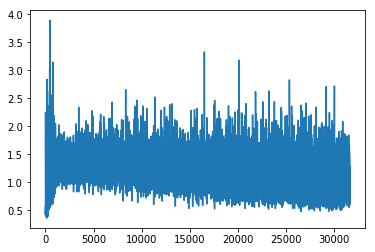

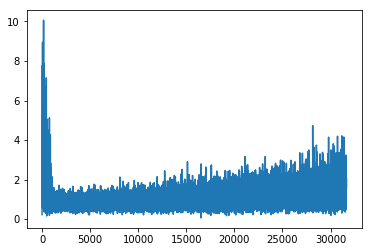

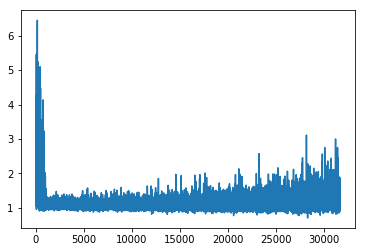

In [14]:
import matplotlib.pyplot as plt

plt.plot(dis)
plt.show()
plt.plot(gen)
plt.show()
plt.plot(f1)
plt.show()

In [15]:
idx = f1.index(min(f1))
print(dis[idx], gen[idx])

0.83051276 0.5755906


### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.